# Benchmark: Different Noises

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import numpy as np
import matplotlib.pyplot as plt

from enum import Enum, auto

import torch
import torch.nn as nn
import torch.nn.functional as F


class NoiseType(Enum):
    DIAGONAL = auto()
    ISOTROPIC = auto()
    ISOTROPIC_ACROSS_CLUSTERS = auto()
    FIXED = auto()
    LAPLACE = auto()


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # else 'mps' if torch.backends.mps.is_available() else 'cpu')
print("Device:", device)

import random
import numpy as np
import torch

def set_all_seeds(seed):
    # Set Python random seed
    random.seed(seed)

    # Set NumPy random seed
    np.random.seed(seed)

    # Set PyTorch seed
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # For multi-GPU setups

    # Ensure deterministic behavior in PyTorch
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_all_seeds(42)


# Define a decorator that randomly selects one of the multi-valued outputs
def rand_mod(y_func):
    def wrapper(x, *args, **kwargs):
        y_values = y_func(x, *args, **kwargs)
        y_rand = np.random.choice(y_values)
        return y_rand + 0.02 * np.random.randn(*y_rand.shape)
    return wrapper

Device: cpu


In [2]:
# Multi-valude function of x -> y1, y2, y3 ...
def y_circle(x, r = 1):
    y1 = np.sqrt(r - x**2)
    y2 = -np.sqrt(r - x**2)
    return y1, y2

def y_line(x, m = 1):
    return m * x, 0, -m * x

def y_hyperbola(x, a = 0.1, b = 1):
    y1 = np.sqrt(a**2 + b**2 * x**2)
    y2 = -np.sqrt(a**2 + b**2 * x**2)
    return y1, y2

def y_parabola(x, a = 1):
    return a * x**2, -a * x**2


## Selecting the Shape

Please select the 2D shape for the analysis.

In [3]:
y_multi = y_hyperbola

True


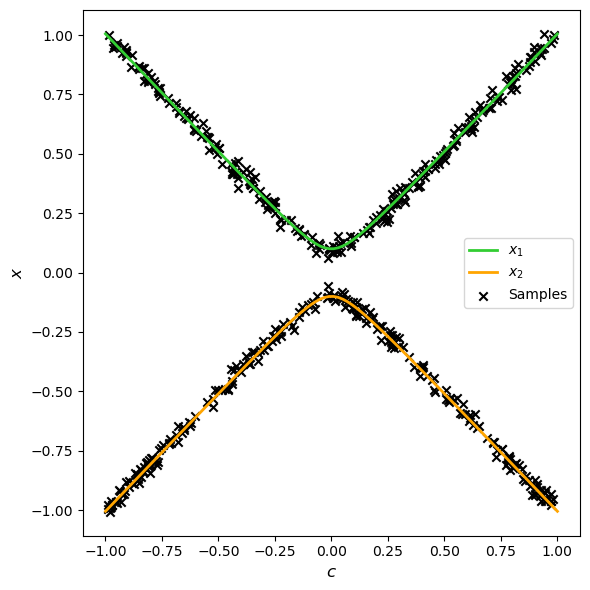

In [4]:
# Apply the rand_mod function to y_circle
y_multi_rand = rand_mod(y_multi)

# Create a dataset of (x, y) pairs
num_samples = 500
x = np.random.uniform(-1, 1, num_samples)
y = np.array([y_multi_rand(x_i) for x_i in x])

# # If we want not conflicting data
# num_samples = 500
# x = np.random.uniform(-1, 1, num_samples)
# y = np.array([y_multi(x_i)[0] for x_i in x])

print(x.shape == y.shape)

# Load dataset
batch_size = 32
x_tensor = torch.tensor(x, dtype=torch.float32).unsqueeze(1)
y_tensor = torch.tensor(y, dtype=torch.float32).unsqueeze(1)
dataset = TensorDataset(x_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Plot the function and the samples
x_vals = np.linspace(-1, 1, 100)
y_vals = [y_multi(x_i) for x_i in x_vals]
y_vals_transposed = list(zip(*y_vals))

# Generate the global test set
test_x_vals = np.linspace(-1, 1, 100)  # Fixed test x values
test_y_vals = [y_multi(x_i) for x_i in test_x_vals]  # Corresponding true y values
test_y_vals_transposed = list(zip(*test_y_vals))  # Transpose for mode comparison

# Data bounds for counter-sample generation
y_min = torch.tensor([-1])  # Joint y_target limits (radians)
y_max = torch.tensor([1])

# Plot the function and the samples
plt.figure(figsize=(6, 6))
colors = ['limegreen', 'orange']  # Colors for the two modes

for i, (y_val, color) in enumerate(zip(y_vals_transposed, colors)):
    plt.plot(x_vals, y_val, color=color, label=f'$x_{i+1}$', linewidth=2)

plt.scatter(x, y, marker='x', color='black', label='Samples')
plt.xlabel('$c$', fontsize=12)
plt.ylabel('$x$', fontsize=12)
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

# Save the figure as a high-resolution image
plt.savefig('2d_geometric_shapes.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

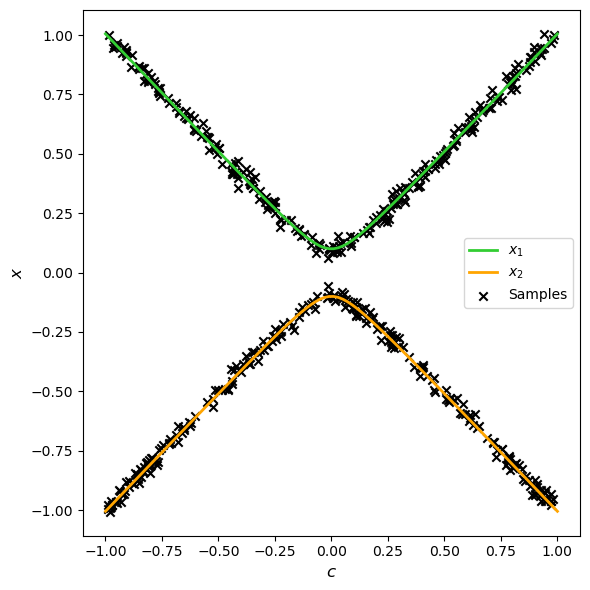

In [5]:
plt.figure(figsize=(6, 6))
colors = ['limegreen', 'orange']  # Colors for the two modes

for i, (test_y_vals, color) in enumerate(zip(test_y_vals_transposed, colors)):
    plt.plot(test_x_vals, test_y_vals, color=color, label=f'$x_{i+1}$', linewidth=2)

plt.scatter(x,y, marker='x', color='black', label='Samples')
plt.xlabel('$c$', fontsize=12)
plt.ylabel('$x$', fontsize=12)
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

# Save the figure as a high-resolution image
plt.savefig('2d_geometric_shapes.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

# Evaluation metrics

In [6]:
from scipy.stats import entropy, wasserstein_distance
import random
from methods.ibc import ebm_infer

def compute_metrics(generator, x_test, test_y_vals, y_func, K, model = 'Sampling', num_bins=50, tolerance=0.075, device="cpu"):
    """
    Compute mode coverage, KL divergence, and Wasserstein distance for test data.

    Args:
        generator (torch.nn.Module): The trained generator model.
        x_test (np.array): Input test values.
        test_y_vals (np.array): True y values for the test set (precomputed).
        y_func (function): Function to compute true modes for each x.
        K (int): Number of samples to generate per x.
        num_bins (int): Number of bins for histogram-based metrics.
        tolerance (float): Tolerance for mode matching.
        device (str): Device for computation.

    Returns:
        metrics (dict): Contains mode coverage, KL divergence, and Wasserstein distance.
    """
    # Step 1: Evaluate Mode Coverage and Generate Representative Test Set
    num_inputs = len(x_test)
    avg_modes_cov = 0
    num_modes_covered = 0
    generated_test_y_vals = []  # Store representative generated samples

    for i, x in enumerate(x_test):
        
        # Compute true modes for this x dynamically
        true_modes = np.array(y_func(x))
        
        if model == 'Network':
            # Predict K samples for this x
            x_tensor = torch.tensor([[x]], dtype=torch.float32).repeat(K, 1).to(device)

            generated_samples = generator.forward(x_tensor).detach().cpu().numpy().flatten()
        
        elif model == 'Sampling':
            # Sample K samples for this x
            x_tensor = torch.tensor([[x]], dtype=torch.float32).repeat(K, 1).to(device)
            z = torch.randn(K, generator.latent_size, dtype=torch.float32).to(device)

            generated_samples = generator.sample(z, x_tensor).detach().cpu().numpy().flatten()
        
        elif model == 'Generator':
            # Generate K samples for this x
            x_tensor = torch.tensor([[x]], dtype=torch.float32).repeat(K, 1).to(device)
            z = torch.randn(K, generator.latent_size, dtype=torch.float32).to(device)

            generated_samples = generator.forward(z, x_tensor).detach().cpu().numpy().flatten()
            
        elif model == 'IBC':
            generated_samples = []
            for i in range(K):
                x_tensor = torch.tensor([[x]], dtype=torch.float32).to(device)
                prediction = ebm_infer(generator, x_tensor, y_min.to(device), y_max.to(device))
                generated_samples.append(prediction)
        
        # Check if all true modes are matched within tolerance
        mode_match = [np.any(np.abs(generated_samples - mode) <= tolerance) for mode in true_modes]

        if sum(mode_match) == len(true_modes):  # All modes covered
            num_modes_covered +=  1
        avg_modes_cov +=  sum(mode_match)

        # Append one representative sample for each x to build generated_test_y_vals
        generated_test_y_vals.append(random.choice(generated_samples))  # Representative sample
            

    # Compute mode coverage
    mode_coverage = num_modes_covered / num_inputs *100 
    avg_modes_coverage = avg_modes_cov/ num_inputs
    generated_test_y_vals = np.array(generated_test_y_vals)

    # Step 2: Compute KL Divergence and Wasserstein Distance
    # Flatten test_y_vals and generated_test_y_vals for comparison
    true_y_flat = test_y_vals.flatten()
    generated_y_flat = generated_test_y_vals.flatten()

    # Compute histograms for KL divergence and Wasserstein distance
    hist_true, bins = np.histogram(true_y_flat, bins=num_bins, density=True)
    hist_generated, _ = np.histogram(generated_y_flat, bins=bins, density=True)

    # Smooth histograms to avoid zero probabilities
    hist_true += 1e-8
    hist_generated += 1e-8

    # Normalize histograms
    hist_true /= hist_true.sum()
    hist_generated /= hist_generated.sum()

    # KL Divergence
    kl_div = entropy(hist_true, hist_generated)

    # Wasserstein Distance
    w_distance = wasserstein_distance(hist_true, hist_generated)

    # Return metrics
    return {
        "Mode Coverage (%)": mode_coverage,
        "Avgerage Modes coveraged": avg_modes_coverage,
        "KL Divergence": kl_div,
        "Wasserstein Distance": w_distance,
    }



In [7]:
NUM_TRIALS = 5
TOLERANCE = 0.07

# Problem set-up Parameter


In [8]:
input_size = 1  # x, y x_input
action_size = 1  # joint y_target
condition_size = 1
output_size = 1

# EBGAN-MDN

Hyperparameter

In [9]:
# Hyperparameters
num_gaussians = 2

latent_size = 1
hidden_size = 64

num_epochs = 100
batch_size = 32

neg_count = 32
repeat_energy_updates = 5

learning_rate_e = 0.001
learning_rate_g = 0.0005

epoch_num_eval = 100

# Configuration parameter 
alpha = 1
dynamic_scaling_true = False
min_scale = 0.1

# Tests

In [10]:
# Initialize a new MDN generator
from methods.ebgan import EnergyModel,  generate_counter_samples
from methods.mdn import MDNGenerator, mdn_loss

In [11]:
def evaluate_model(energy_model, generator, epoch, latent_size, device, id = 0):
    # Generate grid points within the range of x values
    x_range = np.linspace(-1, 1, 100)
    y_range = np.linspace(-1, 1, 100)
    grid_x, grid_y = np.meshgrid(x_range, y_range)
    grid_points = torch.tensor(np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32).to(device)

    # Compute energy model output for each grid point
    energy_outputs = energy_model(grid_points[:, :1], grid_points[:, 1:]).detach().cpu().numpy()
    energy_outputs = energy_outputs.reshape(100, 100)

    # Normalize every column of the heatmap
    energy_outputs = (energy_outputs - energy_outputs.min(axis=0)) / (energy_outputs.max(axis=0) - energy_outputs.min(axis=0))

    # Plot the heatmap and the function, samples, and predictions in the same figure
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot the heatmap
    heatmap = ax.imshow(energy_outputs, extent=(-1, 1, -1, 1), origin='lower', cmap='coolwarm', alpha=0.5)

    # Plot the samples
    ax.scatter(x, y, marker='x', color='black', label='Original samples')

    # Random sample the query points and get the predictions using mdn_generator
    num_query_points = 200
    query_points = np.linspace(-1, 1, num_query_points)
    query_points_tensor = torch.tensor(query_points, dtype=torch.float32).unsqueeze(1).to(device)
    z = torch.randn(num_query_points, latent_size).to(device)

    # Generate samples from the mixture model
    predictions_mdn = generator.sample(z, query_points_tensor).detach().cpu().numpy()

    # Plot the MDN generator predictions
    ax.scatter(query_points, predictions_mdn, marker='o', color='red', label='MDN Generator Predictions', alpha=0.9)

    # Set limits to cut the plot within -1, 1
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)

    ax.set_xlabel('c')
    ax.set_ylabel('x')
    ax.grid()
    ax.legend()
    # plt.title(f"Evaluation at Epoch {epoch}")
    plt.savefig(f'images/EBM_MDN_{id}_extra_1.png', dpi=300, bbox_inches='tight')
    plt.show()

In [12]:
from methods.ebgan_mdn import train_ebgan_mdn

def train_and_evaluate(num_trials, dataloader, test_x_vals, test_y_vals_transposed, 
                       num_epochs, y_min, y_max, 
                       neg_count, repeat_energy_updates, device, alpha, dynamic_scaling_true, min_scale, y_multi):
    results = {"KL Divergence": [], "Wasserstein Distance": [], "Mode Coverage (%)": [], "Avgerage Modes coveraged": []}

    for trial in range(num_trials):
        print(f"\n=== Training Run {trial + 1} ===")
        
        ebgan_mdn_generator = MDNGenerator(latent_size, hidden_size, output_size, num_gaussians, condition_size).to(device)
        ebgan_energy_model = EnergyModel(condition_size, output_size, hidden_size).to(device)

        # Optimizer
        optimizer_ebgan_e = optim.Adam(ebgan_energy_model.parameters(), lr=learning_rate_e)
        optimizer_ebgan_g = optim.Adam(ebgan_mdn_generator.parameters(), lr=learning_rate_g)
        scheduler_e = optim.lr_scheduler.StepLR(optimizer_ebgan_e, step_size=20, gamma=0.5)
        scheduler_g = optim.lr_scheduler.StepLR(optimizer_ebgan_g, step_size=20, gamma=0.5)
        
        # Train the model
        train_ebgan_mdn(dataloader, ebgan_energy_model, ebgan_mdn_generator, optimizer_ebgan_e, optimizer_ebgan_g, 
                        scheduler_e, scheduler_g, num_epochs, None, y_min, y_max, neg_count, 
                        repeat_energy_updates, device, alpha, dynamic_scaling_true, min_scale)

        # Flatten the true test y values for metric computation
        true_y_flat = np.array(test_y_vals_transposed).reshape(-1, len(test_x_vals)).T

        # Compute metrics  
        metrics = compute_metrics(ebgan_mdn_generator, test_x_vals, true_y_flat , y_multi, K = 10, num_bins=50, tolerance=TOLERANCE)
        for key in results.keys():
            results[key].append(metrics[key])

        print(f"Run {trial + 1} - KL Divergence: {metrics["KL Divergence"]:.4f}, Wasserstein Distance: {metrics["Wasserstein Distance"]:.4f}, Mode Coverage (%): {metrics["Mode Coverage (%)"]}, Avgerage Modes coveraged: {metrics["Avgerage Modes coveraged"]}")
        
        evaluate_model(ebgan_energy_model, ebgan_mdn_generator, num_epochs, ebgan_mdn_generator.latent_size, device, trial)
    # Compute averages and standard deviations
    for metric, values in results.items():
        avg = np.mean(values)
        std = np.std(values)
        print(f"{metric}: {avg:.4f} ± {std:.4f}")

    return results



=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4830, Generator Loss: 0.2062, Generator Energy Loss: 0.0078, Generator MDN Loss: 0.1984
Epoch [2/100], Energy Loss: 3.2846, Generator Loss: 0.1519, Generator Energy Loss: 0.0635, Generator MDN Loss: 0.0884
Epoch [3/100], Energy Loss: 2.9547, Generator Loss: 0.0437, Generator Energy Loss: 0.0160, Generator MDN Loss: 0.0277
Epoch [4/100], Energy Loss: 2.6104, Generator Loss: 0.0402, Generator Energy Loss: -0.0010, Generator MDN Loss: 0.0413
Epoch [5/100], Energy Loss: 2.3661, Generator Loss: 0.5115, Generator Energy Loss: 0.4478, Generator MDN Loss: 0.0638
Epoch [6/100], Energy Loss: 2.1919, Generator Loss: 1.0489, Generator Energy Loss: 1.0232, Generator MDN Loss: 0.0257
Epoch [7/100], Energy Loss: 2.0657, Generator Loss: 1.2709, Generator Energy Loss: 1.2524, Generator MDN Loss: 0.0185
Epoch [8/100], Energy Loss: 1.9783, Generator Loss: 1.7862, Generator Energy Loss: 1.7578, Generator MDN Loss: 0.0284
Epoch [9/100], Energy Loss: 1.9

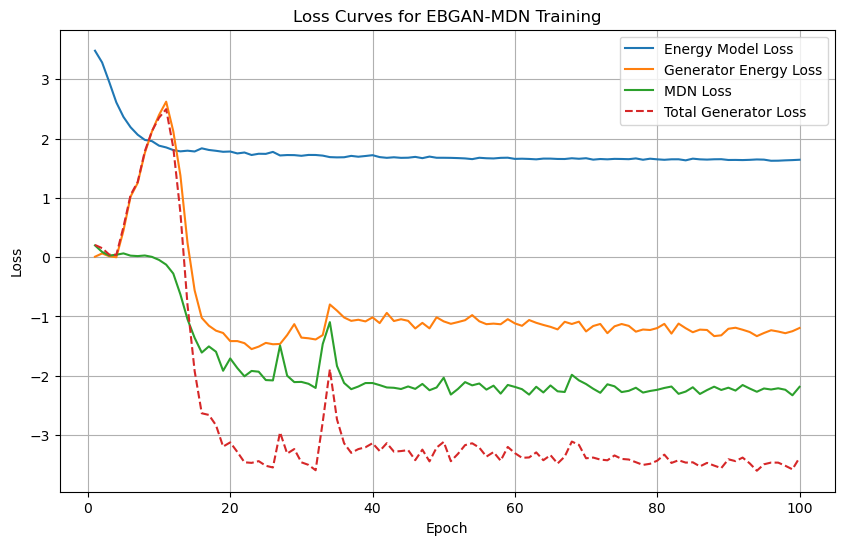

Run 1 - KL Divergence: 2.9154, Wasserstein Distance: 0.0091, Mode Coverage (%): 98.0, Avgerage Modes coveraged: 1.98


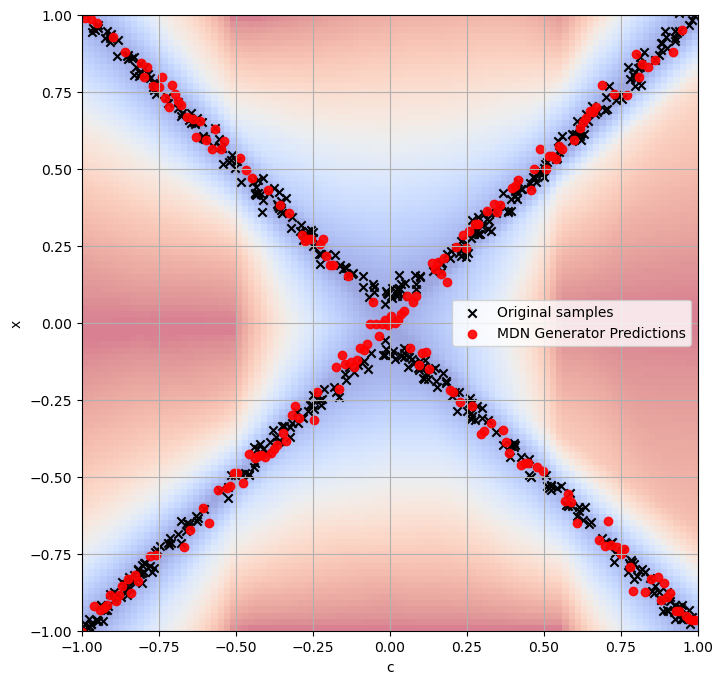


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4846, Generator Loss: 0.2475, Generator Energy Loss: 0.1456, Generator MDN Loss: 0.1019
Epoch [2/100], Energy Loss: 3.3356, Generator Loss: 0.1925, Generator Energy Loss: 0.1644, Generator MDN Loss: 0.0281
Epoch [3/100], Energy Loss: 3.0667, Generator Loss: 0.4874, Generator Energy Loss: 0.4707, Generator MDN Loss: 0.0167
Epoch [4/100], Energy Loss: 2.8326, Generator Loss: 0.8722, Generator Energy Loss: 0.8766, Generator MDN Loss: -0.0043
Epoch [5/100], Energy Loss: 2.6520, Generator Loss: 1.0325, Generator Energy Loss: 1.0466, Generator MDN Loss: -0.0141
Epoch [6/100], Energy Loss: 2.5147, Generator Loss: 1.5493, Generator Energy Loss: 1.5620, Generator MDN Loss: -0.0126
Epoch [7/100], Energy Loss: 2.3874, Generator Loss: 1.4747, Generator Energy Loss: 1.4967, Generator MDN Loss: -0.0221
Epoch [8/100], Energy Loss: 2.2863, Generator Loss: 2.0304, Generator Energy Loss: 2.0813, Generator MDN Loss: -0.0510
Epoch [9/100], Energy Loss:

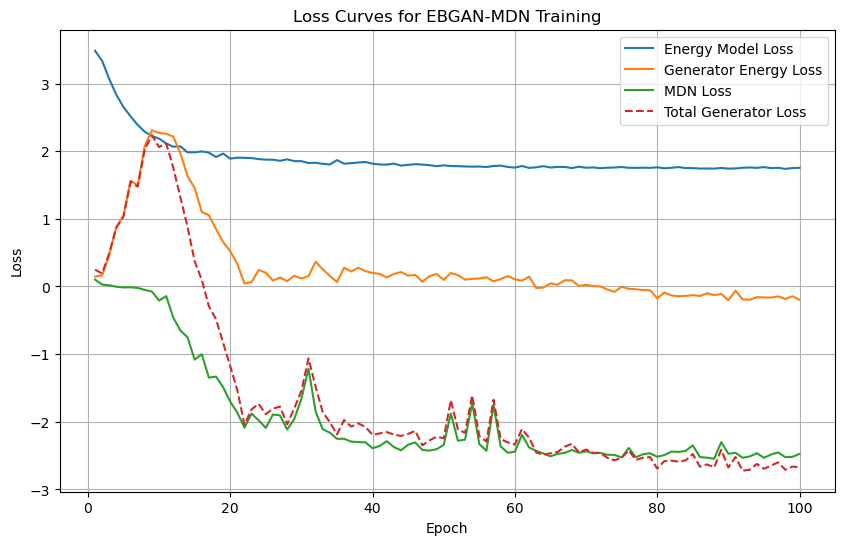

Run 2 - KL Divergence: 2.1823, Wasserstein Distance: 0.0066, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


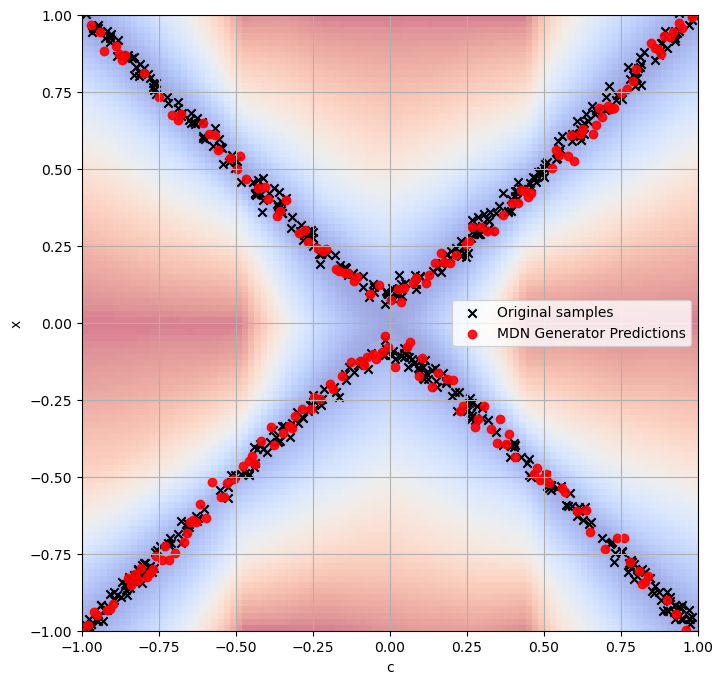


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4925, Generator Loss: 0.3586, Generator Energy Loss: 0.1784, Generator MDN Loss: 0.1802
Epoch [2/100], Energy Loss: 3.3324, Generator Loss: 0.3663, Generator Energy Loss: 0.2892, Generator MDN Loss: 0.0772
Epoch [3/100], Energy Loss: 3.0309, Generator Loss: 0.6105, Generator Energy Loss: 0.5714, Generator MDN Loss: 0.0391
Epoch [4/100], Energy Loss: 2.7220, Generator Loss: 0.9948, Generator Energy Loss: 0.9474, Generator MDN Loss: 0.0474
Epoch [5/100], Energy Loss: 2.4851, Generator Loss: 1.2430, Generator Energy Loss: 1.2216, Generator MDN Loss: 0.0214
Epoch [6/100], Energy Loss: 2.3568, Generator Loss: 1.6799, Generator Energy Loss: 1.6161, Generator MDN Loss: 0.0638
Epoch [7/100], Energy Loss: 2.2208, Generator Loss: 1.9178, Generator Energy Loss: 1.8972, Generator MDN Loss: 0.0206
Epoch [8/100], Energy Loss: 2.1785, Generator Loss: 2.3128, Generator Energy Loss: 2.3344, Generator MDN Loss: -0.0216
Epoch [9/100], Energy Loss: 2.0

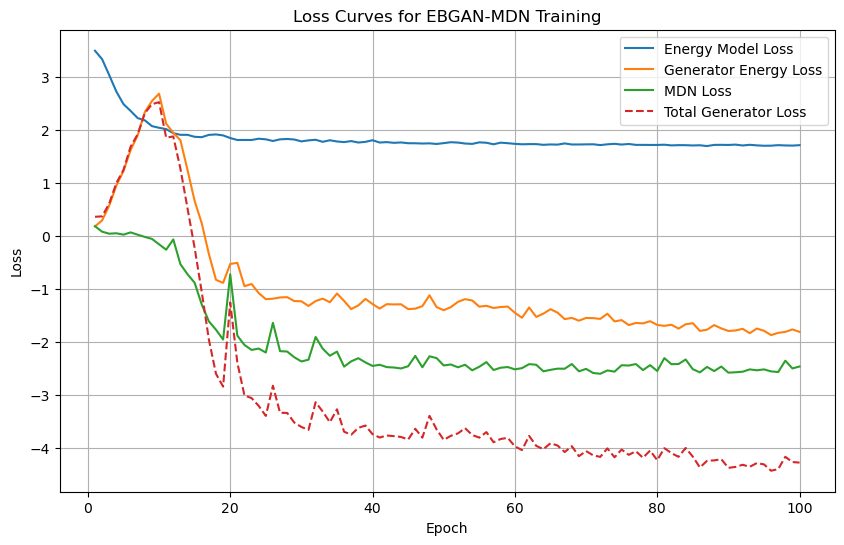

Run 3 - KL Divergence: 1.6642, Wasserstein Distance: 0.0075, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


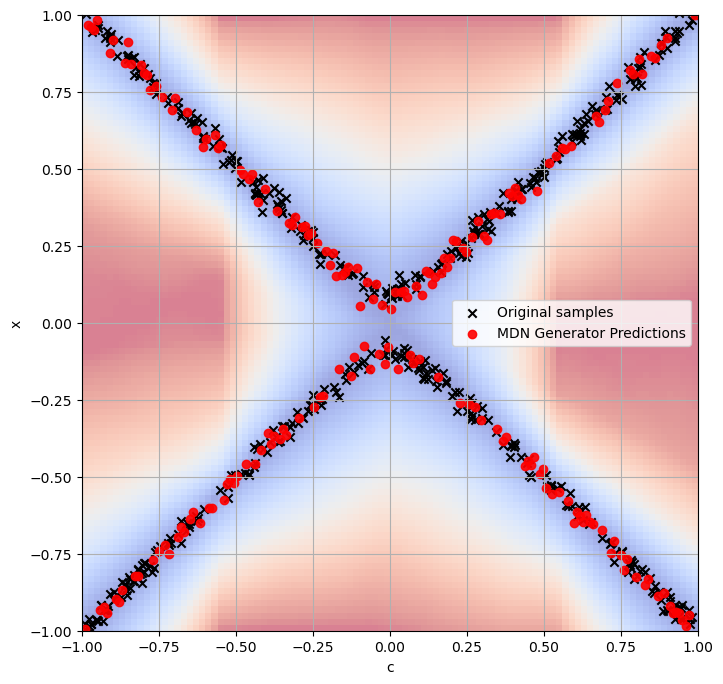


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4827, Generator Loss: 0.1845, Generator Energy Loss: -0.0849, Generator MDN Loss: 0.2694
Epoch [2/100], Energy Loss: 3.2669, Generator Loss: 0.2547, Generator Energy Loss: 0.1161, Generator MDN Loss: 0.1387
Epoch [3/100], Energy Loss: 2.8530, Generator Loss: 0.7879, Generator Energy Loss: 0.7235, Generator MDN Loss: 0.0644
Epoch [4/100], Energy Loss: 2.5429, Generator Loss: 1.3787, Generator Energy Loss: 1.3431, Generator MDN Loss: 0.0356
Epoch [5/100], Energy Loss: 2.3318, Generator Loss: 2.1622, Generator Energy Loss: 2.1428, Generator MDN Loss: 0.0194
Epoch [6/100], Energy Loss: 2.2207, Generator Loss: 2.9519, Generator Energy Loss: 2.9344, Generator MDN Loss: 0.0175
Epoch [7/100], Energy Loss: 2.1240, Generator Loss: 3.2601, Generator Energy Loss: 3.3496, Generator MDN Loss: -0.0895
Epoch [8/100], Energy Loss: 2.0679, Generator Loss: 3.5636, Generator Energy Loss: 3.6966, Generator MDN Loss: -0.1329
Epoch [9/100], Energy Loss: 1

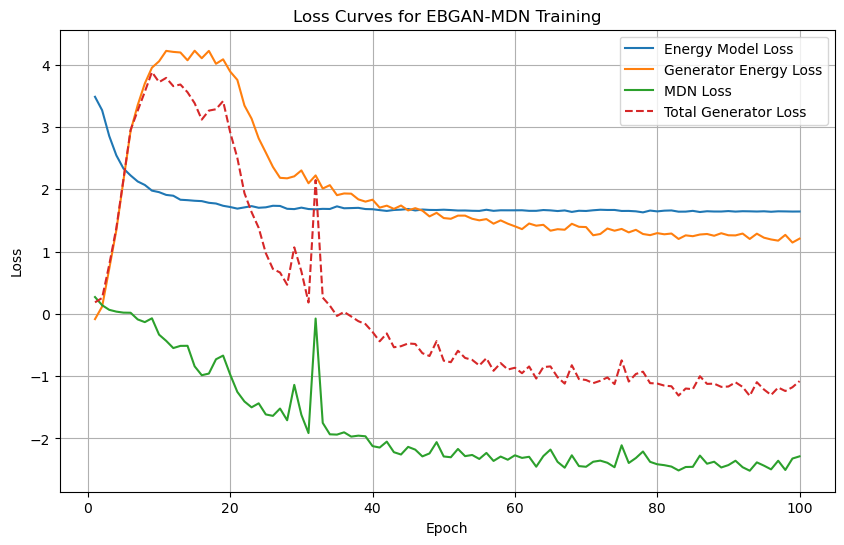

Run 4 - KL Divergence: 2.4027, Wasserstein Distance: 0.0095, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


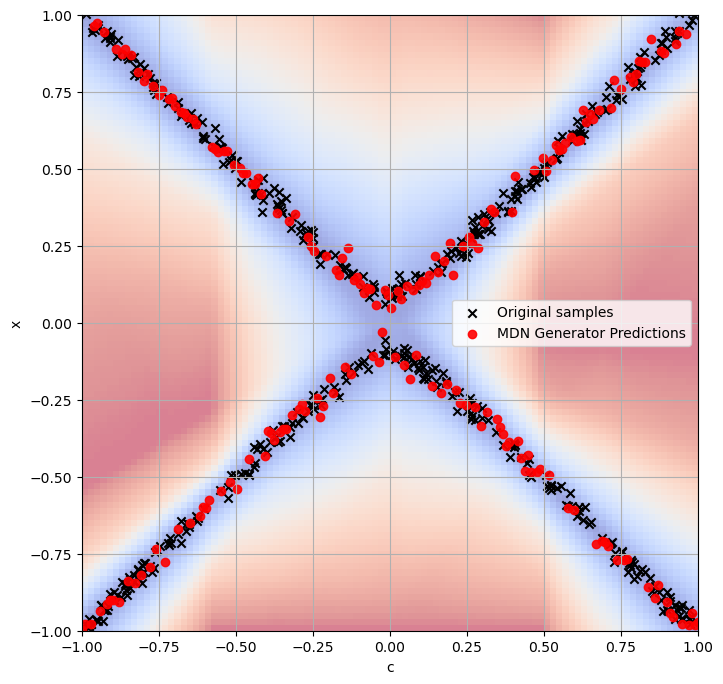


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4888, Generator Loss: 0.3352, Generator Energy Loss: 0.1454, Generator MDN Loss: 0.1898
Epoch [2/100], Energy Loss: 3.2832, Generator Loss: 0.1304, Generator Energy Loss: 0.0560, Generator MDN Loss: 0.0744
Epoch [3/100], Energy Loss: 2.9485, Generator Loss: 0.1862, Generator Energy Loss: 0.1503, Generator MDN Loss: 0.0359
Epoch [4/100], Energy Loss: 2.6400, Generator Loss: 0.4934, Generator Energy Loss: 0.4626, Generator MDN Loss: 0.0308
Epoch [5/100], Energy Loss: 2.4405, Generator Loss: 0.6007, Generator Energy Loss: 0.5782, Generator MDN Loss: 0.0225
Epoch [6/100], Energy Loss: 2.3274, Generator Loss: 0.8020, Generator Energy Loss: 0.8264, Generator MDN Loss: -0.0244
Epoch [7/100], Energy Loss: 2.2623, Generator Loss: 1.5396, Generator Energy Loss: 1.5859, Generator MDN Loss: -0.0463
Epoch [8/100], Energy Loss: 2.1363, Generator Loss: 1.4135, Generator Energy Loss: 1.5007, Generator MDN Loss: -0.0872
Epoch [9/100], Energy Loss: 2

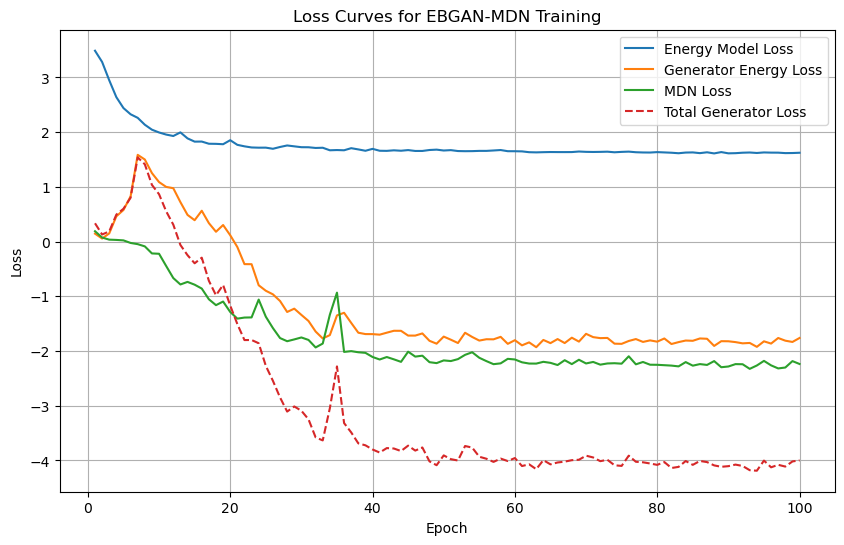

Run 5 - KL Divergence: 1.4144, Wasserstein Distance: 0.0067, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


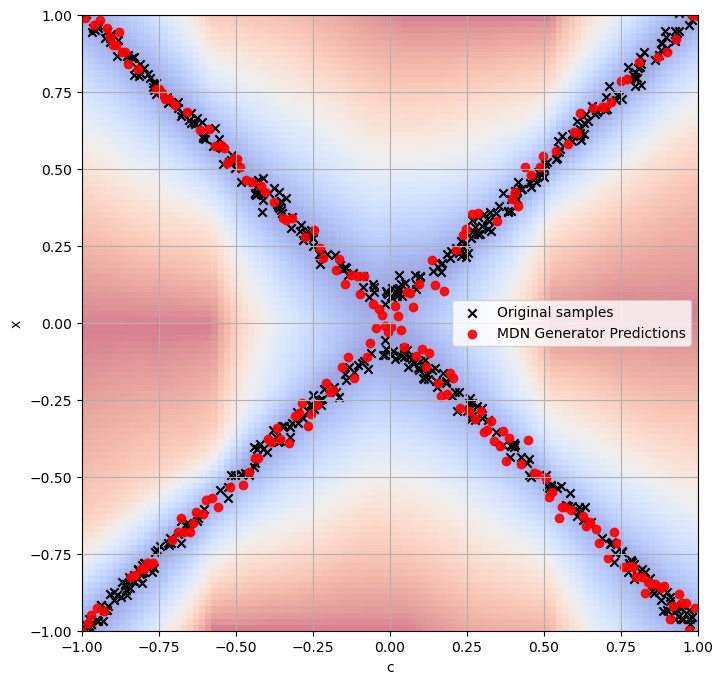

KL Divergence: 2.1158 ± 0.5333
Wasserstein Distance: 0.0079 ± 0.0012
Mode Coverage (%): 99.6000 ± 0.8000
Avgerage Modes coveraged: 1.9960 ± 0.0080


In [13]:
metrics_results = train_and_evaluate(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi = y_multi
)

### Visualization of results and Training progress

Adapting the training loop for visualization

In [13]:
def evaluate_model_clean(energy_model, generator, epoch, latent_size, device, show_energy_map=True, output_path=None):
    """
    Visualize the generator predictions and optionally the energy map.
    
    Args:
        energy_model (torch.nn.Module): The trained energy model.
        generator (torch.nn.Module): The trained generator model.
        epoch (int): Current epoch for visualization.
        latent_size (int): Latent size for the generator.
        device (str): Device to perform computations on.
        show_energy_map (bool): Whether to display the energy map as a background.
        output_path (str): Path to save the figure. If None, displays the figure instead.
    """
    # Generate grid points for the energy map
    if show_energy_map:
        x_range = np.linspace(-1, 1, 100)
        y_range = np.linspace(-1, 1, 100)
        grid_x, grid_y = np.meshgrid(x_range, y_range)
        grid_points = torch.tensor(np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32).to(device)

        # Compute energy model output for each grid point
        energy_outputs = energy_model(grid_points[:, :1], grid_points[:, 1:]).detach().cpu().numpy()
        energy_outputs = energy_outputs.reshape(100, 100)

        # Normalize the heatmap values
        energy_outputs = (energy_outputs - energy_outputs.min(axis=0)) / (energy_outputs.max(axis=0) - energy_outputs.min(axis=0))
    
    # Generate predictions using the generator
    num_query_points = 200
    query_points = np.linspace(-1, 1, num_query_points)
    query_points_tensor = torch.tensor(query_points, dtype=torch.float32).unsqueeze(1).to(device)
    z = torch.randn(num_query_points, latent_size).to(device)

    predictions_mdn = generator.sample(z, query_points_tensor).detach().cpu().numpy()

    # Plot the figure
    fig, ax = plt.subplots(figsize=(6, 6))

    if show_energy_map:
        # Plot the energy heatmap
        ax.imshow(
            energy_outputs, extent=(-1, 1, -1, 1), origin='lower', cmap='coolwarm', alpha=0.5
        )

    # Plot generator predictions
    ax.scatter(query_points, predictions_mdn, marker='o', color='red', alpha=0.9)

    # Remove axes, borders, and grid for a clean figure
    ax.set_axis_off()

    # Save or display the figure
    if output_path:
        plt.savefig(output_path, dpi=300, bbox_inches='tight', pad_inches=0)
    else:
        plt.show()

    plt.close(fig)


In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import argparse
import os
import shutil
import sys
# sys.path.append(os.path.dirname(os.path.dirname(os.path.abspath(__file__))))

from data_pipeline import RobotDataset
from methods.ebgan_mdn import info_nce_loss, dynamic_scaling

# Training loop combining energy model with MDN generator
def train_ebgan_mdn_with_visualization(dataloader, energy_model, generator, optimizer_e, optimizer_g, 
                    scheduler_e, scheduler_g, num_epochs, writer, 
                    y_min, y_max, neg_count, repeat_energy_updates, device, 
                    alpha = 1, dynamic_scaling_true = False,
                    min_scale = 0.1, epoch_num_eval = 25):
    energy_model.train()
    generator.train()
    # Initialize lists to track losses
    energy_losses = []
    generator_e_losses = []
    mdn_losses = []
    total_g_losses = []

    for epoch in range(num_epochs):
        epoch_e_loss = 0.0
        epoch_g_loss_e = 0.0
        epoch_g_loss_mdn = 0.0
        epoch_g_loss = 0.0
        
        if dynamic_scaling_true:
            alpha = dynamic_scaling(epoch, num_epochs, min_scale)
        
        for batch_x, batch_y in dataloader:
            x_input = batch_x.to(device)
            y_target = batch_y.to(device)

            for _ in range(repeat_energy_updates):
                # Draw noise samples
                z = torch.randn(x_input.size(0), generator.latent_size).to(device)
            
                # Generate fake samples
                fake_y_target = generator.sample(z, x_input)
                
                counter_samples = generate_counter_samples(y_min, y_max, x_input.size(0), neg_count, device)
                
                # Compute loss
                e_loss = info_nce_loss(energy_model, x_input, y_target, counter_samples, fake_y_target, alpha)
                
                # Backpropagation
                optimizer_e.zero_grad()
                e_loss.backward()
                optimizer_e.step()
                
                epoch_e_loss += e_loss.item()

            # Compute energy 
            z = torch.randn(x_input.size(0), generator.latent_size).to(device)
            fake_y_target = generator.sample(z, x_input)
            g_loss_e = energy_model(x_input, fake_y_target).mean()

            # Compute MDN loss
            log_pi, mu, sigma = generator(z, x_input)
            mdn_g_loss = mdn_loss(log_pi, mu, sigma, y_target)

            epoch_g_loss_e += g_loss_e.item()
            epoch_g_loss_mdn += mdn_g_loss.item()
            
            # Combined loss
            g_loss = g_loss_e + mdn_g_loss
            
            epoch_g_loss += g_loss.item()

            # Backpropagation
            optimizer_g.zero_grad()
            g_loss.backward()
            optimizer_g.step()

            # Log losses
            # writer.add_scalar('Loss/EnergyModel', e_loss.item(), epoch * len(dataloader) + i)
            # writer.add_scalar('Loss/GeneratorE', g_loss_e.item(), epoch * len(dataloader) + i)
            # writer.add_scalar('Loss/MDN', mdn_g_loss.item(), epoch * len(dataloader) + i)
            # writer.add_scalar('Loss/Generator', g_loss.item(), epoch * len(dataloader) + i)

        scheduler_e.step()
        scheduler_g.step()
        avg_e_loss = epoch_e_loss / len(dataloader) / repeat_energy_updates
        avg_g_loss_e = epoch_g_loss_e / len(dataloader)
        avg_g_loss_mdn = epoch_g_loss_mdn / len(dataloader)
        avg_g_loss = epoch_g_loss / len(dataloader)
        
        # Store losses for plotting
        energy_losses.append(avg_e_loss)
        generator_e_losses.append(avg_g_loss_e)
        mdn_losses.append(avg_g_loss_mdn)
        total_g_losses.append(avg_g_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], "
                f"Energy Loss: {avg_e_loss:.4f}, "
                f"Generator Loss: {avg_g_loss:.4f}, "
                f"Generator Energy Loss: {avg_g_loss_e:.4f}, "
                f"Generator MDN Loss: {avg_g_loss_mdn:.4f}"
                )
        
        # Evaluate model every 20 epochs
        if (epoch + 1) % epoch_num_eval == 0:
            evaluate_model(energy_model, generator, epoch + 1, generator.latent_size, device)
            evaluate_model_clean(
                energy_model=energy_model,
                generator=generator,
                epoch=epoch + 1,
                latent_size=generator.latent_size,
                device=device,
                show_energy_map=True,
                output_path=None
            )
        
    # Plot the loss curves
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), energy_losses, label='Energy Model Loss')
    plt.plot(range(1, num_epochs + 1), generator_e_losses, label='Generator Energy Loss')
    plt.plot(range(1, num_epochs + 1), mdn_losses, label='MDN Loss')
    plt.plot(range(1, num_epochs + 1), total_g_losses, label='Total Generator Loss', linestyle='--')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curves for EBGAN-MDN Training')
    plt.legend()
    plt.grid(True)
    plt.show()

In [15]:
ebgan_mdn_generator = MDNGenerator(latent_size, hidden_size, output_size, num_gaussians, condition_size).to(device)
ebgan_energy_model = EnergyModel(condition_size, output_size, hidden_size).to(device)

# Optimizer
optimizer_ebgan_e = optim.Adam(ebgan_energy_model.parameters(), lr=learning_rate_e)
optimizer_ebgan_g = optim.Adam(ebgan_mdn_generator.parameters(), lr=learning_rate_g)
scheduler_e = optim.lr_scheduler.StepLR(optimizer_ebgan_e, step_size=20, gamma=0.5)
scheduler_g = optim.lr_scheduler.StepLR(optimizer_ebgan_g, step_size=20, gamma=0.5)


In [16]:
epoch_num_eval = 100

Epoch [1/100], Energy Loss: 3.4729, Generator Loss: 0.1457, Generator Energy Loss: -0.0364, Generator MDN Loss: 0.1821
Epoch [2/100], Energy Loss: 3.2604, Generator Loss: 0.2739, Generator Energy Loss: 0.1766, Generator MDN Loss: 0.0973
Epoch [3/100], Energy Loss: 2.9213, Generator Loss: 0.5509, Generator Energy Loss: 0.5045, Generator MDN Loss: 0.0464
Epoch [4/100], Energy Loss: 2.6211, Generator Loss: 1.0014, Generator Energy Loss: 0.9596, Generator MDN Loss: 0.0418
Epoch [5/100], Energy Loss: 2.3735, Generator Loss: 1.7890, Generator Energy Loss: 1.7654, Generator MDN Loss: 0.0236
Epoch [6/100], Energy Loss: 2.2484, Generator Loss: 2.7594, Generator Energy Loss: 2.7394, Generator MDN Loss: 0.0200
Epoch [7/100], Energy Loss: 2.0787, Generator Loss: 3.6569, Generator Energy Loss: 3.6347, Generator MDN Loss: 0.0222
Epoch [8/100], Energy Loss: 2.0874, Generator Loss: 4.2041, Generator Energy Loss: 4.1798, Generator MDN Loss: 0.0242
Epoch [9/100], Energy Loss: 1.9444, Generator Loss: 4.8

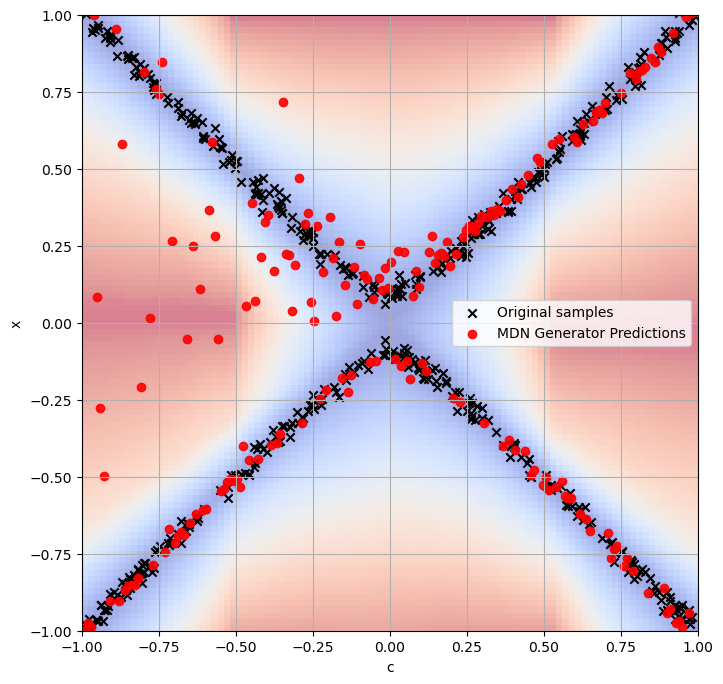

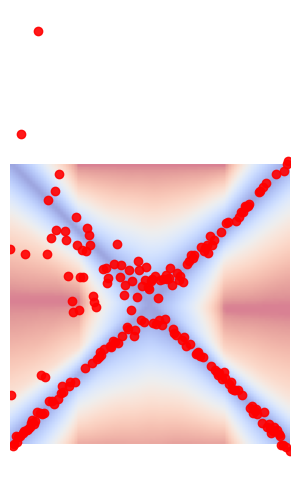

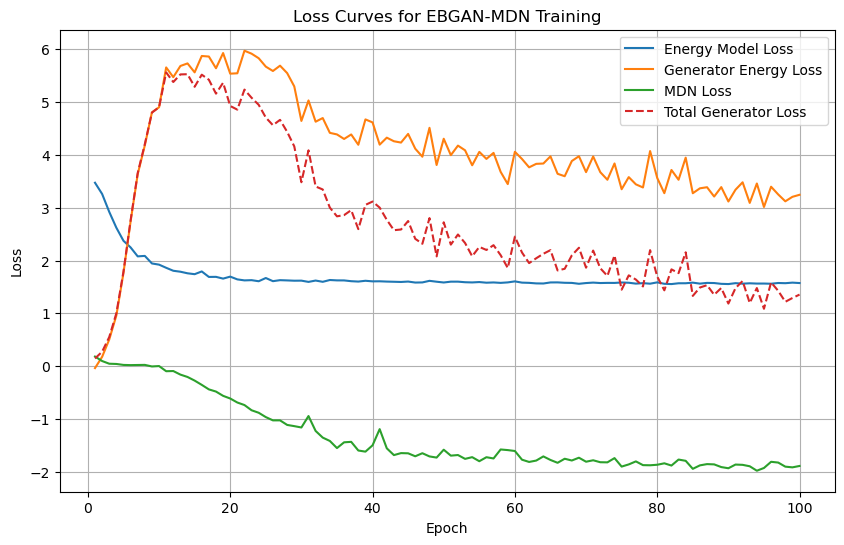

In [18]:
train_ebgan_mdn_with_visualization(dataloader, ebgan_energy_model, ebgan_mdn_generator, optimizer_ebgan_e, optimizer_ebgan_g, 
                    scheduler_e, scheduler_g, num_epochs, None,
                    y_min, y_max, neg_count, repeat_energy_updates, device, 
                    alpha, dynamic_scaling_true,
                    min_scale, epoch_num_eval)

## Noise benchmarking

In [17]:
from methods.ebgan_mdn import train_ebgan_mdn
from methods.mdn import NoiseType

def train_and_evaluate_noise(num_trials, dataloader, test_x_vals, test_y_vals_transposed, 
                             num_epochs, y_min, y_max, 
                             neg_count, repeat_energy_updates, device, alpha, dynamic_scaling_true, min_scale, y_multi,
                             noise_type, noise_level=None):
    results = {"KL Divergence": [], "Wasserstein Distance": [], "Mode Coverage (%)": [], "Avgerage Modes coveraged": []}

    for trial in range(num_trials):
        print(f"\n=== Training Run {trial + 1} ===")
        
        ebgan_mdn_generator = MDNGenerator(latent_size, hidden_size, output_size, num_gaussians, condition_size, noise_type, noise_level).to(device)
        ebgan_energy_model = EnergyModel(condition_size, output_size, hidden_size).to(device)

        # Optimizer
        optimizer_ebgan_e = optim.Adam(ebgan_energy_model.parameters(), lr=learning_rate_e)
        optimizer_ebgan_g = optim.Adam(ebgan_mdn_generator.parameters(), lr=learning_rate_g)
        scheduler_e = optim.lr_scheduler.StepLR(optimizer_ebgan_e, step_size=20, gamma=0.5)
        scheduler_g = optim.lr_scheduler.StepLR(optimizer_ebgan_g, step_size=20, gamma=0.5)
        
        # Train the model
        train_ebgan_mdn(dataloader, ebgan_energy_model, ebgan_mdn_generator, optimizer_ebgan_e, optimizer_ebgan_g, 
                        scheduler_e, scheduler_g, num_epochs, None, y_min, y_max, neg_count, 
                        repeat_energy_updates, device, alpha, dynamic_scaling_true, min_scale)

        # Flatten the true test y values for metric computation
        true_y_flat = np.array(test_y_vals_transposed).reshape(-1, len(test_x_vals)).T

        # Compute metrics  
        metrics = compute_metrics(ebgan_mdn_generator, test_x_vals, true_y_flat , y_multi, K = 10, num_bins=50, tolerance=TOLERANCE)
        for key in results.keys():
            results[key].append(metrics[key])

        print(f"Run {trial + 1} - KL Divergence: {metrics["KL Divergence"]:.4f}, Wasserstein Distance: {metrics["Wasserstein Distance"]:.4f}, Mode Coverage (%): {metrics["Mode Coverage (%)"]}, Avgerage Modes coveraged: {metrics["Avgerage Modes coveraged"]}")
        
        evaluate_model(ebgan_energy_model, ebgan_mdn_generator, num_epochs, ebgan_mdn_generator.latent_size, device, trial)
    # Compute averages and standard deviations
    for metric, values in results.items():
        avg = np.mean(values)
        std = np.std(values)
        print(f"{metric}: {avg:.4f} ± {std:.4f}")

    return results


In [18]:
# Hyperparameters
num_gaussians = 2

latent_size = 1
hidden_size = 64

num_epochs = 100
batch_size = 32

neg_count = 32
repeat_energy_updates = 5

learning_rate_e = 0.001
learning_rate_g = 0.0005

epoch_num_eval = 100

# Configuration parameter 
alpha = 1
dynamic_scaling_true = False
min_scale = 0.1


=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4847, Generator Loss: 0.0647, Generator Energy Loss: -0.0620, Generator MDN Loss: 0.1267
Epoch [2/100], Energy Loss: 3.2837, Generator Loss: -0.0660, Generator Energy Loss: -0.1088, Generator MDN Loss: 0.0428
Epoch [3/100], Energy Loss: 2.9526, Generator Loss: -0.1489, Generator Energy Loss: -0.1643, Generator MDN Loss: 0.0154
Epoch [4/100], Energy Loss: 2.6902, Generator Loss: -0.0429, Generator Energy Loss: -0.0608, Generator MDN Loss: 0.0179
Epoch [5/100], Energy Loss: 2.4572, Generator Loss: 0.3642, Generator Energy Loss: 0.3709, Generator MDN Loss: -0.0067
Epoch [6/100], Energy Loss: 2.3163, Generator Loss: 0.9299, Generator Energy Loss: 0.9432, Generator MDN Loss: -0.0133
Epoch [7/100], Energy Loss: 2.1979, Generator Loss: 1.2202, Generator Energy Loss: 1.2501, Generator MDN Loss: -0.0299
Epoch [8/100], Energy Loss: 2.0918, Generator Loss: 1.8412, Generator Energy Loss: 1.8729, Generator MDN Loss: -0.0317
Epoch [9/100], Energy

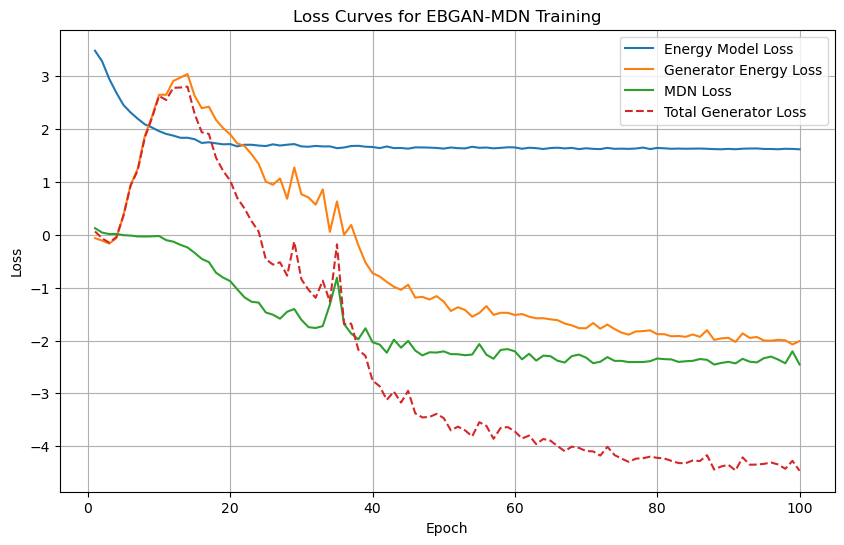

Run 1 - KL Divergence: 1.1706, Wasserstein Distance: 0.0083, Mode Coverage (%): 98.0, Avgerage Modes coveraged: 1.98


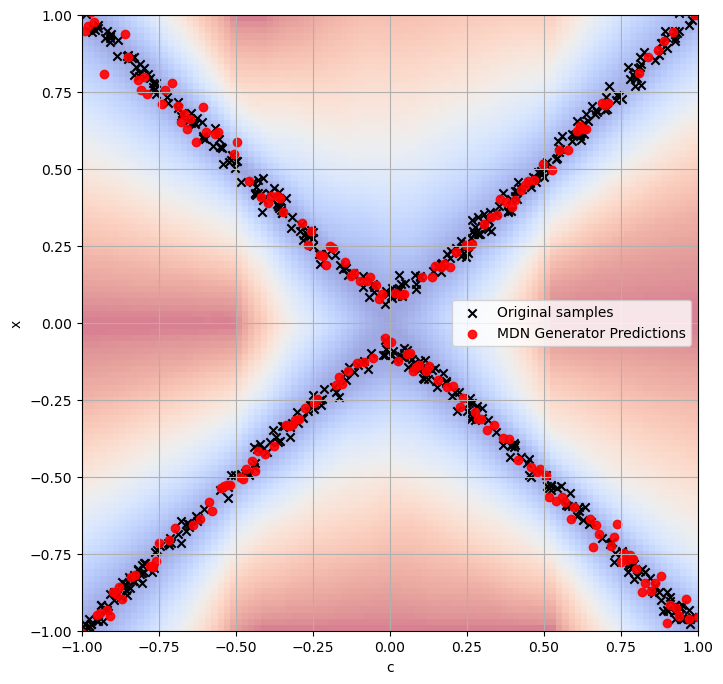


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4946, Generator Loss: 0.0330, Generator Energy Loss: -0.1292, Generator MDN Loss: 0.1622
Epoch [2/100], Energy Loss: 3.3410, Generator Loss: 0.1604, Generator Energy Loss: 0.0997, Generator MDN Loss: 0.0607
Epoch [3/100], Energy Loss: 3.0686, Generator Loss: 0.5182, Generator Energy Loss: 0.4956, Generator MDN Loss: 0.0226
Epoch [4/100], Energy Loss: 2.7441, Generator Loss: 1.2647, Generator Energy Loss: 1.2582, Generator MDN Loss: 0.0065
Epoch [5/100], Energy Loss: 2.5556, Generator Loss: 2.2244, Generator Energy Loss: 2.2129, Generator MDN Loss: 0.0115
Epoch [6/100], Energy Loss: 2.3322, Generator Loss: 3.2149, Generator Energy Loss: 3.2133, Generator MDN Loss: 0.0016
Epoch [7/100], Energy Loss: 2.2232, Generator Loss: 3.9487, Generator Energy Loss: 3.9954, Generator MDN Loss: -0.0467
Epoch [8/100], Energy Loss: 2.1532, Generator Loss: 4.8785, Generator Energy Loss: 4.9202, Generator MDN Loss: -0.0417
Epoch [9/100], Energy Loss: 2

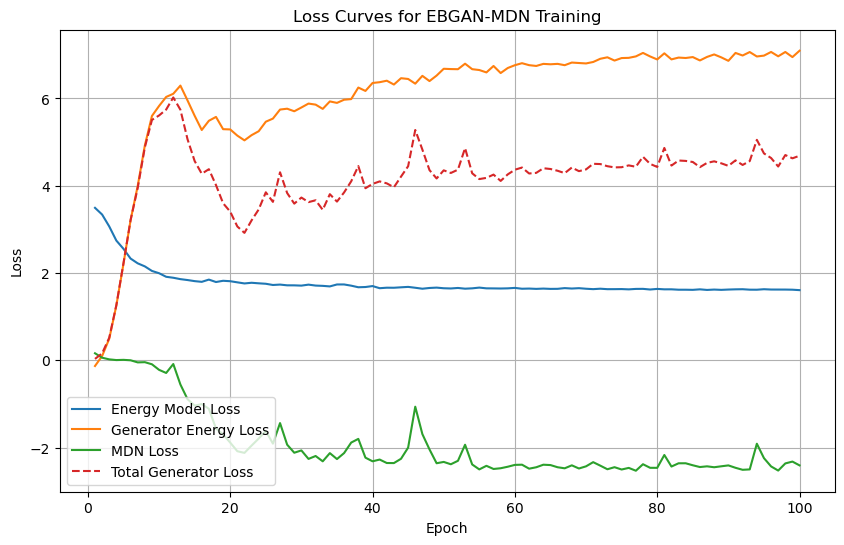

Run 2 - KL Divergence: 1.9606, Wasserstein Distance: 0.0060, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


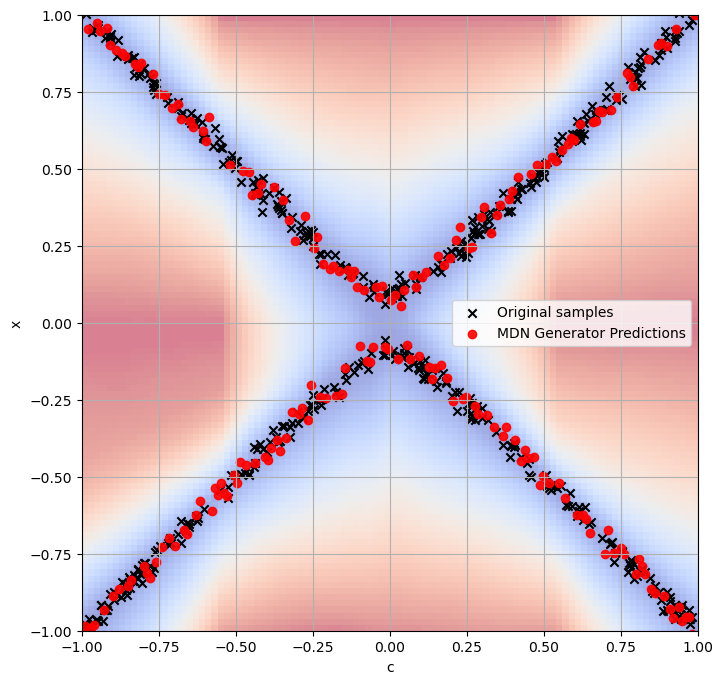


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4832, Generator Loss: -0.0226, Generator Energy Loss: -0.1614, Generator MDN Loss: 0.1388
Epoch [2/100], Energy Loss: 3.2880, Generator Loss: -0.2340, Generator Energy Loss: -0.3022, Generator MDN Loss: 0.0682
Epoch [3/100], Energy Loss: 2.9950, Generator Loss: -0.4814, Generator Energy Loss: -0.5185, Generator MDN Loss: 0.0372
Epoch [4/100], Energy Loss: 2.6978, Generator Loss: -0.7489, Generator Energy Loss: -0.7862, Generator MDN Loss: 0.0373
Epoch [5/100], Energy Loss: 2.4880, Generator Loss: -0.6437, Generator Energy Loss: -0.6512, Generator MDN Loss: 0.0075
Epoch [6/100], Energy Loss: 2.3778, Generator Loss: -0.2562, Generator Energy Loss: -0.2354, Generator MDN Loss: -0.0208
Epoch [7/100], Energy Loss: 2.2713, Generator Loss: -0.3668, Generator Energy Loss: -0.2924, Generator MDN Loss: -0.0745
Epoch [8/100], Energy Loss: 2.1790, Generator Loss: -0.7556, Generator Energy Loss: -0.4180, Generator MDN Loss: -0.3376
Epoch [9/100]

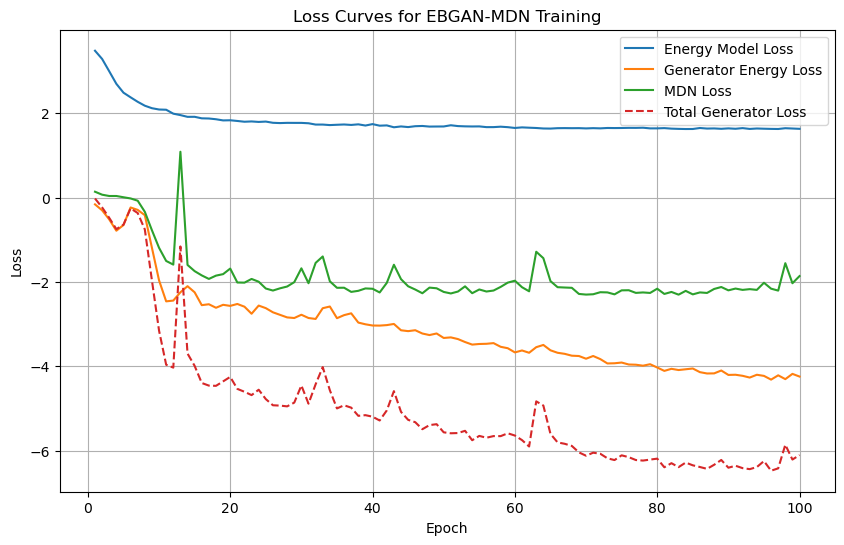

Run 3 - KL Divergence: 1.4091, Wasserstein Distance: 0.0071, Mode Coverage (%): 98.0, Avgerage Modes coveraged: 1.98


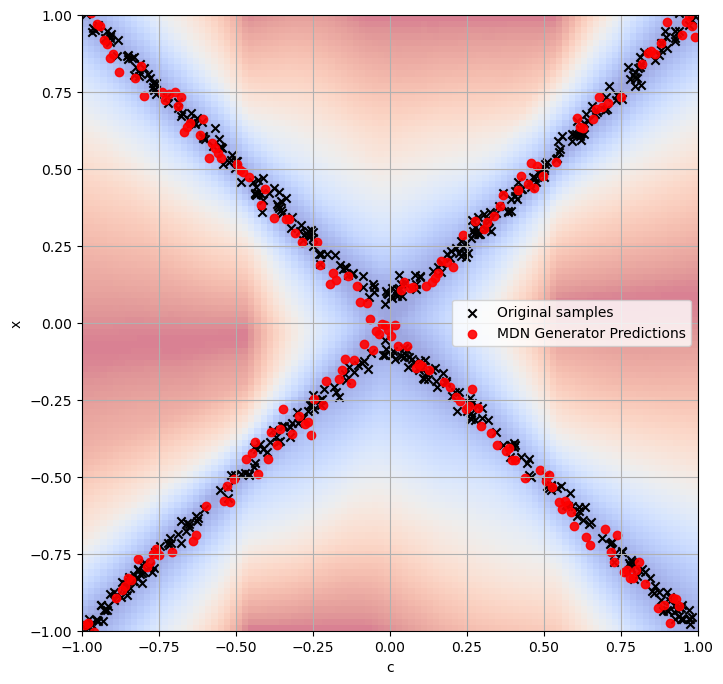


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4823, Generator Loss: 0.0494, Generator Energy Loss: -0.0124, Generator MDN Loss: 0.0618
Epoch [2/100], Energy Loss: 3.3272, Generator Loss: 0.1331, Generator Energy Loss: 0.1045, Generator MDN Loss: 0.0286
Epoch [3/100], Energy Loss: 3.0082, Generator Loss: 0.3513, Generator Energy Loss: 0.3464, Generator MDN Loss: 0.0049
Epoch [4/100], Energy Loss: 2.6921, Generator Loss: 1.0667, Generator Energy Loss: 1.0669, Generator MDN Loss: -0.0001
Epoch [5/100], Energy Loss: 2.4679, Generator Loss: 1.9717, Generator Energy Loss: 1.9562, Generator MDN Loss: 0.0155
Epoch [6/100], Energy Loss: 2.2869, Generator Loss: 2.8491, Generator Energy Loss: 2.8582, Generator MDN Loss: -0.0092
Epoch [7/100], Energy Loss: 2.1578, Generator Loss: 3.4796, Generator Energy Loss: 3.5037, Generator MDN Loss: -0.0240
Epoch [8/100], Energy Loss: 2.0872, Generator Loss: 4.1894, Generator Energy Loss: 4.2181, Generator MDN Loss: -0.0287
Epoch [9/100], Energy Loss:

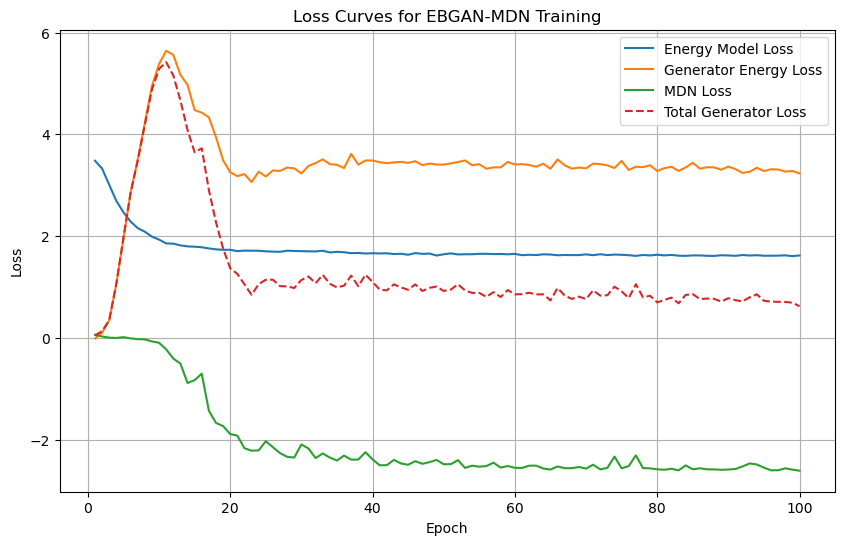

Run 4 - KL Divergence: 1.8038, Wasserstein Distance: 0.0075, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


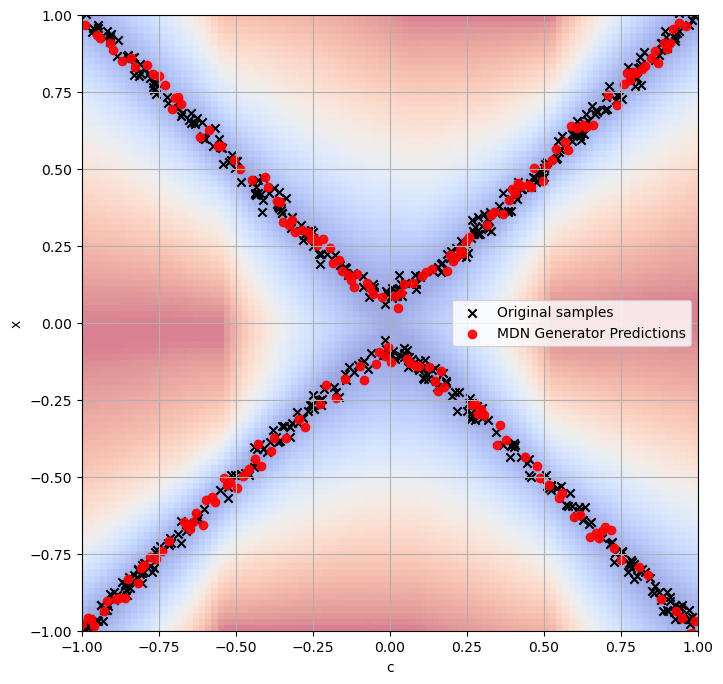


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4937, Generator Loss: 0.2844, Generator Energy Loss: 0.1312, Generator MDN Loss: 0.1532
Epoch [2/100], Energy Loss: 3.3438, Generator Loss: 0.3565, Generator Energy Loss: 0.3104, Generator MDN Loss: 0.0460
Epoch [3/100], Energy Loss: 3.0524, Generator Loss: 0.6837, Generator Energy Loss: 0.6714, Generator MDN Loss: 0.0123
Epoch [4/100], Energy Loss: 2.7663, Generator Loss: 1.1401, Generator Energy Loss: 1.1431, Generator MDN Loss: -0.0030
Epoch [5/100], Energy Loss: 2.5882, Generator Loss: 1.8246, Generator Energy Loss: 1.8452, Generator MDN Loss: -0.0206
Epoch [6/100], Energy Loss: 2.4377, Generator Loss: 2.2938, Generator Energy Loss: 2.3232, Generator MDN Loss: -0.0294
Epoch [7/100], Energy Loss: 2.3433, Generator Loss: 2.9116, Generator Energy Loss: 2.9583, Generator MDN Loss: -0.0467
Epoch [8/100], Energy Loss: 2.2518, Generator Loss: 3.5253, Generator Energy Loss: 3.5838, Generator MDN Loss: -0.0585
Epoch [9/100], Energy Loss:

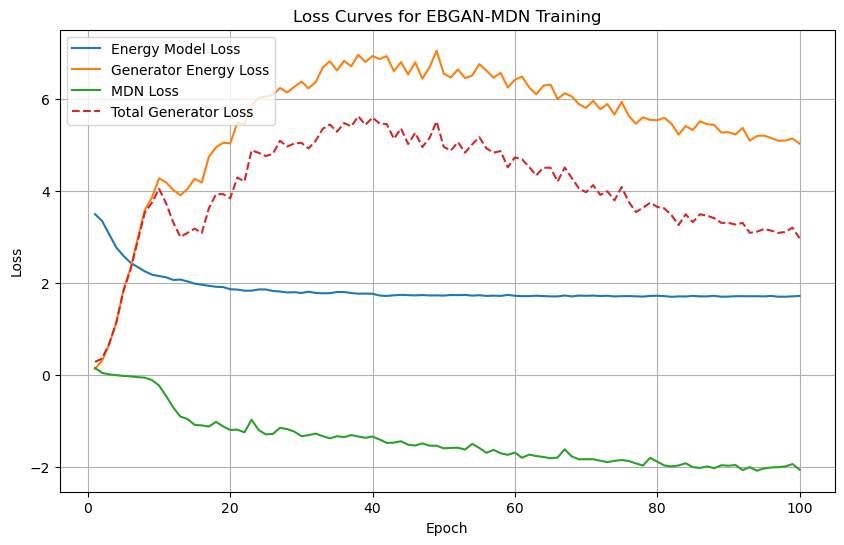

Run 5 - KL Divergence: 2.2262, Wasserstein Distance: 0.0076, Mode Coverage (%): 96.0, Avgerage Modes coveraged: 1.96


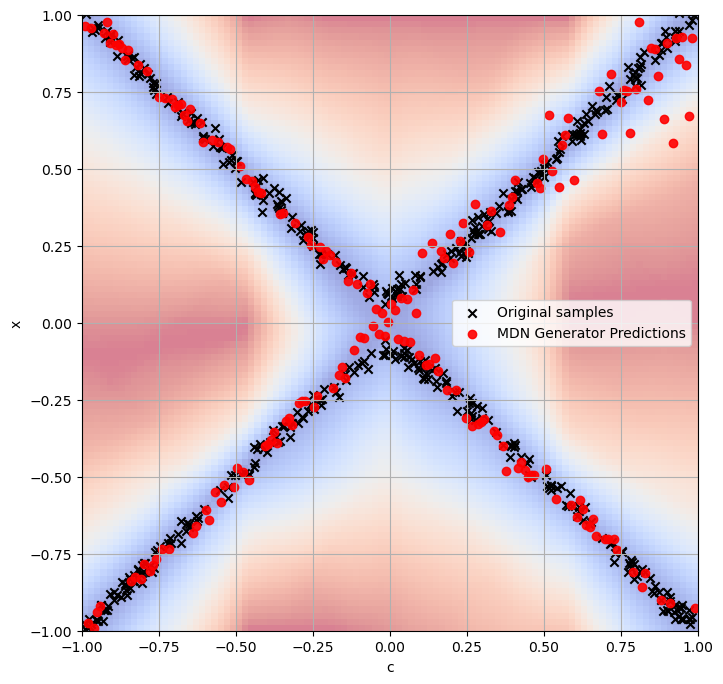

KL Divergence: 1.7141 ± 0.3794
Wasserstein Distance: 0.0073 ± 0.0008
Mode Coverage (%): 98.2000 ± 1.3266
Avgerage Modes coveraged: 1.9820 ± 0.0133


In [21]:
metrics_results_diagonal = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi = y_multi,
    noise_type=NoiseType.DIAGONAL,
)


=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4877, Generator Loss: 0.0504, Generator Energy Loss: -0.1014, Generator MDN Loss: 0.1518
Epoch [2/100], Energy Loss: 3.2920, Generator Loss: -0.2375, Generator Energy Loss: -0.2934, Generator MDN Loss: 0.0559
Epoch [3/100], Energy Loss: 2.9048, Generator Loss: -1.2291, Generator Energy Loss: -1.2642, Generator MDN Loss: 0.0352
Epoch [4/100], Energy Loss: 2.5656, Generator Loss: -1.9635, Generator Energy Loss: -1.9841, Generator MDN Loss: 0.0206
Epoch [5/100], Energy Loss: 2.3351, Generator Loss: -2.3387, Generator Energy Loss: -2.3606, Generator MDN Loss: 0.0219
Epoch [6/100], Energy Loss: 2.2284, Generator Loss: -2.7296, Generator Energy Loss: -2.7082, Generator MDN Loss: -0.0213
Epoch [7/100], Energy Loss: 2.1142, Generator Loss: -2.8015, Generator Energy Loss: -2.7266, Generator MDN Loss: -0.0750
Epoch [8/100], Energy Loss: 2.0405, Generator Loss: -3.4510, Generator Energy Loss: -3.2922, Generator MDN Loss: -0.1588
Epoch [9/100],

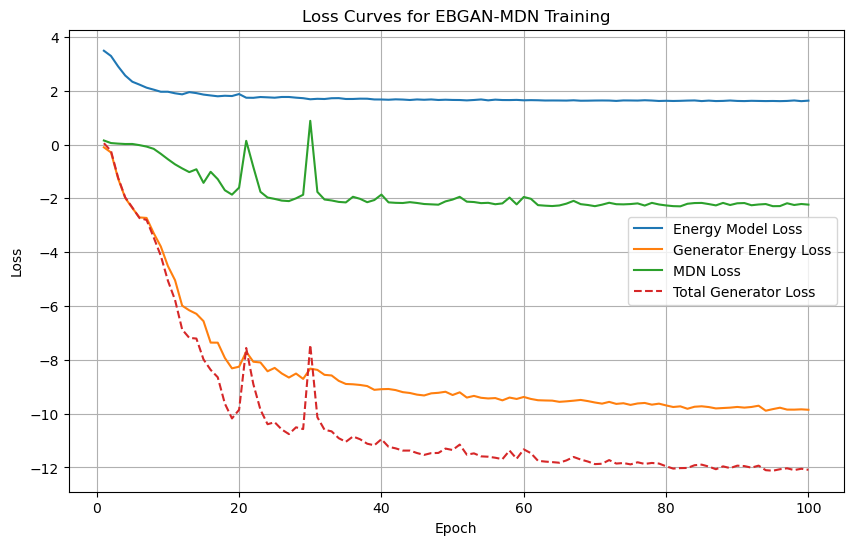

Run 1 - KL Divergence: 3.0410, Wasserstein Distance: 0.0076, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


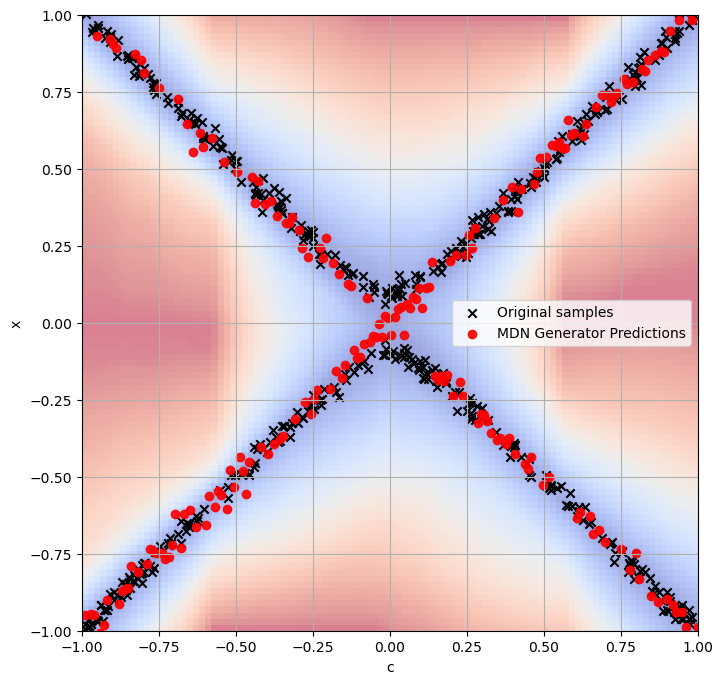


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4777, Generator Loss: 0.3484, Generator Energy Loss: 0.1885, Generator MDN Loss: 0.1599
Epoch [2/100], Energy Loss: 3.2481, Generator Loss: 0.5012, Generator Energy Loss: 0.4303, Generator MDN Loss: 0.0709
Epoch [3/100], Energy Loss: 2.8916, Generator Loss: 0.7407, Generator Energy Loss: 0.7110, Generator MDN Loss: 0.0298
Epoch [4/100], Energy Loss: 2.6471, Generator Loss: 1.2721, Generator Energy Loss: 1.2519, Generator MDN Loss: 0.0203
Epoch [5/100], Energy Loss: 2.4589, Generator Loss: 2.0161, Generator Energy Loss: 1.9855, Generator MDN Loss: 0.0306
Epoch [6/100], Energy Loss: 2.3262, Generator Loss: 2.3124, Generator Energy Loss: 2.3248, Generator MDN Loss: -0.0124
Epoch [7/100], Energy Loss: 2.2176, Generator Loss: 3.0048, Generator Energy Loss: 3.1018, Generator MDN Loss: -0.0970
Epoch [8/100], Energy Loss: 2.1551, Generator Loss: 3.4453, Generator Energy Loss: 3.6048, Generator MDN Loss: -0.1595
Epoch [9/100], Energy Loss: 2

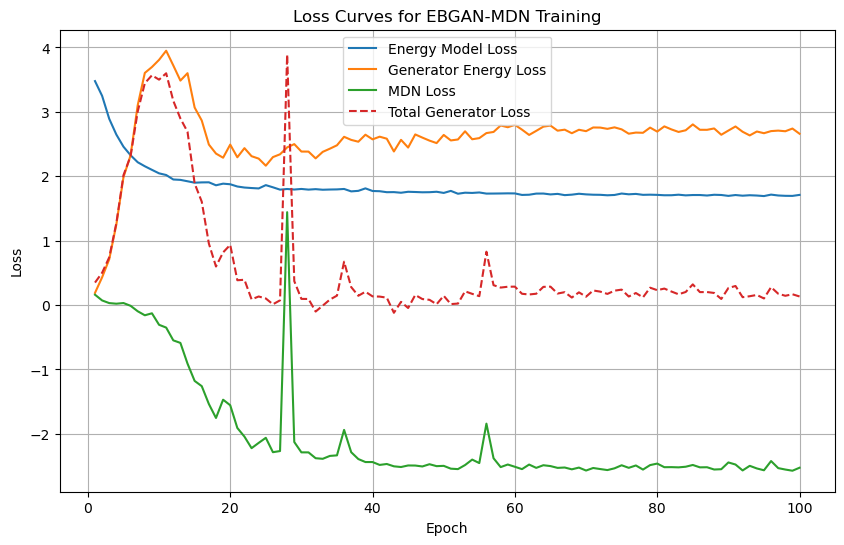

Run 2 - KL Divergence: 1.1261, Wasserstein Distance: 0.0064, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


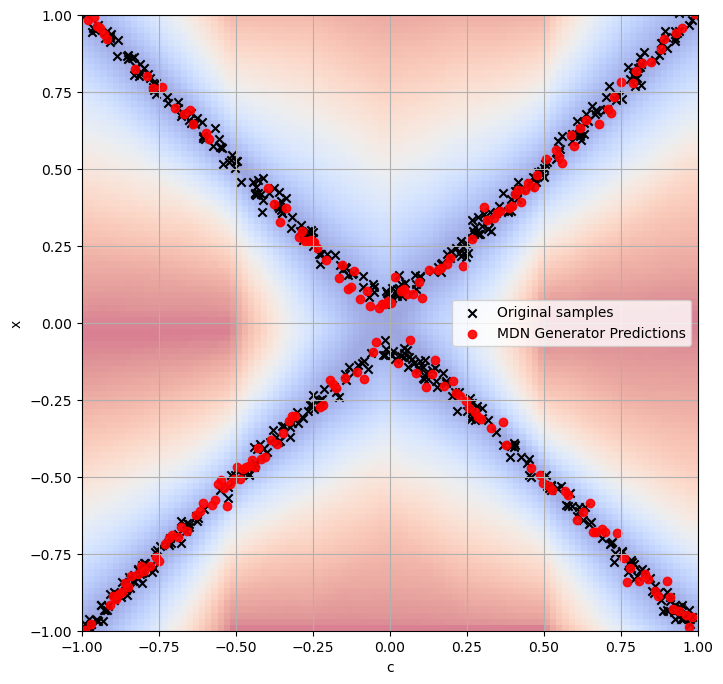


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4908, Generator Loss: -0.3874, Generator Energy Loss: -0.4697, Generator MDN Loss: 0.0823
Epoch [2/100], Energy Loss: 3.2700, Generator Loss: -0.8010, Generator Energy Loss: -0.8285, Generator MDN Loss: 0.0275
Epoch [3/100], Energy Loss: 2.9125, Generator Loss: -1.0383, Generator Energy Loss: -1.0423, Generator MDN Loss: 0.0041
Epoch [4/100], Energy Loss: 2.6412, Generator Loss: -0.8798, Generator Energy Loss: -0.8757, Generator MDN Loss: -0.0040
Epoch [5/100], Energy Loss: 2.4415, Generator Loss: -0.7966, Generator Energy Loss: -0.8000, Generator MDN Loss: 0.0034
Epoch [6/100], Energy Loss: 2.3232, Generator Loss: -0.7350, Generator Energy Loss: -0.7176, Generator MDN Loss: -0.0173
Epoch [7/100], Energy Loss: 2.2204, Generator Loss: -0.5101, Generator Energy Loss: -0.4937, Generator MDN Loss: -0.0164
Epoch [8/100], Energy Loss: 2.1286, Generator Loss: -0.2202, Generator Energy Loss: -0.1966, Generator MDN Loss: -0.0236
Epoch [9/100

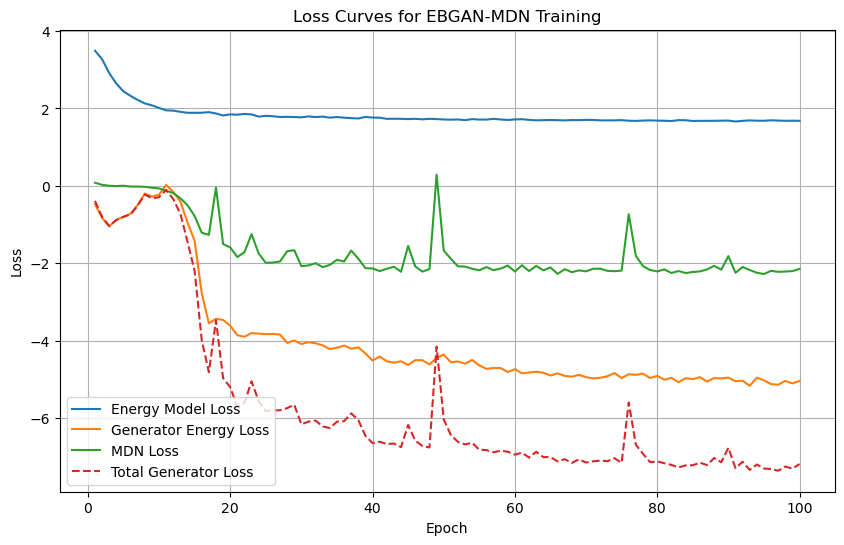

Run 3 - KL Divergence: 3.5705, Wasserstein Distance: 0.0064, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


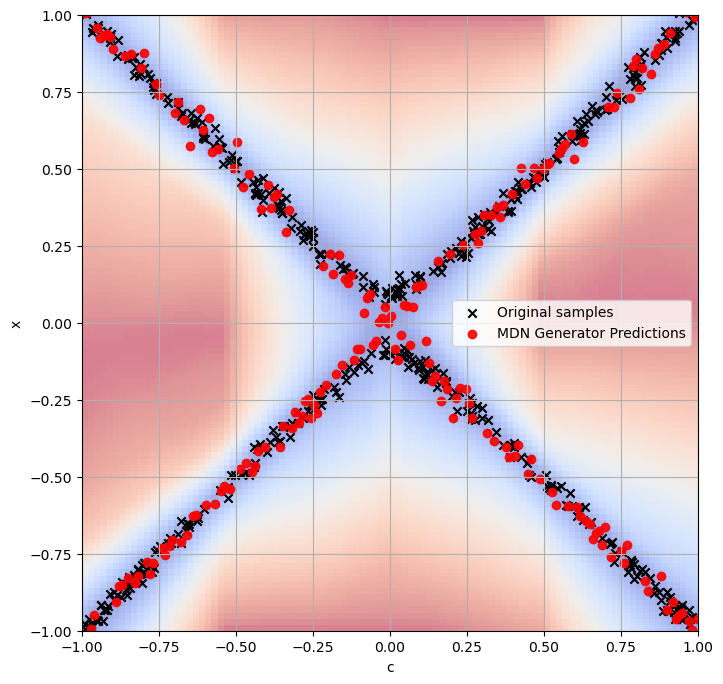


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4760, Generator Loss: 0.1057, Generator Energy Loss: -0.0572, Generator MDN Loss: 0.1628
Epoch [2/100], Energy Loss: 3.2643, Generator Loss: 0.2719, Generator Energy Loss: 0.2096, Generator MDN Loss: 0.0624
Epoch [3/100], Energy Loss: 2.9359, Generator Loss: 0.8159, Generator Energy Loss: 0.7959, Generator MDN Loss: 0.0200
Epoch [4/100], Energy Loss: 2.6823, Generator Loss: 1.5626, Generator Energy Loss: 1.5497, Generator MDN Loss: 0.0128
Epoch [5/100], Energy Loss: 2.4978, Generator Loss: 2.4119, Generator Energy Loss: 2.3939, Generator MDN Loss: 0.0180
Epoch [6/100], Energy Loss: 2.3452, Generator Loss: 2.8647, Generator Energy Loss: 2.8661, Generator MDN Loss: -0.0014
Epoch [7/100], Energy Loss: 2.2491, Generator Loss: 3.4150, Generator Energy Loss: 3.4112, Generator MDN Loss: 0.0037
Epoch [8/100], Energy Loss: 2.2112, Generator Loss: 4.3005, Generator Energy Loss: 4.3174, Generator MDN Loss: -0.0169
Epoch [9/100], Energy Loss: 2

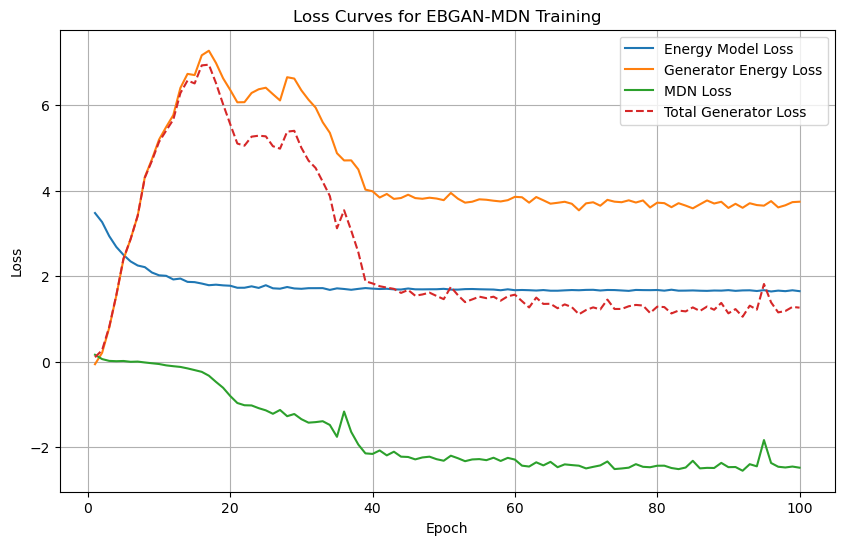

Run 4 - KL Divergence: 2.2786, Wasserstein Distance: 0.0064, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


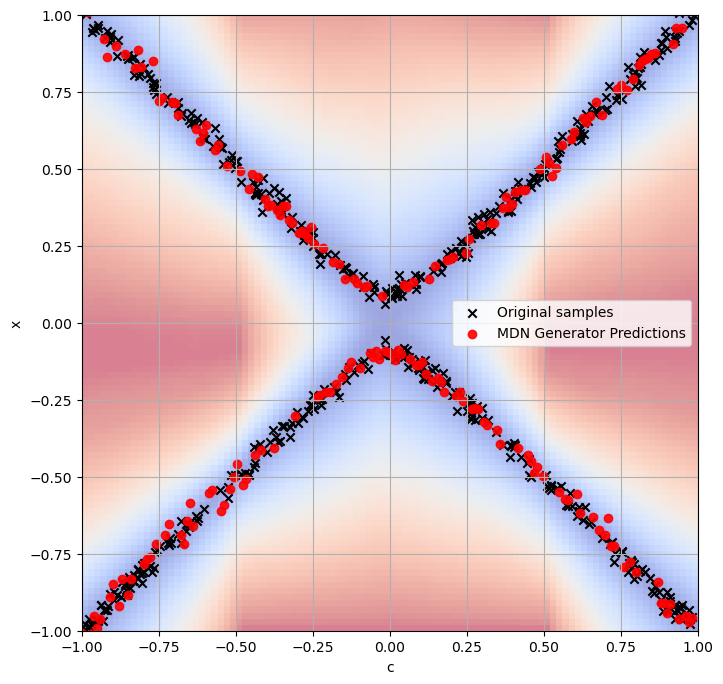


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4728, Generator Loss: 0.0258, Generator Energy Loss: -0.1009, Generator MDN Loss: 0.1267
Epoch [2/100], Energy Loss: 3.2412, Generator Loss: -0.0457, Generator Energy Loss: -0.1011, Generator MDN Loss: 0.0554
Epoch [3/100], Energy Loss: 2.8920, Generator Loss: -0.3525, Generator Energy Loss: -0.3818, Generator MDN Loss: 0.0293
Epoch [4/100], Energy Loss: 2.6061, Generator Loss: -0.2447, Generator Energy Loss: -0.2558, Generator MDN Loss: 0.0111
Epoch [5/100], Energy Loss: 2.4279, Generator Loss: -0.1851, Generator Energy Loss: -0.1960, Generator MDN Loss: 0.0108
Epoch [6/100], Energy Loss: 2.2672, Generator Loss: 0.3079, Generator Energy Loss: 0.2987, Generator MDN Loss: 0.0092
Epoch [7/100], Energy Loss: 2.1409, Generator Loss: 0.5086, Generator Energy Loss: 0.5057, Generator MDN Loss: 0.0029
Epoch [8/100], Energy Loss: 2.0650, Generator Loss: 0.7643, Generator Energy Loss: 0.7413, Generator MDN Loss: 0.0230
Epoch [9/100], Energy L

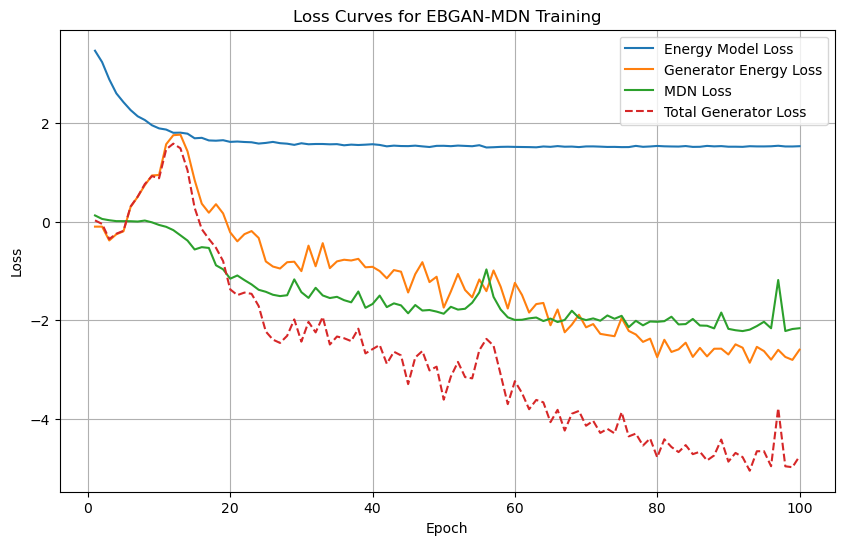

Run 5 - KL Divergence: 1.8001, Wasserstein Distance: 0.0087, Mode Coverage (%): 91.0, Avgerage Modes coveraged: 1.91


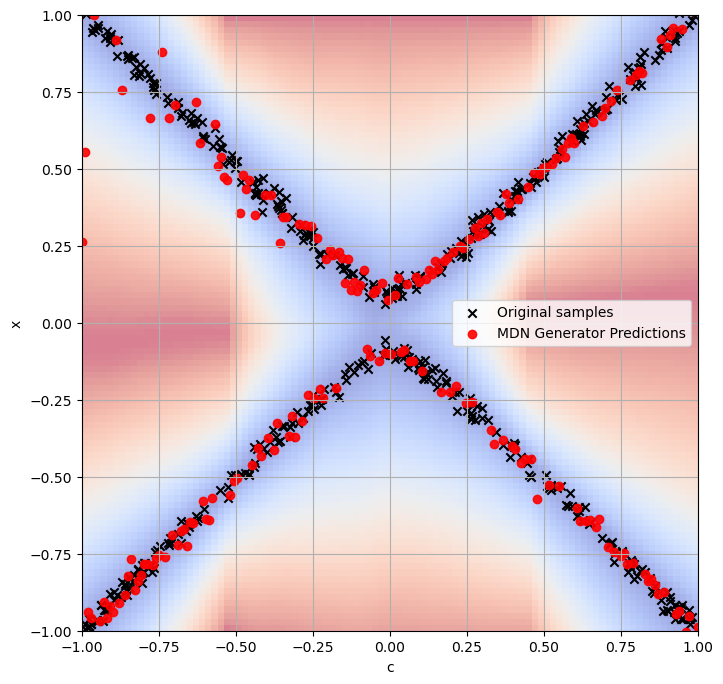

KL Divergence: 2.3632 ± 0.8685
Wasserstein Distance: 0.0071 ± 0.0009
Mode Coverage (%): 97.6000 ± 3.3226
Avgerage Modes coveraged: 1.9760 ± 0.0332


In [22]:
metrics_results_isotropic = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi = y_multi,
    noise_type=NoiseType.ISOTROPIC,
)


=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4670, Generator Loss: 0.1641, Generator Energy Loss: 0.0450, Generator MDN Loss: 0.1192
Epoch [2/100], Energy Loss: 3.2026, Generator Loss: 0.4089, Generator Energy Loss: 0.3741, Generator MDN Loss: 0.0347
Epoch [3/100], Energy Loss: 2.8077, Generator Loss: 0.9647, Generator Energy Loss: 0.9480, Generator MDN Loss: 0.0167
Epoch [4/100], Energy Loss: 2.5422, Generator Loss: 1.9442, Generator Energy Loss: 1.9579, Generator MDN Loss: -0.0137
Epoch [5/100], Energy Loss: 2.3452, Generator Loss: 2.7344, Generator Energy Loss: 2.7436, Generator MDN Loss: -0.0092
Epoch [6/100], Energy Loss: 2.1918, Generator Loss: 3.7771, Generator Energy Loss: 3.7809, Generator MDN Loss: -0.0038
Epoch [7/100], Energy Loss: 2.0823, Generator Loss: 4.4435, Generator Energy Loss: 4.4960, Generator MDN Loss: -0.0524
Epoch [8/100], Energy Loss: 1.9816, Generator Loss: 5.1978, Generator Energy Loss: 5.3029, Generator MDN Loss: -0.1051
Epoch [9/100], Energy Loss:

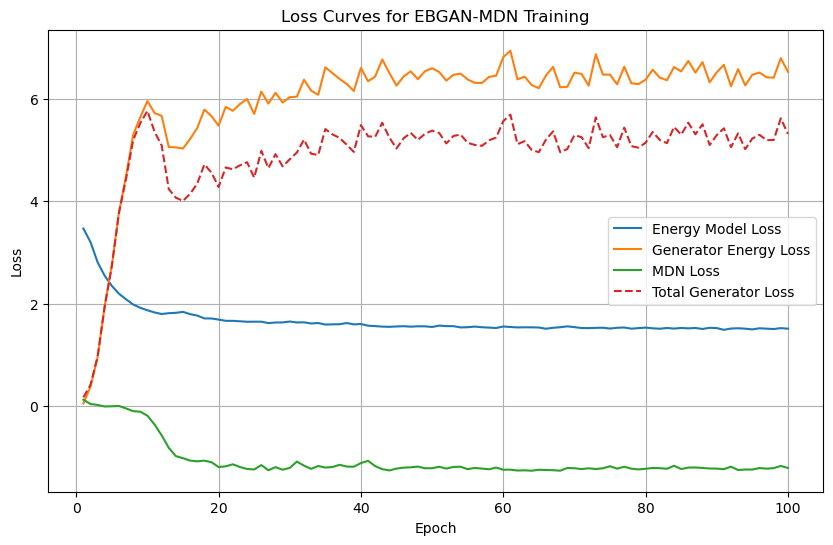

Run 1 - KL Divergence: 2.8315, Wasserstein Distance: 0.0090, Mode Coverage (%): 61.0, Avgerage Modes coveraged: 1.52


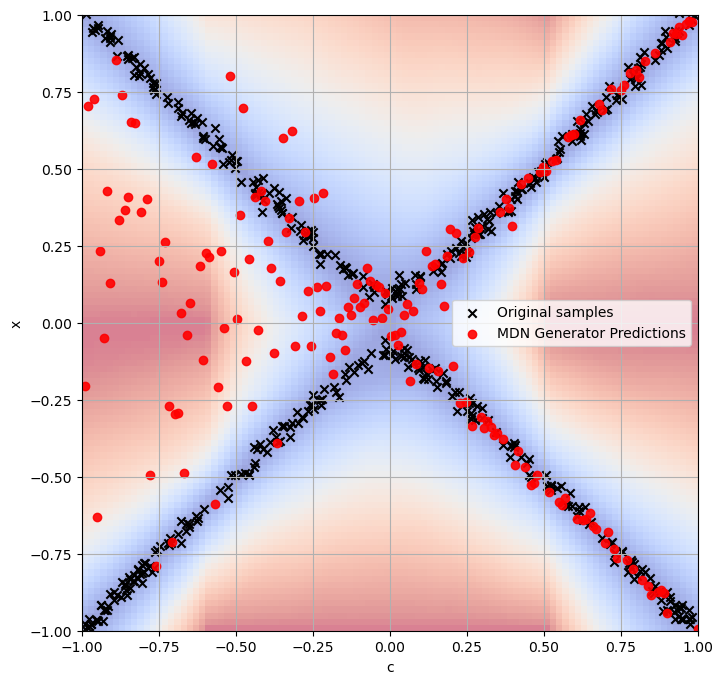


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4900, Generator Loss: 0.0468, Generator Energy Loss: -0.0676, Generator MDN Loss: 0.1145
Epoch [2/100], Energy Loss: 3.3146, Generator Loss: 0.0526, Generator Energy Loss: 0.0237, Generator MDN Loss: 0.0289
Epoch [3/100], Energy Loss: 3.0129, Generator Loss: 0.3095, Generator Energy Loss: 0.3047, Generator MDN Loss: 0.0048
Epoch [4/100], Energy Loss: 2.7267, Generator Loss: 0.5980, Generator Energy Loss: 0.5884, Generator MDN Loss: 0.0097
Epoch [5/100], Energy Loss: 2.4671, Generator Loss: 1.0236, Generator Energy Loss: 1.0159, Generator MDN Loss: 0.0077
Epoch [6/100], Energy Loss: 2.3317, Generator Loss: 1.3830, Generator Energy Loss: 1.4050, Generator MDN Loss: -0.0220
Epoch [7/100], Energy Loss: 2.1949, Generator Loss: 2.0981, Generator Energy Loss: 2.1252, Generator MDN Loss: -0.0270
Epoch [8/100], Energy Loss: 2.1018, Generator Loss: 2.6866, Generator Energy Loss: 2.7225, Generator MDN Loss: -0.0358
Epoch [9/100], Energy Loss: 

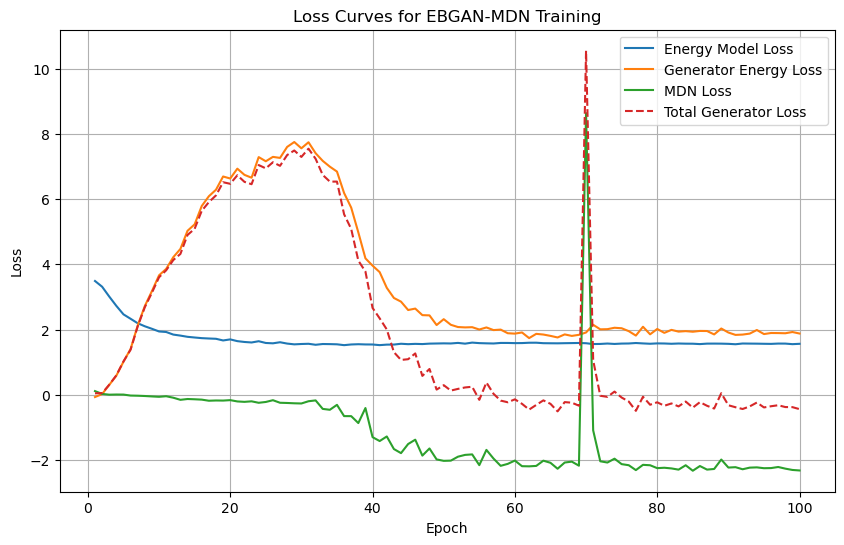

Run 2 - KL Divergence: 2.8315, Wasserstein Distance: 0.0108, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


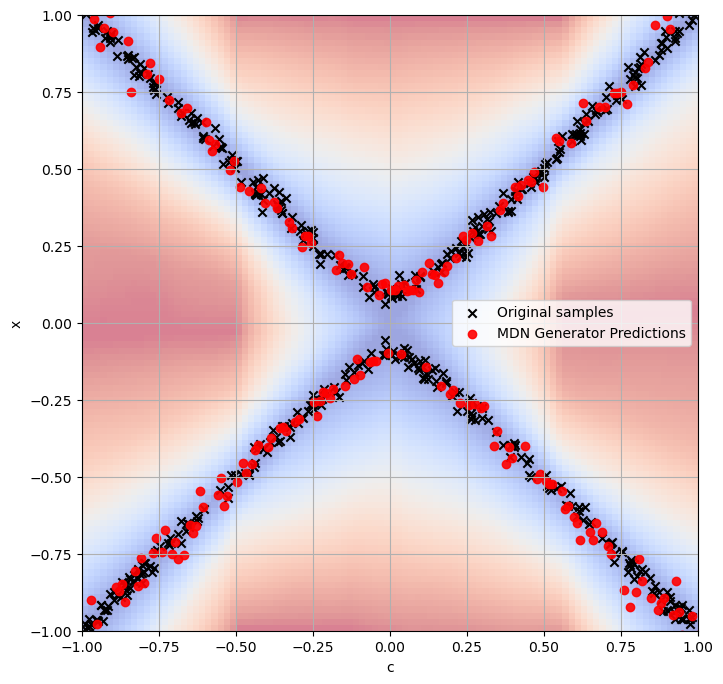


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4924, Generator Loss: 0.0712, Generator Energy Loss: -0.0318, Generator MDN Loss: 0.1030
Epoch [2/100], Energy Loss: 3.3217, Generator Loss: -0.0475, Generator Energy Loss: -0.0684, Generator MDN Loss: 0.0209
Epoch [3/100], Energy Loss: 3.0184, Generator Loss: 0.4377, Generator Energy Loss: 0.4393, Generator MDN Loss: -0.0017
Epoch [4/100], Energy Loss: 2.7221, Generator Loss: 0.9773, Generator Energy Loss: 0.9997, Generator MDN Loss: -0.0225
Epoch [5/100], Energy Loss: 2.4972, Generator Loss: 1.6534, Generator Energy Loss: 1.6756, Generator MDN Loss: -0.0223
Epoch [6/100], Energy Loss: 2.3383, Generator Loss: 2.3737, Generator Energy Loss: 2.4081, Generator MDN Loss: -0.0344
Epoch [7/100], Energy Loss: 2.2029, Generator Loss: 2.7948, Generator Energy Loss: 2.8494, Generator MDN Loss: -0.0546
Epoch [8/100], Energy Loss: 2.1438, Generator Loss: 3.0058, Generator Energy Loss: 3.1004, Generator MDN Loss: -0.0946
Epoch [9/100], Energy L

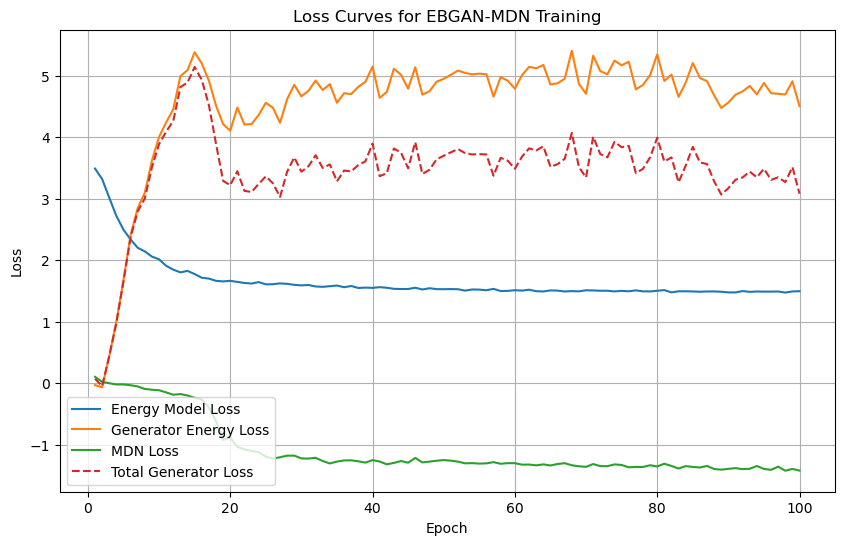

Run 3 - KL Divergence: 1.5856, Wasserstein Distance: 0.0075, Mode Coverage (%): 75.0, Avgerage Modes coveraged: 1.7


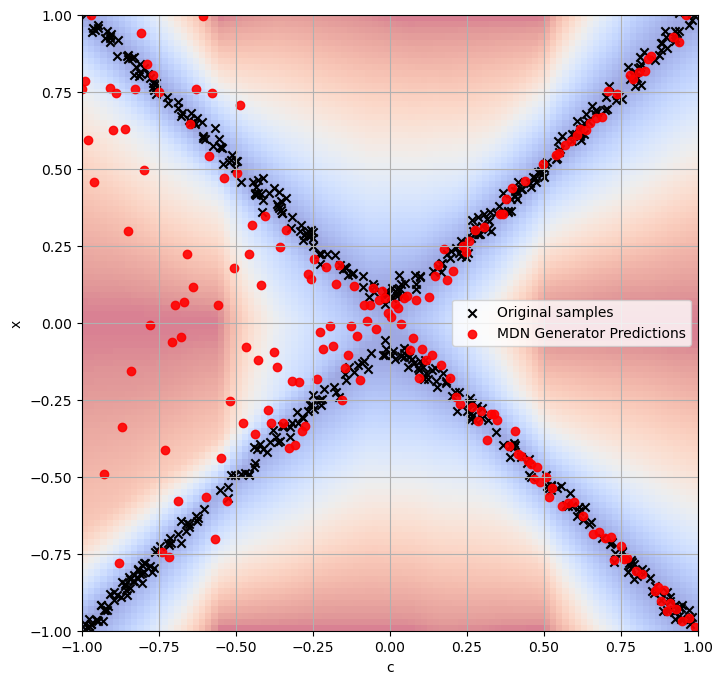


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4650, Generator Loss: 0.2653, Generator Energy Loss: 0.1317, Generator MDN Loss: 0.1336
Epoch [2/100], Energy Loss: 3.2240, Generator Loss: 0.6013, Generator Energy Loss: 0.5684, Generator MDN Loss: 0.0329
Epoch [3/100], Energy Loss: 2.9039, Generator Loss: 1.1875, Generator Energy Loss: 1.1695, Generator MDN Loss: 0.0180
Epoch [4/100], Energy Loss: 2.6446, Generator Loss: 1.7540, Generator Energy Loss: 1.7650, Generator MDN Loss: -0.0110
Epoch [5/100], Energy Loss: 2.4885, Generator Loss: 2.4079, Generator Energy Loss: 2.4391, Generator MDN Loss: -0.0312
Epoch [6/100], Energy Loss: 2.3250, Generator Loss: 2.7825, Generator Energy Loss: 2.8122, Generator MDN Loss: -0.0297
Epoch [7/100], Energy Loss: 2.2033, Generator Loss: 3.0952, Generator Energy Loss: 3.1127, Generator MDN Loss: -0.0175
Epoch [8/100], Energy Loss: 2.1266, Generator Loss: 3.2720, Generator Energy Loss: 3.3392, Generator MDN Loss: -0.0672
Epoch [9/100], Energy Loss:

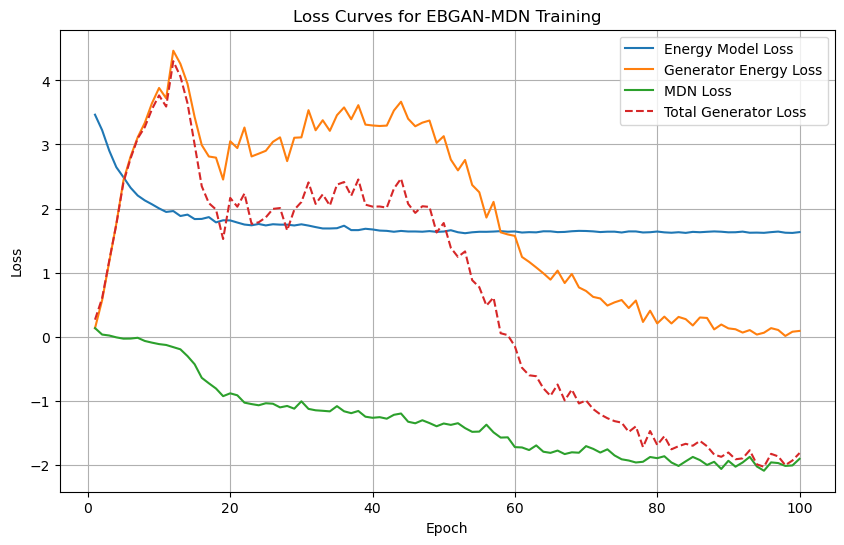

Run 4 - KL Divergence: 2.7215, Wasserstein Distance: 0.0068, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


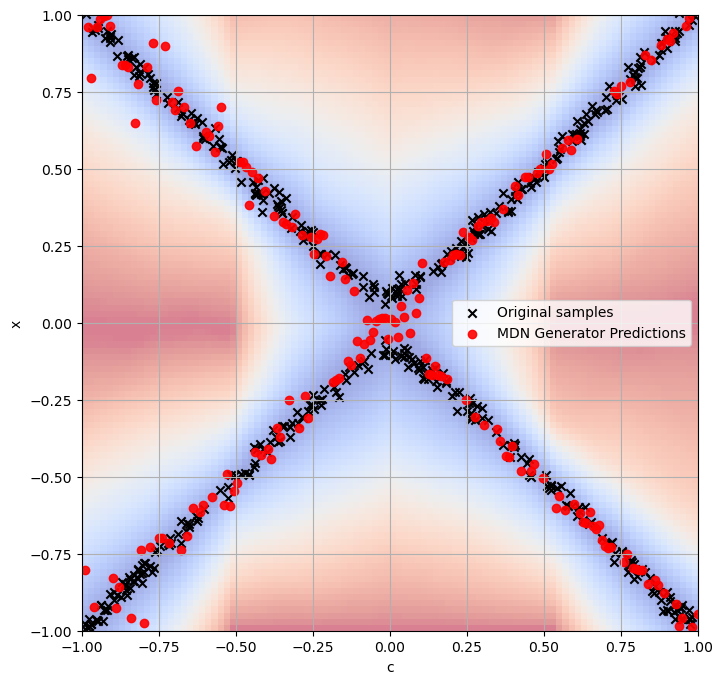


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4819, Generator Loss: 0.0109, Generator Energy Loss: -0.0525, Generator MDN Loss: 0.0634
Epoch [2/100], Energy Loss: 3.2889, Generator Loss: -0.2348, Generator Energy Loss: -0.2419, Generator MDN Loss: 0.0071
Epoch [3/100], Energy Loss: 2.9505, Generator Loss: -0.0529, Generator Energy Loss: -0.0413, Generator MDN Loss: -0.0116
Epoch [4/100], Energy Loss: 2.6796, Generator Loss: 0.3174, Generator Energy Loss: 0.3442, Generator MDN Loss: -0.0268
Epoch [5/100], Energy Loss: 2.4694, Generator Loss: 0.7418, Generator Energy Loss: 0.7905, Generator MDN Loss: -0.0487
Epoch [6/100], Energy Loss: 2.3566, Generator Loss: 1.2087, Generator Energy Loss: 1.2731, Generator MDN Loss: -0.0644
Epoch [7/100], Energy Loss: 2.2339, Generator Loss: 1.8351, Generator Energy Loss: 1.9235, Generator MDN Loss: -0.0884
Epoch [8/100], Energy Loss: 2.1608, Generator Loss: 2.2695, Generator Energy Loss: 2.3962, Generator MDN Loss: -0.1267
Epoch [9/100], Energy

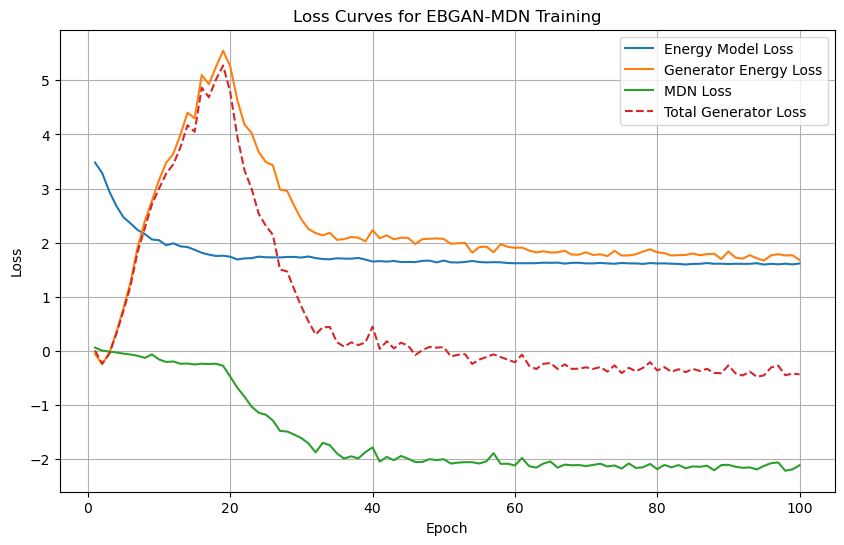

Run 5 - KL Divergence: 2.0437, Wasserstein Distance: 0.0083, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


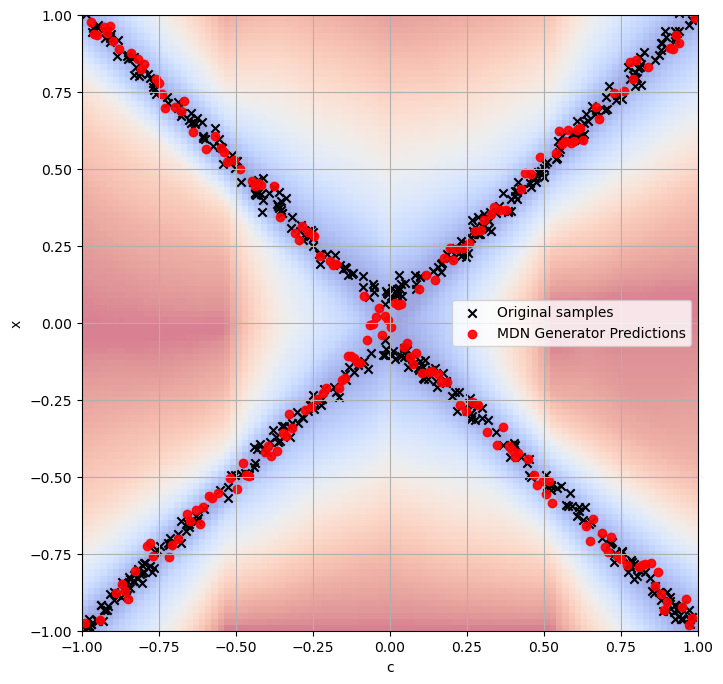

KL Divergence: 2.4028 ± 0.5032
Wasserstein Distance: 0.0085 ± 0.0014
Mode Coverage (%): 86.8000 ± 15.9800
Avgerage Modes coveraged: 1.8400 ± 0.1963


In [23]:
metrics_results_isotropic_across_clusters = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi=y_multi,
    noise_type=NoiseType.ISOTROPIC_ACROSS_CLUSTERS,
)


=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4850, Generator Loss: 133665.5220, Generator Energy Loss: -0.0784, Generator MDN Loss: 133665.6001
Epoch [2/100], Energy Loss: 3.2938, Generator Loss: 98541.1663, Generator Energy Loss: -0.1010, Generator MDN Loss: 98541.2678
Epoch [3/100], Energy Loss: 2.9204, Generator Loss: 73103.7537, Generator Energy Loss: 0.0538, Generator MDN Loss: 73103.7002
Epoch [4/100], Energy Loss: 2.6174, Generator Loss: 71248.3892, Generator Energy Loss: 0.2383, Generator MDN Loss: 71248.1509
Epoch [5/100], Energy Loss: 2.3663, Generator Loss: 58499.0555, Generator Energy Loss: 0.5547, Generator MDN Loss: 58498.5009
Epoch [6/100], Energy Loss: 2.2607, Generator Loss: 52606.3638, Generator Energy Loss: 0.8877, Generator MDN Loss: 52605.4753
Epoch [7/100], Energy Loss: 2.1215, Generator Loss: 53061.5317, Generator Energy Loss: 1.3209, Generator MDN Loss: 53060.2107
Epoch [8/100], Energy Loss: 2.0348, Generator Loss: 49780.0287, Generator Energy Loss: 1.6

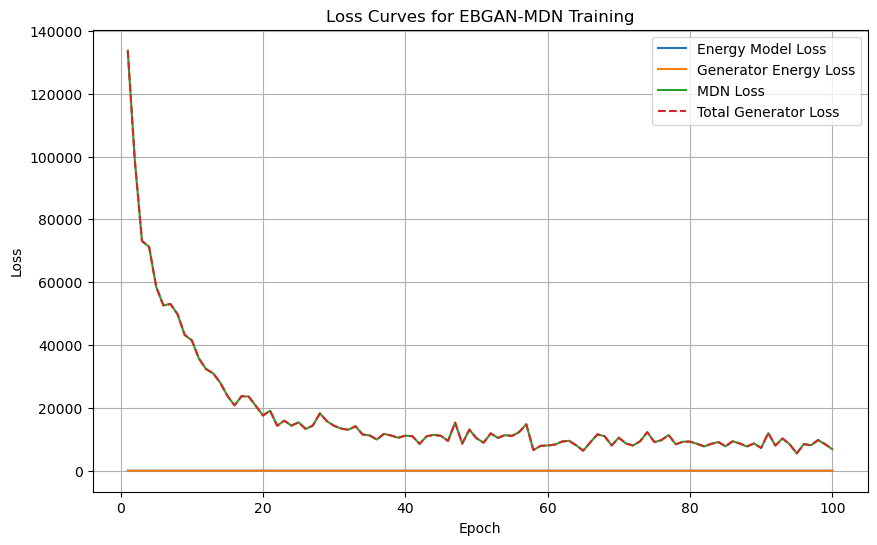

Run 1 - KL Divergence: 2.0364, Wasserstein Distance: 0.0071, Mode Coverage (%): 96.0, Avgerage Modes coveraged: 1.96


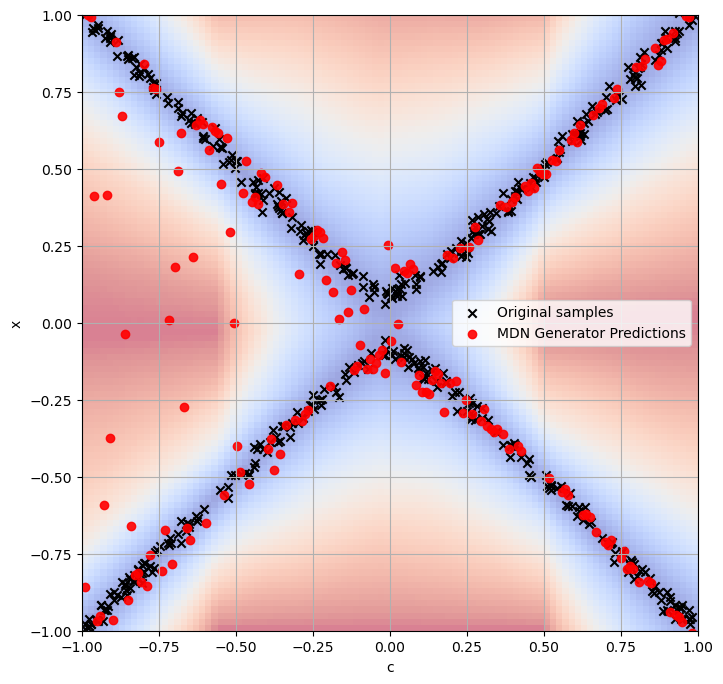


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4627, Generator Loss: 101139.8235, Generator Energy Loss: 0.1007, Generator MDN Loss: 101139.7234
Epoch [2/100], Energy Loss: 3.2407, Generator Loss: 45298.9175, Generator Energy Loss: 0.1535, Generator MDN Loss: 45298.7644
Epoch [3/100], Energy Loss: 2.9302, Generator Loss: 37258.8776, Generator Energy Loss: 0.2173, Generator MDN Loss: 37258.6604
Epoch [4/100], Energy Loss: 2.6986, Generator Loss: 33336.0576, Generator Energy Loss: 0.6350, Generator MDN Loss: 33335.4227
Epoch [5/100], Energy Loss: 2.5345, Generator Loss: 28362.2792, Generator Energy Loss: 0.9182, Generator MDN Loss: 28361.3610
Epoch [6/100], Energy Loss: 2.3645, Generator Loss: 27676.7227, Generator Energy Loss: 1.3460, Generator MDN Loss: 27675.3765
Epoch [7/100], Energy Loss: 2.2646, Generator Loss: 25423.7242, Generator Energy Loss: 1.4627, Generator MDN Loss: 25422.2615
Epoch [8/100], Energy Loss: 2.1746, Generator Loss: 22053.7725, Generator Energy Loss: 1.816

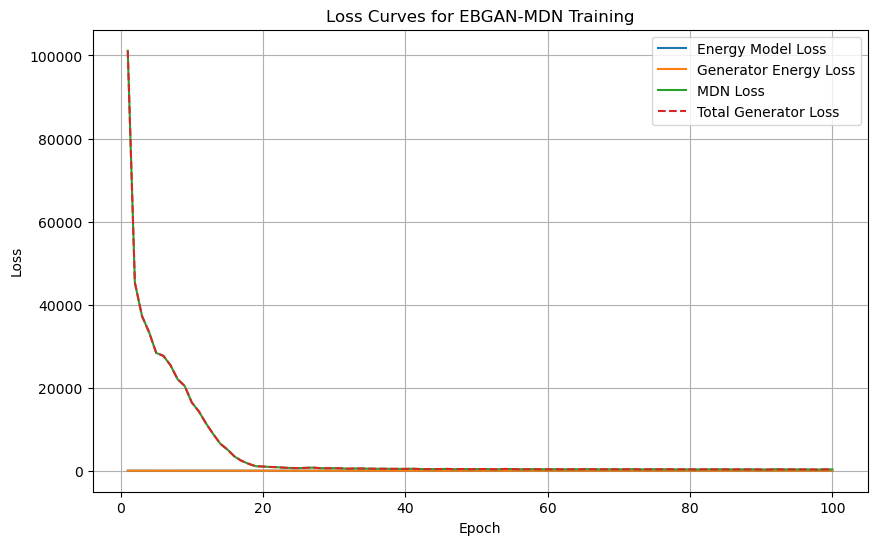

Run 2 - KL Divergence: 1.1210, Wasserstein Distance: 0.0071, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


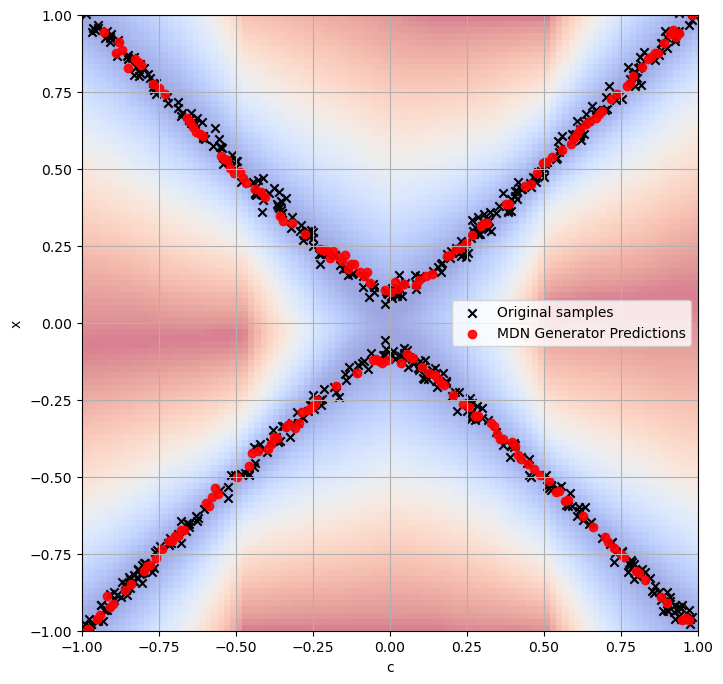


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.5004, Generator Loss: 115957.3540, Generator Energy Loss: -0.1378, Generator MDN Loss: 115957.4915
Epoch [2/100], Energy Loss: 3.3431, Generator Loss: 47018.0048, Generator Energy Loss: -0.2652, Generator MDN Loss: 47018.2695
Epoch [3/100], Energy Loss: 3.0206, Generator Loss: 34316.1632, Generator Energy Loss: -0.4582, Generator MDN Loss: 34316.6211
Epoch [4/100], Energy Loss: 2.6938, Generator Loss: 29260.3823, Generator Energy Loss: -0.8206, Generator MDN Loss: 29261.2030
Epoch [5/100], Energy Loss: 2.4720, Generator Loss: 27210.4319, Generator Energy Loss: -0.9397, Generator MDN Loss: 27211.3717
Epoch [6/100], Energy Loss: 2.3495, Generator Loss: 25006.2083, Generator Energy Loss: -1.0660, Generator MDN Loss: 25007.2743
Epoch [7/100], Energy Loss: 2.2560, Generator Loss: 21439.2363, Generator Energy Loss: -1.2760, Generator MDN Loss: 21440.5122
Epoch [8/100], Energy Loss: 2.1391, Generator Loss: 17724.4282, Generator Energy Loss

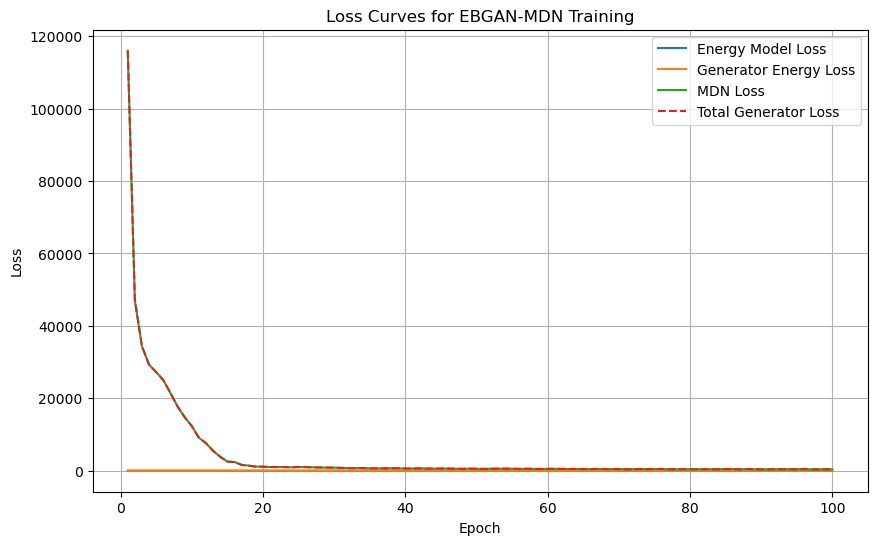

Run 3 - KL Divergence: 0.8026, Wasserstein Distance: 0.0070, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


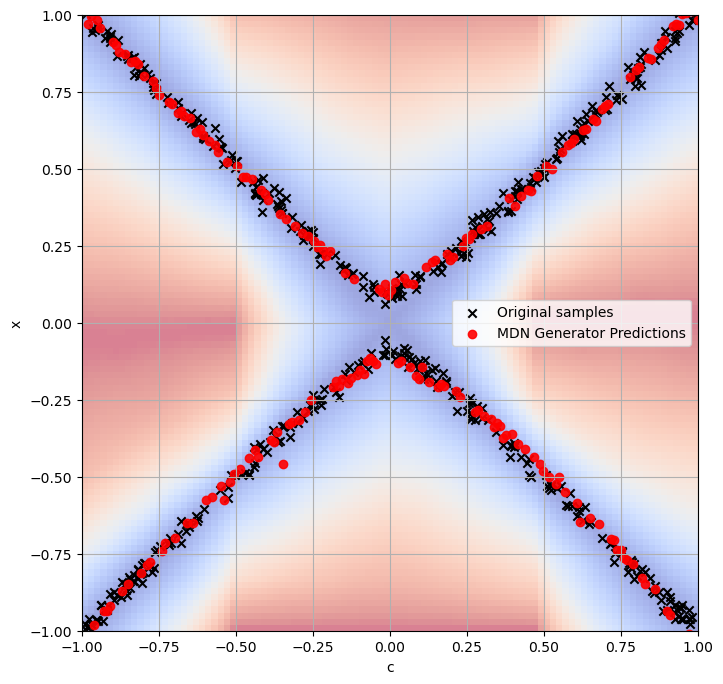


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4871, Generator Loss: 110486.6782, Generator Energy Loss: 0.1307, Generator MDN Loss: 110486.5474
Epoch [2/100], Energy Loss: 3.2975, Generator Loss: 51036.3523, Generator Energy Loss: -0.0992, Generator MDN Loss: 51036.4514
Epoch [3/100], Energy Loss: 2.9297, Generator Loss: 41455.1772, Generator Energy Loss: -0.1676, Generator MDN Loss: 41455.3452
Epoch [4/100], Energy Loss: 2.6138, Generator Loss: 34140.6279, Generator Energy Loss: 0.0351, Generator MDN Loss: 34140.5930
Epoch [5/100], Energy Loss: 2.4252, Generator Loss: 29562.3573, Generator Energy Loss: 0.2322, Generator MDN Loss: 29562.1251
Epoch [6/100], Energy Loss: 2.2794, Generator Loss: 27582.1016, Generator Energy Loss: 0.5090, Generator MDN Loss: 27581.5928
Epoch [7/100], Energy Loss: 2.1595, Generator Loss: 23705.3272, Generator Energy Loss: 0.7774, Generator MDN Loss: 23704.5496
Epoch [8/100], Energy Loss: 2.1042, Generator Loss: 20280.2333, Generator Energy Loss: 1.0

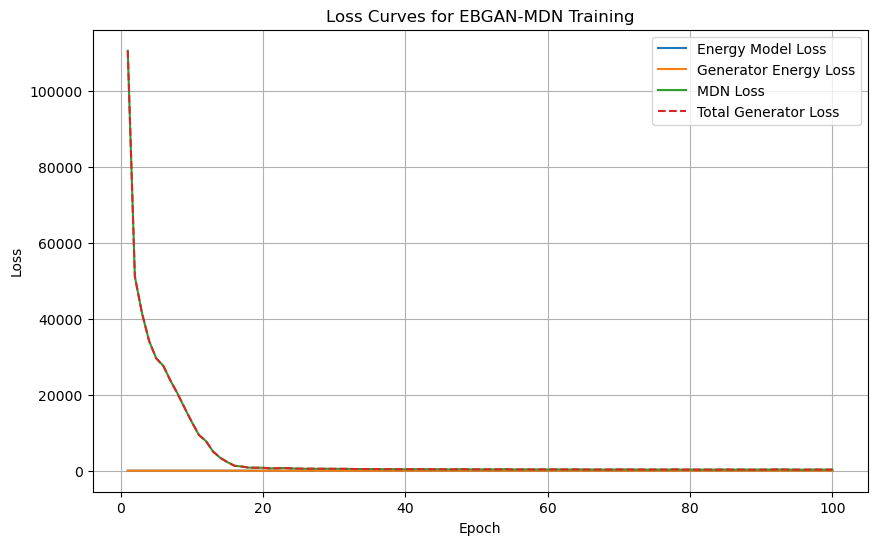

Run 4 - KL Divergence: 1.8006, Wasserstein Distance: 0.0076, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


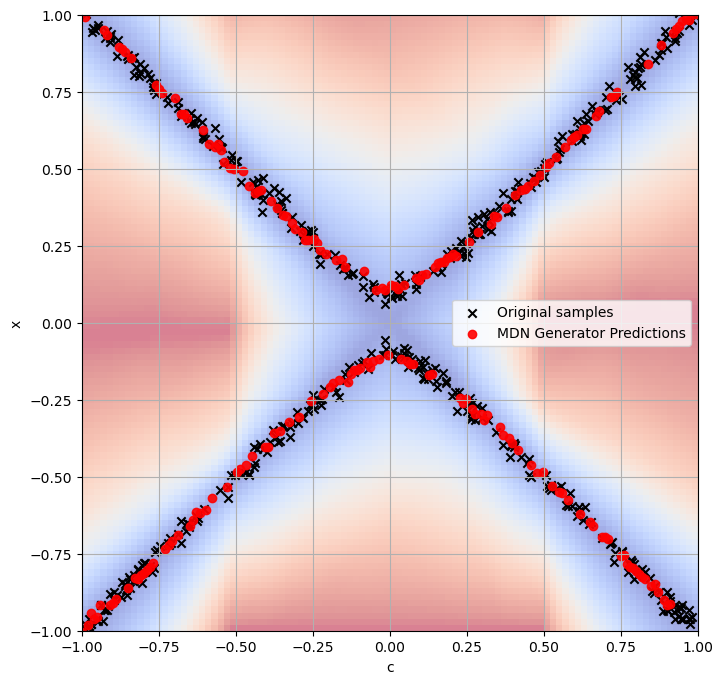


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4966, Generator Loss: 130476.4521, Generator Energy Loss: -0.0650, Generator MDN Loss: 130476.5161
Epoch [2/100], Energy Loss: 3.3499, Generator Loss: 88920.8035, Generator Energy Loss: 0.1533, Generator MDN Loss: 88920.6499
Epoch [3/100], Energy Loss: 3.1368, Generator Loss: 60691.9886, Generator Energy Loss: 0.7376, Generator MDN Loss: 60691.2509
Epoch [4/100], Energy Loss: 2.8726, Generator Loss: 46077.8176, Generator Energy Loss: 1.1538, Generator MDN Loss: 46076.6639
Epoch [5/100], Energy Loss: 2.5845, Generator Loss: 35782.9554, Generator Energy Loss: 1.7000, Generator MDN Loss: 35781.2556
Epoch [6/100], Energy Loss: 2.4029, Generator Loss: 32304.7180, Generator Energy Loss: 2.2886, Generator MDN Loss: 32302.4292
Epoch [7/100], Energy Loss: 2.2500, Generator Loss: 28896.4104, Generator Energy Loss: 3.1008, Generator MDN Loss: 28893.3096
Epoch [8/100], Energy Loss: 2.1772, Generator Loss: 24463.9364, Generator Energy Loss: 3.66

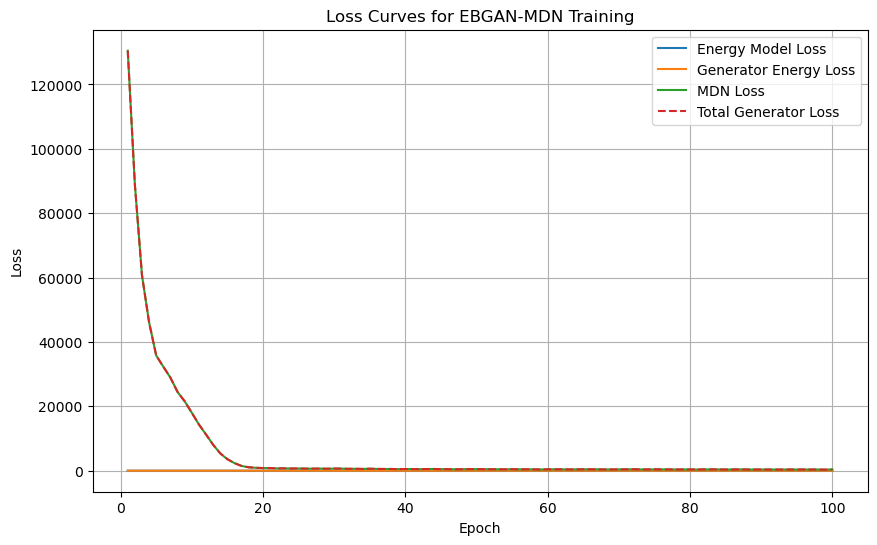

Run 5 - KL Divergence: 1.3332, Wasserstein Distance: 0.0079, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


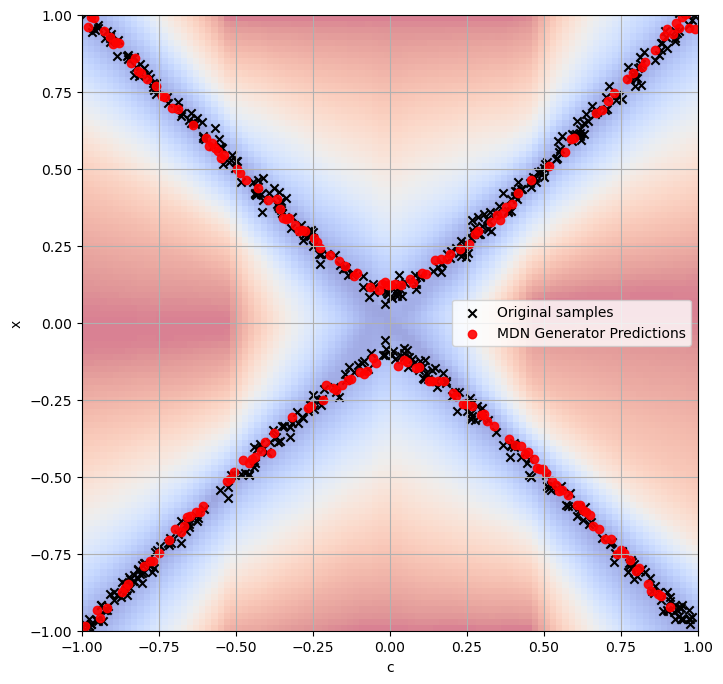

KL Divergence: 1.4187 ± 0.4479
Wasserstein Distance: 0.0073 ± 0.0004
Mode Coverage (%): 99.2000 ± 1.6000
Avgerage Modes coveraged: 1.9920 ± 0.0160

=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4969, Generator Loss: 1023.1248, Generator Energy Loss: 0.1468, Generator MDN Loss: 1022.9780
Epoch [2/100], Energy Loss: 3.3411, Generator Loss: 475.9241, Generator Energy Loss: 0.1817, Generator MDN Loss: 475.7423
Epoch [3/100], Energy Loss: 3.0559, Generator Loss: 346.7490, Generator Energy Loss: 0.4213, Generator MDN Loss: 346.3277
Epoch [4/100], Energy Loss: 2.7733, Generator Loss: 319.1100, Generator Energy Loss: 0.7482, Generator MDN Loss: 318.3618
Epoch [5/100], Energy Loss: 2.5719, Generator Loss: 275.4358, Generator Energy Loss: 0.9489, Generator MDN Loss: 274.4870
Epoch [6/100], Energy Loss: 2.4875, Generator Loss: 251.1029, Generator Energy Loss: 1.3578, Generator MDN Loss: 249.7451
Epoch [7/100], Energy Loss: 2.3386, Generator Loss: 219.2688, Generator Energy Loss: 1.6558, Ge

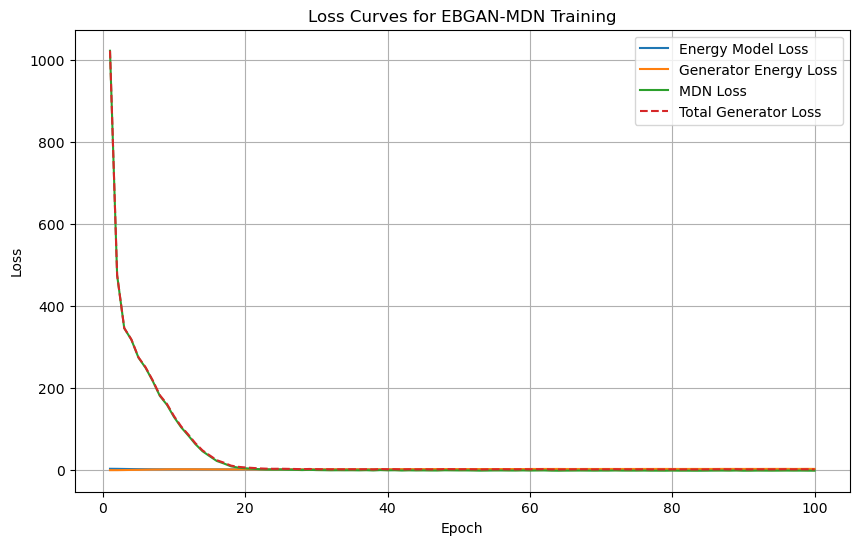

Run 1 - KL Divergence: 1.1038, Wasserstein Distance: 0.0064, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


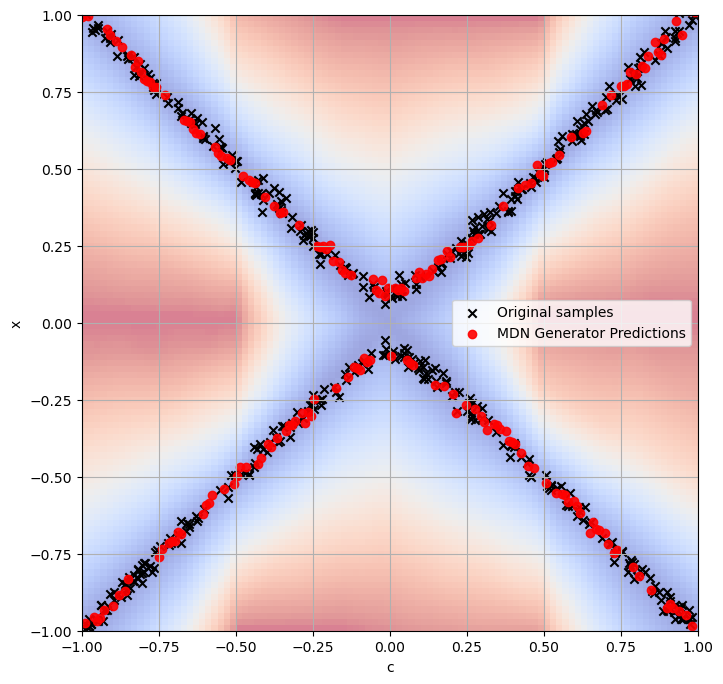


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4645, Generator Loss: 1120.8618, Generator Energy Loss: 0.0597, Generator MDN Loss: 1120.8021
Epoch [2/100], Energy Loss: 3.2652, Generator Loss: 490.6935, Generator Energy Loss: 0.1224, Generator MDN Loss: 490.5711
Epoch [3/100], Energy Loss: 2.9110, Generator Loss: 320.3016, Generator Energy Loss: 0.3195, Generator MDN Loss: 319.9821
Epoch [4/100], Energy Loss: 2.6341, Generator Loss: 301.8950, Generator Energy Loss: 0.6232, Generator MDN Loss: 301.2719
Epoch [5/100], Energy Loss: 2.4366, Generator Loss: 244.4550, Generator Energy Loss: 0.9573, Generator MDN Loss: 243.4976
Epoch [6/100], Energy Loss: 2.3111, Generator Loss: 210.9326, Generator Energy Loss: 1.1160, Generator MDN Loss: 209.8165
Epoch [7/100], Energy Loss: 2.2022, Generator Loss: 190.1633, Generator Energy Loss: 1.3722, Generator MDN Loss: 188.7911
Epoch [8/100], Energy Loss: 2.1026, Generator Loss: 149.9926, Generator Energy Loss: 1.4094, Generator MDN Loss: 148.583

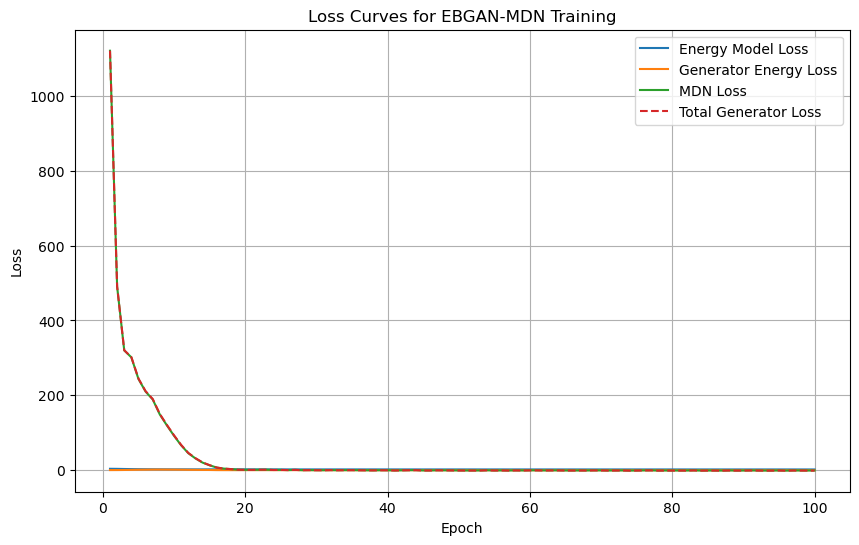

Run 2 - KL Divergence: 0.9911, Wasserstein Distance: 0.0071, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


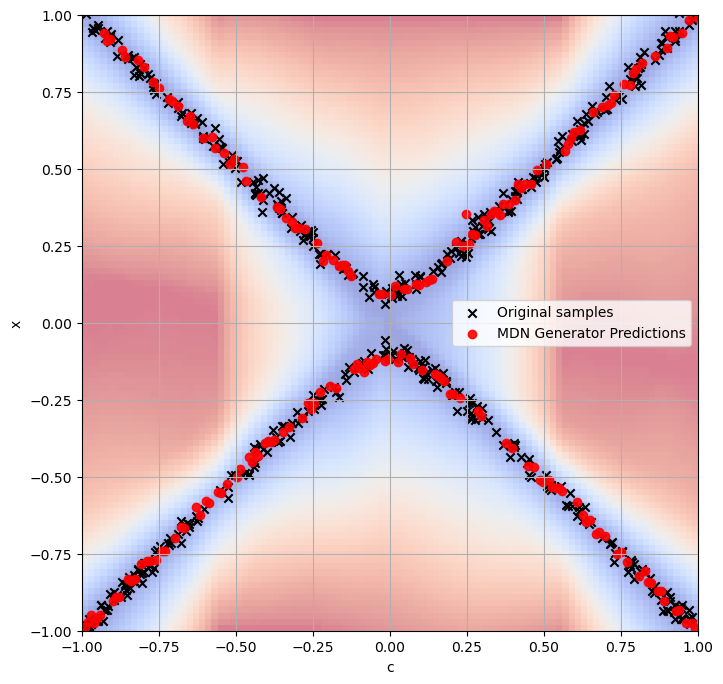


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4771, Generator Loss: 1495.1946, Generator Energy Loss: -0.0665, Generator MDN Loss: 1495.2611
Epoch [2/100], Energy Loss: 3.2957, Generator Loss: 951.4126, Generator Energy Loss: -0.0865, Generator MDN Loss: 951.4991
Epoch [3/100], Energy Loss: 2.9800, Generator Loss: 531.4506, Generator Energy Loss: -0.1591, Generator MDN Loss: 531.6097
Epoch [4/100], Energy Loss: 2.7006, Generator Loss: 228.3118, Generator Energy Loss: -0.3531, Generator MDN Loss: 228.6649
Epoch [5/100], Energy Loss: 2.5344, Generator Loss: 69.1089, Generator Energy Loss: -0.8229, Generator MDN Loss: 69.9318
Epoch [6/100], Energy Loss: 2.4041, Generator Loss: 20.8171, Generator Energy Loss: -1.2158, Generator MDN Loss: 22.0329
Epoch [7/100], Energy Loss: 2.3305, Generator Loss: 12.0447, Generator Energy Loss: -1.2720, Generator MDN Loss: 13.3167
Epoch [8/100], Energy Loss: 2.3188, Generator Loss: 9.0827, Generator Energy Loss: -1.0768, Generator MDN Loss: 10.1594

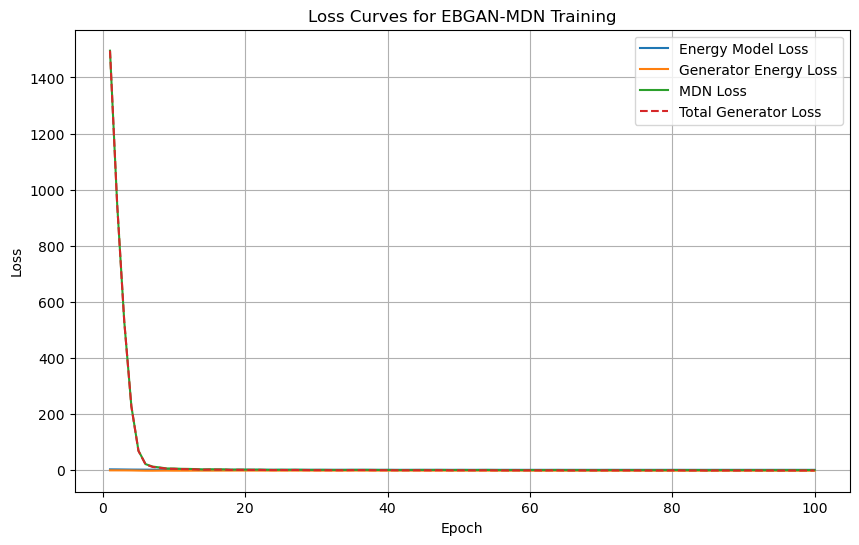

Run 3 - KL Divergence: 2.3780, Wasserstein Distance: 0.0068, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


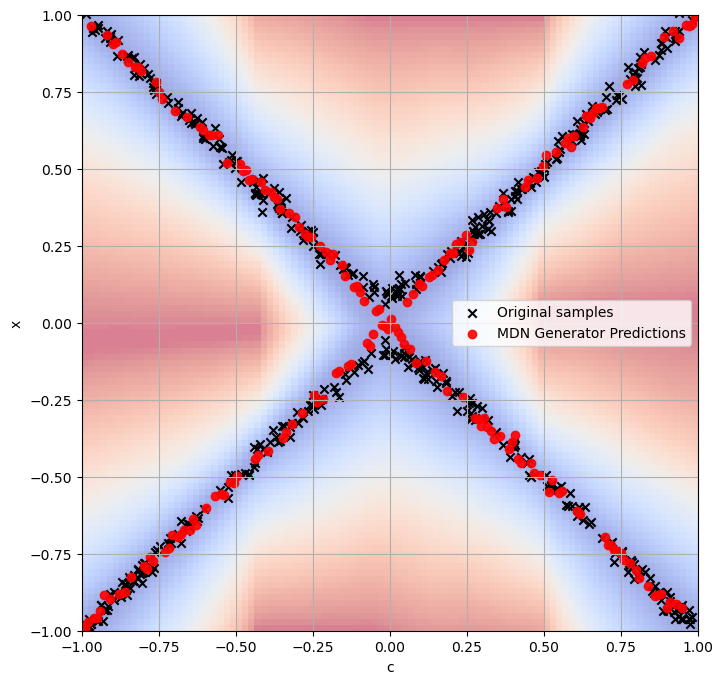


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4845, Generator Loss: 1377.9397, Generator Energy Loss: 0.2009, Generator MDN Loss: 1377.7387
Epoch [2/100], Energy Loss: 3.3055, Generator Loss: 813.6691, Generator Energy Loss: 0.4159, Generator MDN Loss: 813.2532
Epoch [3/100], Energy Loss: 2.9837, Generator Loss: 457.8657, Generator Energy Loss: 0.6858, Generator MDN Loss: 457.1799
Epoch [4/100], Energy Loss: 2.6955, Generator Loss: 415.7811, Generator Energy Loss: 1.1759, Generator MDN Loss: 414.6052
Epoch [5/100], Energy Loss: 2.5010, Generator Loss: 350.5531, Generator Energy Loss: 1.6506, Generator MDN Loss: 348.9025
Epoch [6/100], Energy Loss: 2.3563, Generator Loss: 312.0189, Generator Energy Loss: 2.0755, Generator MDN Loss: 309.9434
Epoch [7/100], Energy Loss: 2.2703, Generator Loss: 285.9158, Generator Energy Loss: 2.4589, Generator MDN Loss: 283.4569
Epoch [8/100], Energy Loss: 2.2653, Generator Loss: 258.2932, Generator Energy Loss: 2.7061, Generator MDN Loss: 255.587

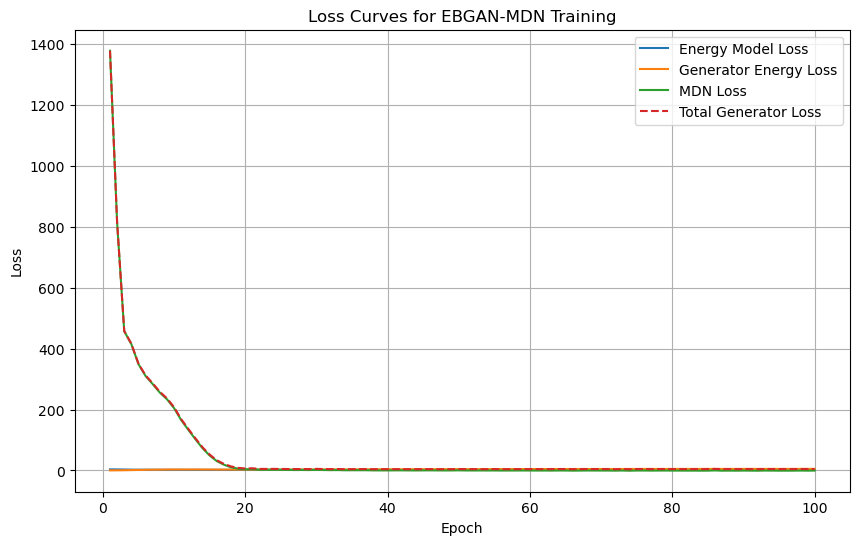

Run 4 - KL Divergence: 1.7886, Wasserstein Distance: 0.0080, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


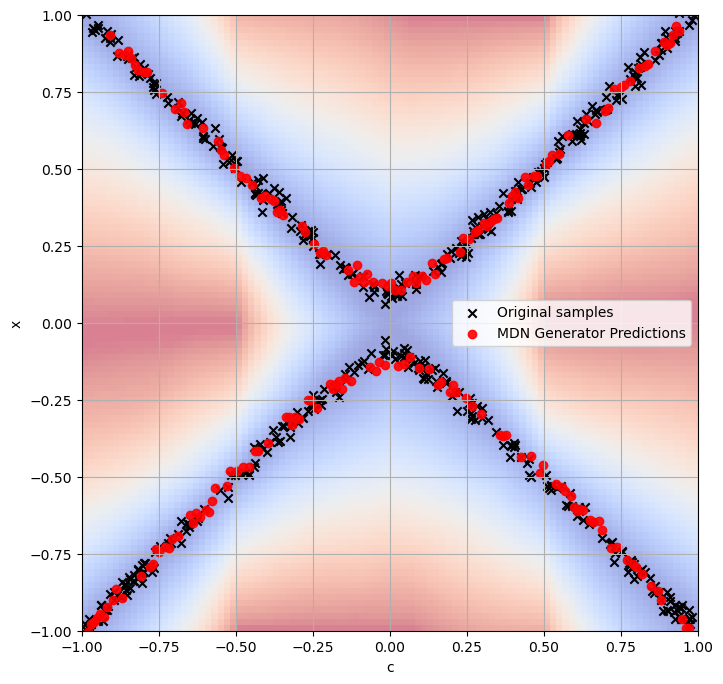


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4836, Generator Loss: 798.0262, Generator Energy Loss: -0.0510, Generator MDN Loss: 798.0772
Epoch [2/100], Energy Loss: 3.3446, Generator Loss: 421.3816, Generator Energy Loss: -0.1467, Generator MDN Loss: 421.5282
Epoch [3/100], Energy Loss: 3.0654, Generator Loss: 357.1970, Generator Energy Loss: -0.2048, Generator MDN Loss: 357.4018
Epoch [4/100], Energy Loss: 2.8053, Generator Loss: 299.4017, Generator Energy Loss: -0.1614, Generator MDN Loss: 299.5630
Epoch [5/100], Energy Loss: 2.5797, Generator Loss: 253.9018, Generator Energy Loss: -0.3437, Generator MDN Loss: 254.2455
Epoch [6/100], Energy Loss: 2.4147, Generator Loss: 225.2299, Generator Energy Loss: -0.1012, Generator MDN Loss: 225.3311
Epoch [7/100], Energy Loss: 2.3262, Generator Loss: 189.8397, Generator Energy Loss: 0.1178, Generator MDN Loss: 189.7219
Epoch [8/100], Energy Loss: 2.2243, Generator Loss: 154.4280, Generator Energy Loss: 0.3149, Generator MDN Loss: 154

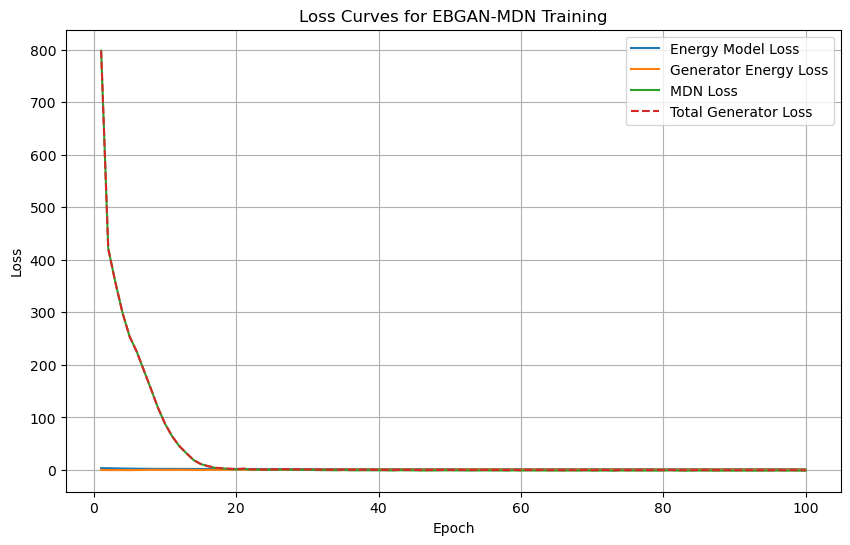

Run 5 - KL Divergence: 1.8301, Wasserstein Distance: 0.0087, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


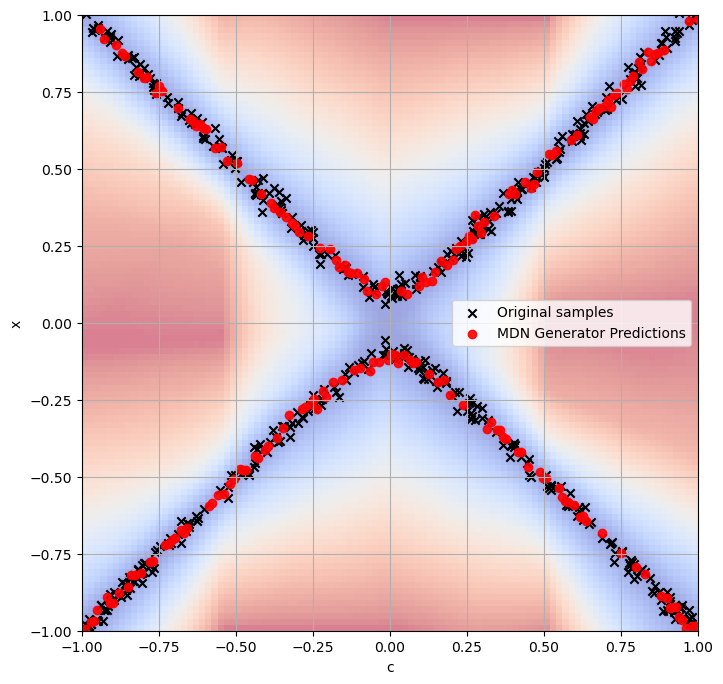

KL Divergence: 1.6183 ± 0.5117
Wasserstein Distance: 0.0074 ± 0.0008
Mode Coverage (%): 99.6000 ± 0.4899
Avgerage Modes coveraged: 1.9960 ± 0.0049

=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4830, Generator Loss: 12.8948, Generator Energy Loss: 0.2139, Generator MDN Loss: 12.6809
Epoch [2/100], Energy Loss: 3.2957, Generator Loss: 8.8547, Generator Energy Loss: 0.2807, Generator MDN Loss: 8.5740
Epoch [3/100], Energy Loss: 2.9538, Generator Loss: 6.2472, Generator Energy Loss: 0.4026, Generator MDN Loss: 5.8446
Epoch [4/100], Energy Loss: 2.6434, Generator Loss: 5.0807, Generator Energy Loss: 0.7284, Generator MDN Loss: 4.3524
Epoch [5/100], Energy Loss: 2.4285, Generator Loss: 5.3546, Generator Energy Loss: 1.2517, Generator MDN Loss: 4.1029
Epoch [6/100], Energy Loss: 2.2553, Generator Loss: 4.6661, Generator Energy Loss: 1.6502, Generator MDN Loss: 3.0159
Epoch [7/100], Energy Loss: 2.1351, Generator Loss: 3.8727, Generator Energy Loss: 2.1084, Generator MDN Loss: 1.7643
E

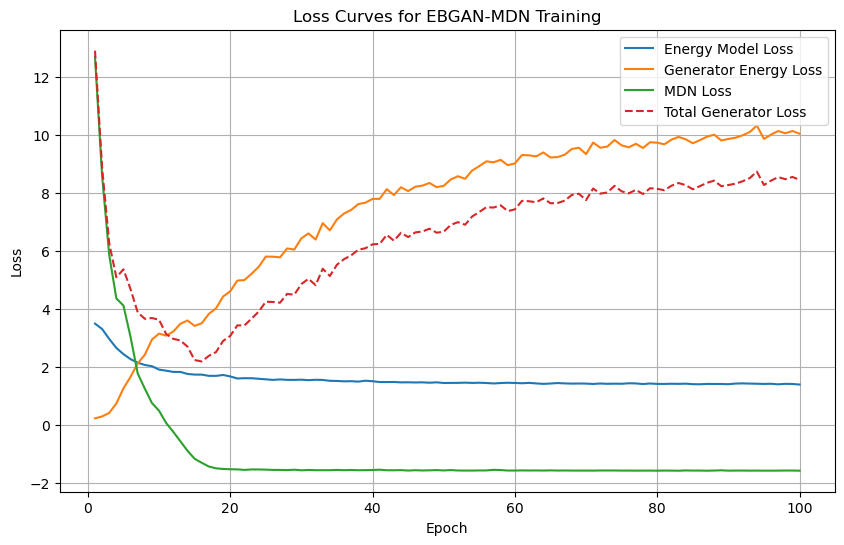

Run 1 - KL Divergence: 2.8835, Wasserstein Distance: 0.0066, Mode Coverage (%): 86.0, Avgerage Modes coveraged: 1.86


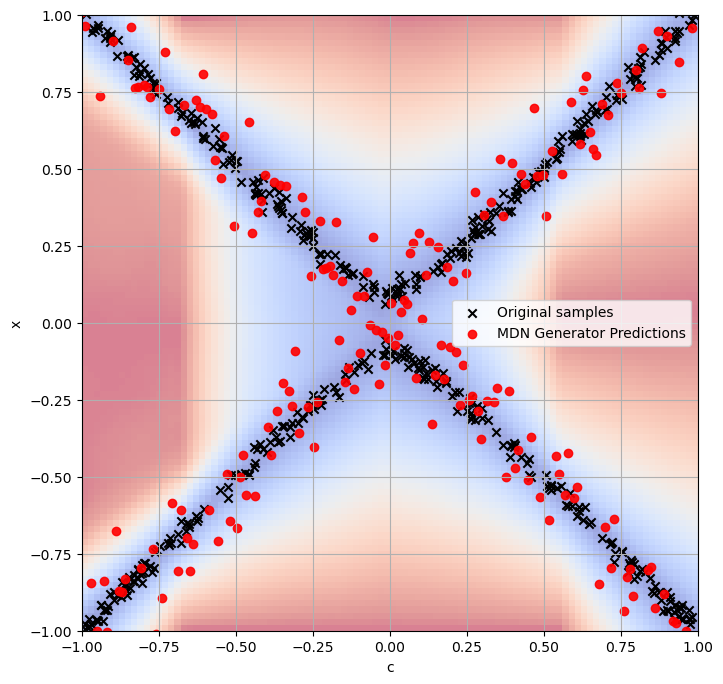


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4691, Generator Loss: 7.1414, Generator Energy Loss: 0.0542, Generator MDN Loss: 7.0872
Epoch [2/100], Energy Loss: 3.2418, Generator Loss: 3.7425, Generator Energy Loss: 0.1720, Generator MDN Loss: 3.5705
Epoch [3/100], Energy Loss: 2.8796, Generator Loss: 2.7576, Generator Energy Loss: 0.5608, Generator MDN Loss: 2.1969
Epoch [4/100], Energy Loss: 2.5960, Generator Loss: 2.7679, Generator Energy Loss: 1.1626, Generator MDN Loss: 1.6053
Epoch [5/100], Energy Loss: 2.4046, Generator Loss: 2.7252, Generator Energy Loss: 1.6748, Generator MDN Loss: 1.0503
Epoch [6/100], Energy Loss: 2.2868, Generator Loss: 2.9747, Generator Energy Loss: 2.2134, Generator MDN Loss: 0.7613
Epoch [7/100], Energy Loss: 2.1815, Generator Loss: 2.9310, Generator Energy Loss: 2.5248, Generator MDN Loss: 0.4062
Epoch [8/100], Energy Loss: 2.1021, Generator Loss: 2.9341, Generator Energy Loss: 2.8909, Generator MDN Loss: 0.0432
Epoch [9/100], Energy Loss: 2.04

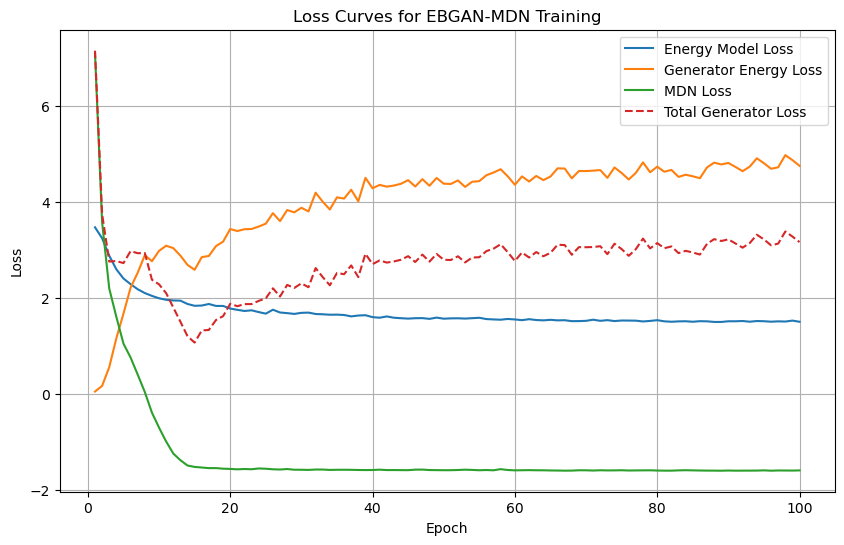

Run 2 - KL Divergence: 2.8367, Wasserstein Distance: 0.0103, Mode Coverage (%): 87.0, Avgerage Modes coveraged: 1.87


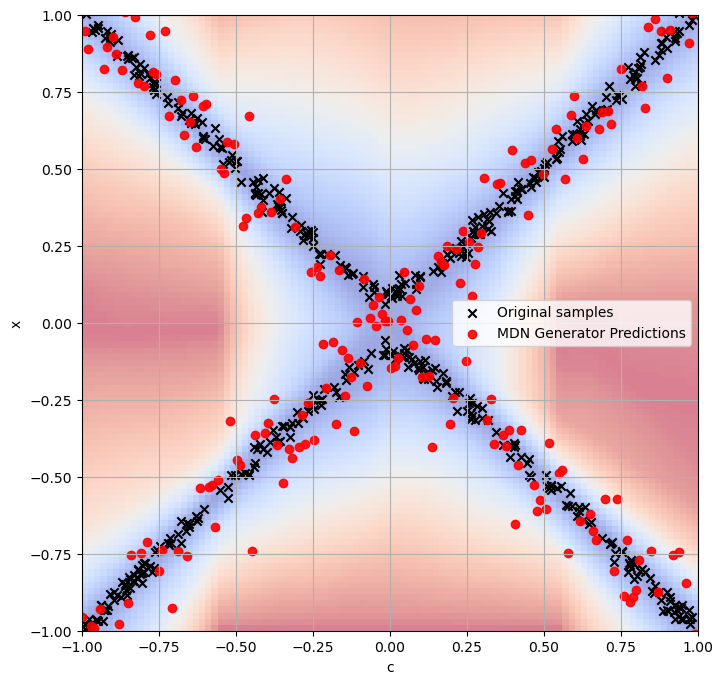


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4742, Generator Loss: 6.6838, Generator Energy Loss: 0.0660, Generator MDN Loss: 6.6178
Epoch [2/100], Energy Loss: 3.2673, Generator Loss: 3.4817, Generator Energy Loss: 0.1615, Generator MDN Loss: 3.3202
Epoch [3/100], Energy Loss: 2.9393, Generator Loss: 2.5025, Generator Energy Loss: 0.4921, Generator MDN Loss: 2.0104
Epoch [4/100], Energy Loss: 2.6554, Generator Loss: 2.5281, Generator Energy Loss: 1.0131, Generator MDN Loss: 1.5150
Epoch [5/100], Energy Loss: 2.4808, Generator Loss: 2.6227, Generator Energy Loss: 1.5565, Generator MDN Loss: 1.0663
Epoch [6/100], Energy Loss: 2.3547, Generator Loss: 2.8408, Generator Energy Loss: 2.1742, Generator MDN Loss: 0.6666
Epoch [7/100], Energy Loss: 2.2320, Generator Loss: 2.7913, Generator Energy Loss: 2.6382, Generator MDN Loss: 0.1531
Epoch [8/100], Energy Loss: 2.1610, Generator Loss: 2.7457, Generator Energy Loss: 2.9857, Generator MDN Loss: -0.2399
Epoch [9/100], Energy Loss: 2.0

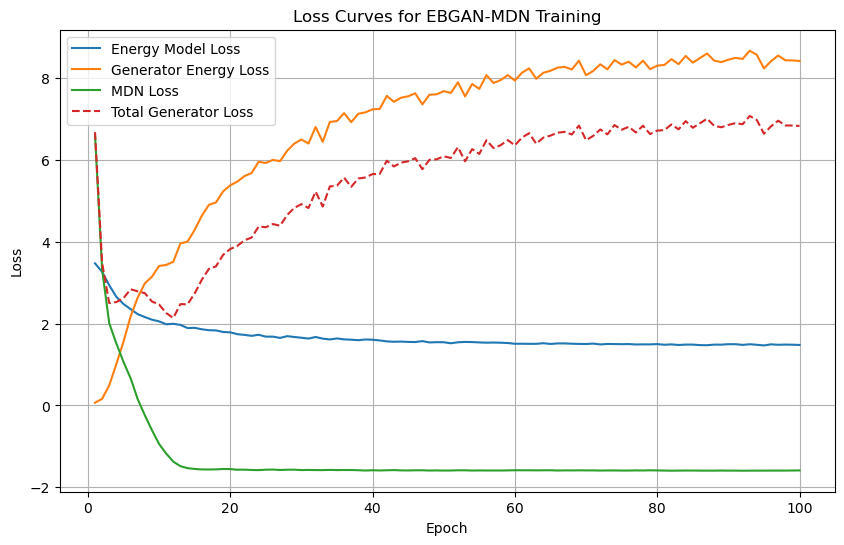

Run 3 - KL Divergence: 2.2118, Wasserstein Distance: 0.0065, Mode Coverage (%): 93.0, Avgerage Modes coveraged: 1.93


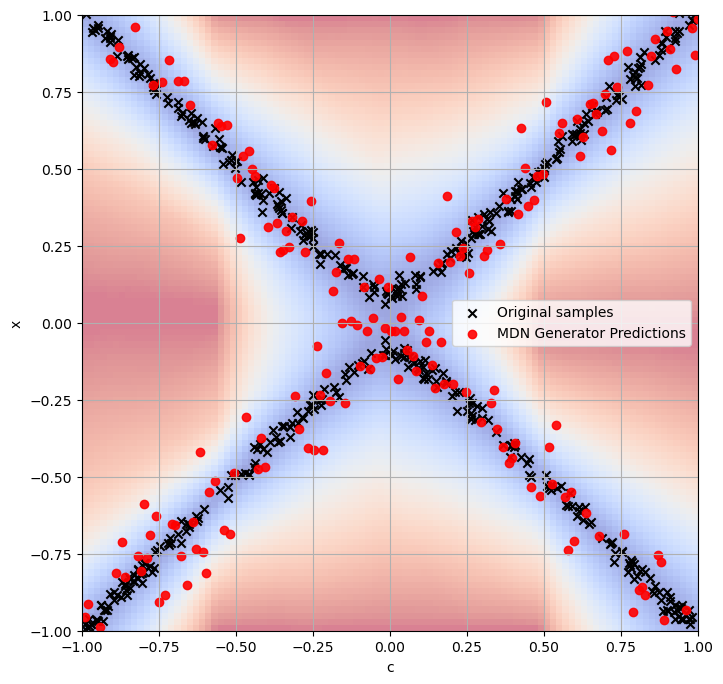


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4588, Generator Loss: 8.3439, Generator Energy Loss: 0.0479, Generator MDN Loss: 8.2960
Epoch [2/100], Energy Loss: 3.2447, Generator Loss: 3.1036, Generator Energy Loss: 0.3126, Generator MDN Loss: 2.7910
Epoch [3/100], Energy Loss: 2.9848, Generator Loss: 2.3899, Generator Energy Loss: 0.8452, Generator MDN Loss: 1.5447
Epoch [4/100], Energy Loss: 2.7204, Generator Loss: 2.5801, Generator Energy Loss: 1.3946, Generator MDN Loss: 1.1855
Epoch [5/100], Energy Loss: 2.5391, Generator Loss: 2.7280, Generator Energy Loss: 1.8751, Generator MDN Loss: 0.8529
Epoch [6/100], Energy Loss: 2.3899, Generator Loss: 2.8179, Generator Energy Loss: 2.3932, Generator MDN Loss: 0.4247
Epoch [7/100], Energy Loss: 2.2884, Generator Loss: 2.9450, Generator Energy Loss: 2.9686, Generator MDN Loss: -0.0235
Epoch [8/100], Energy Loss: 2.2047, Generator Loss: 2.8792, Generator Energy Loss: 3.2771, Generator MDN Loss: -0.3979
Epoch [9/100], Energy Loss: 2.

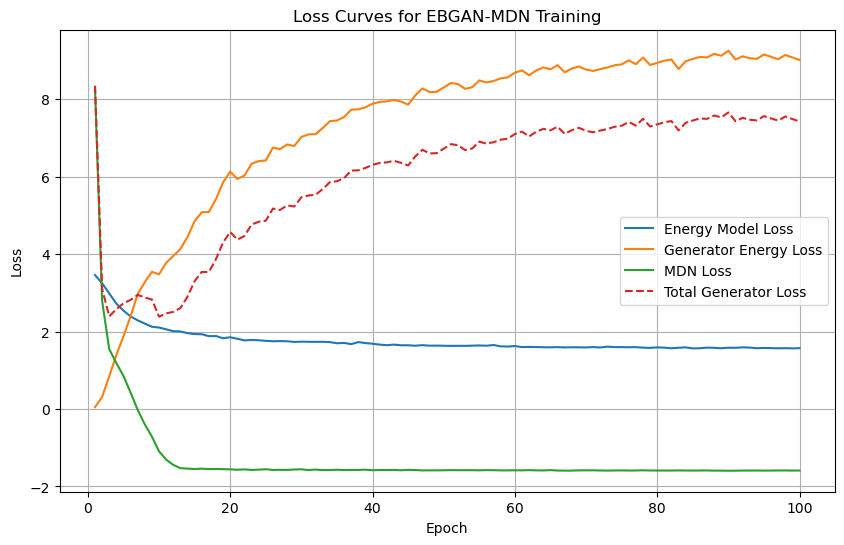

Run 4 - KL Divergence: 3.1499, Wasserstein Distance: 0.0096, Mode Coverage (%): 95.0, Avgerage Modes coveraged: 1.95


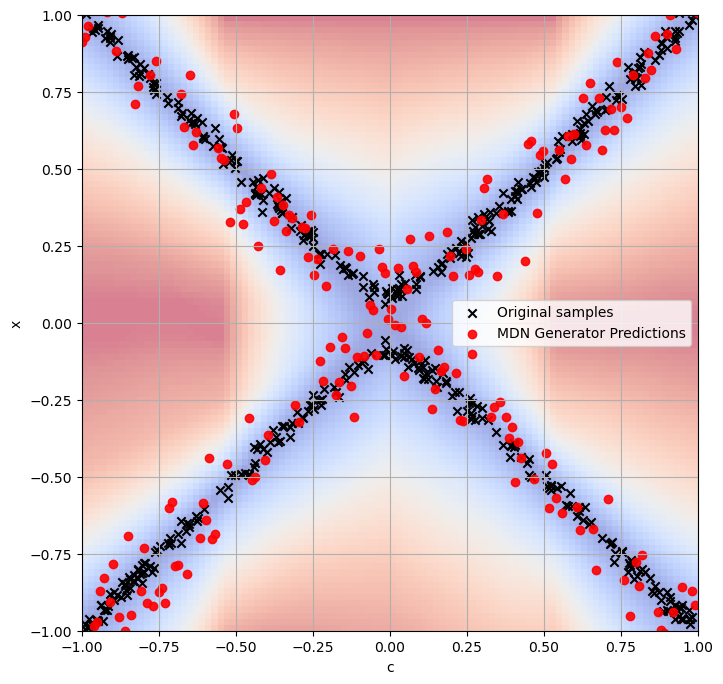


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4593, Generator Loss: 8.9512, Generator Energy Loss: 0.1149, Generator MDN Loss: 8.8363
Epoch [2/100], Energy Loss: 3.2096, Generator Loss: 3.8295, Generator Energy Loss: 0.2527, Generator MDN Loss: 3.5768
Epoch [3/100], Energy Loss: 2.8950, Generator Loss: 2.9504, Generator Energy Loss: 0.8303, Generator MDN Loss: 2.1201
Epoch [4/100], Energy Loss: 2.6424, Generator Loss: 2.7471, Generator Energy Loss: 1.4506, Generator MDN Loss: 1.2965
Epoch [5/100], Energy Loss: 2.4710, Generator Loss: 3.0114, Generator Energy Loss: 2.1606, Generator MDN Loss: 0.8508
Epoch [6/100], Energy Loss: 2.3472, Generator Loss: 3.1551, Generator Energy Loss: 2.7318, Generator MDN Loss: 0.4233
Epoch [7/100], Energy Loss: 2.2765, Generator Loss: 3.0028, Generator Energy Loss: 2.9957, Generator MDN Loss: 0.0071
Epoch [8/100], Energy Loss: 2.1898, Generator Loss: 2.9529, Generator Energy Loss: 3.3411, Generator MDN Loss: -0.3882
Epoch [9/100], Energy Loss: 2.1

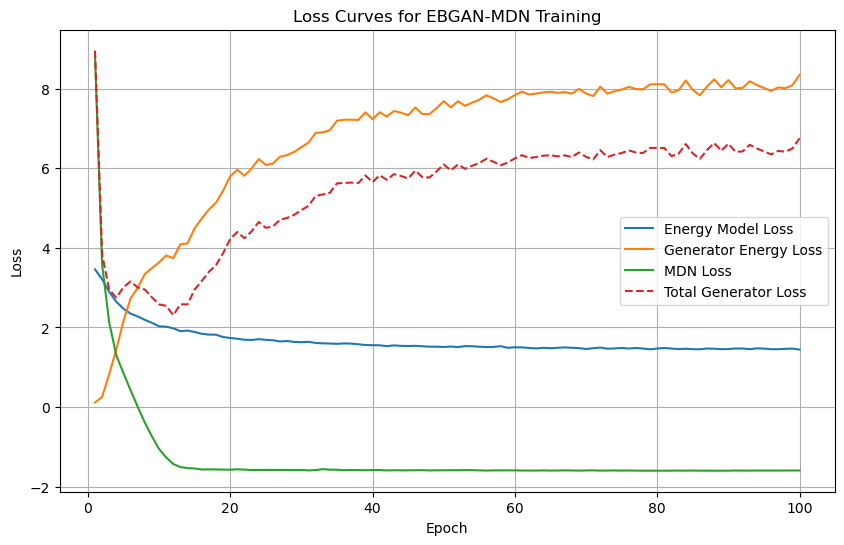

Run 5 - KL Divergence: 2.2324, Wasserstein Distance: 0.0065, Mode Coverage (%): 91.0, Avgerage Modes coveraged: 1.91


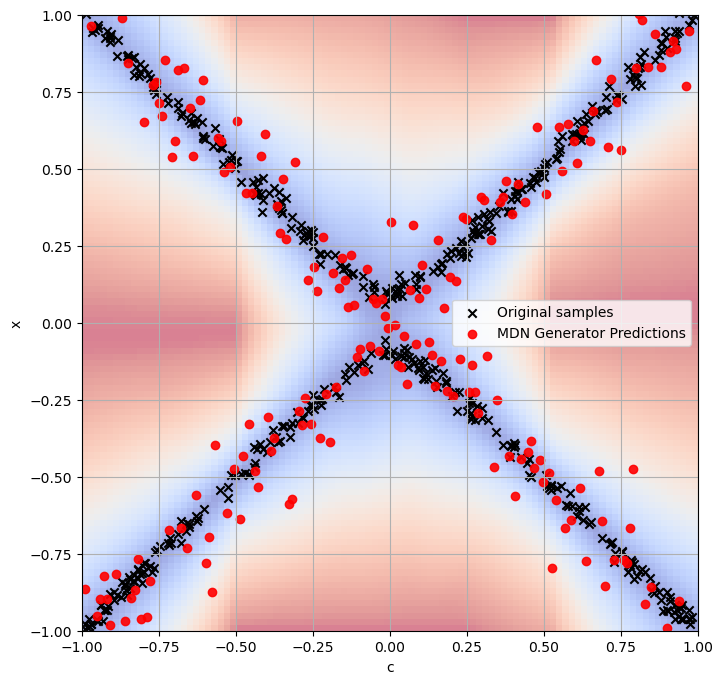

KL Divergence: 2.6629 ± 0.3755
Wasserstein Distance: 0.0079 ± 0.0017
Mode Coverage (%): 90.4000 ± 3.4409
Avgerage Modes coveraged: 1.9040 ± 0.0344


In [26]:
metrics_results_fixed_noise_3 = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi=y_multi,
    noise_type=NoiseType.FIXED,
    noise_level=1e-3
)

metrics_results_fixed_noise_2 = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi=y_multi,
    noise_type=NoiseType.FIXED,
    noise_level=1e-2
)

metrics_results_fixed_noise_1 = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi=y_multi,
    noise_type=NoiseType.FIXED,
    noise_level=1e-1
)

## Summary of Results

### Metrics for Different Noise Types

#### Diagonal Noise
- KL Divergence: 1.7141 ± 0.3794
- Wasserstein Distance: 0.0073 ± 0.0008
- Mode Coverage (%): 98.2000 ± 1.3266
- Avgerage Modes coveraged: 1.9820 ± 0.0133

#### Isotropic Noise
- KL Divergence: 2.3632 ± 0.8685
- Wasserstein Distance: 0.0071 ± 0.0009
- Mode Coverage (%): 97.6000 ± 3.3226
- Avgerage Modes coveraged: 1.9760 ± 0.0332

#### Isotropic Across Clusters Noise
- KL Divergence: 2.4028 ± 0.5032
- Wasserstein Distance: 0.0085 ± 0.0014
- Mode Coverage (%): 86.8000 ± 15.9800
- Avgerage Modes coveraged: 1.8400 ± 0.1963

#### Fixed Noise (1e-3)
- KL Divergence: 1.4187 ± 0.4479
- Wasserstein Distance: 0.0073 ± 0.0004
- Mode Coverage (%): 99.2000 ± 1.6000
- Avgerage Modes coveraged: 1.9920 ± 0.0160

#### Fixed Noise (1e-2)
- KL Divergence: 1.6183 ± 0.5117
- Wasserstein Distance: 0.0074 ± 0.0008
- Mode Coverage (%): 99.6000 ± 0.4899
- Avgerage Modes coveraged: 1.9960 ± 0.0049

#### Fixed Noise (1e-1)
- KL Divergence: 2.6629 ± 0.3755
- Wasserstein Distance: 0.0079 ± 0.0017
- Mode Coverage (%): 90.4000 ± 3.4409
- Avgerage Modes coveraged: 1.9040 ± 0.0344

#### Laplace Noise (diagonal)
- KL Divergence: 1.4938 ± 0.2573
- Wasserstein Distance: 0.0071 ± 0.0008
- Mode Coverage (%): 99.4000 ± 0.4899
- Avgerage Modes coveraged: 1.9940 ± 0.0049


=== Training Run 1 ===
Epoch [1/100], Energy Loss: 3.4821, Generator Loss: 0.3023, Generator Energy Loss: 0.0562, Generator MDN Loss: 0.2461
Epoch [2/100], Energy Loss: 3.2536, Generator Loss: 0.5441, Generator Energy Loss: 0.4276, Generator MDN Loss: 0.1165
Epoch [3/100], Energy Loss: 2.8112, Generator Loss: 0.9415, Generator Energy Loss: 0.8867, Generator MDN Loss: 0.0547
Epoch [4/100], Energy Loss: 2.4872, Generator Loss: 1.5373, Generator Energy Loss: 1.4874, Generator MDN Loss: 0.0499
Epoch [5/100], Energy Loss: 2.3532, Generator Loss: 2.3501, Generator Energy Loss: 2.3198, Generator MDN Loss: 0.0303
Epoch [6/100], Energy Loss: 2.2050, Generator Loss: 2.6290, Generator Energy Loss: 2.5870, Generator MDN Loss: 0.0420
Epoch [7/100], Energy Loss: 2.1172, Generator Loss: 3.1636, Generator Energy Loss: 3.2186, Generator MDN Loss: -0.0550
Epoch [8/100], Energy Loss: 2.0591, Generator Loss: 3.2781, Generator Energy Loss: 3.1130, Generator MDN Loss: 0.1651
Epoch [9/100], Energy Loss: 1.9

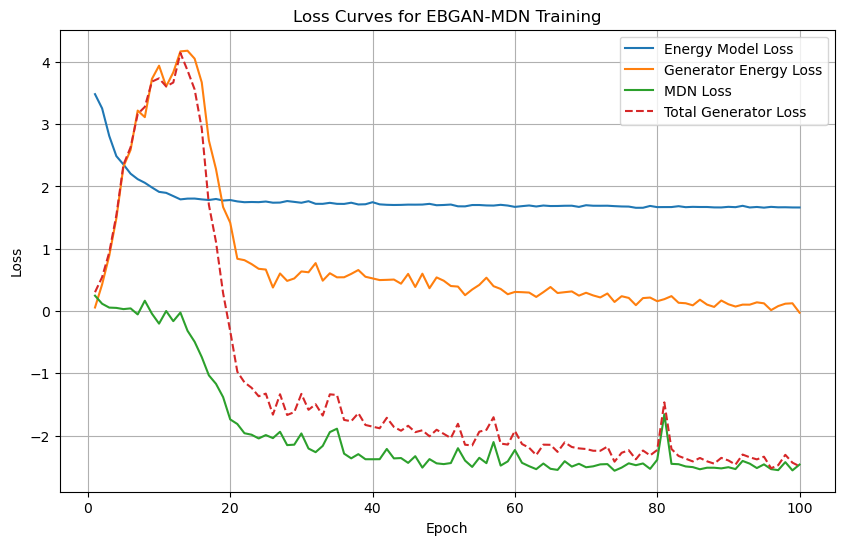

Run 1 - KL Divergence: 1.6744, Wasserstein Distance: 0.0083, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


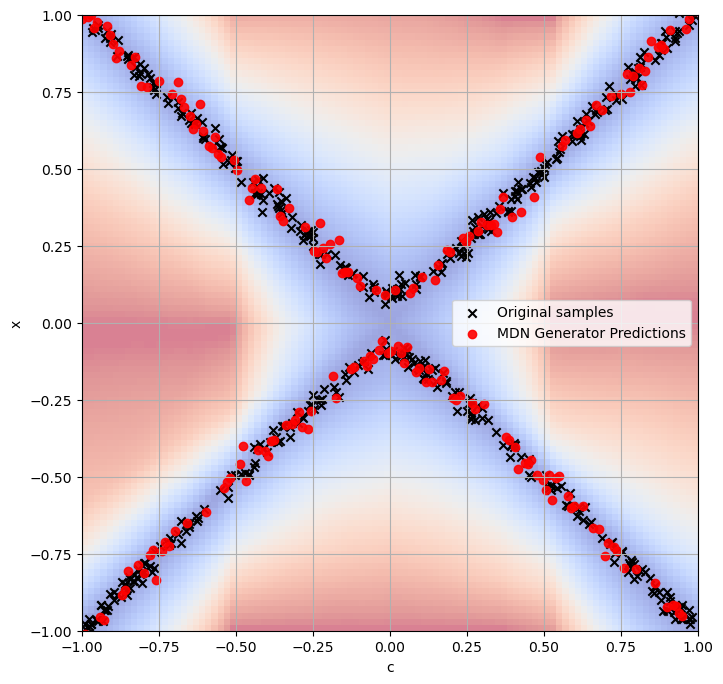


=== Training Run 2 ===
Epoch [1/100], Energy Loss: 3.4907, Generator Loss: 0.1217, Generator Energy Loss: -0.0068, Generator MDN Loss: 0.1284
Epoch [2/100], Energy Loss: 3.3380, Generator Loss: -0.0095, Generator Energy Loss: -0.0472, Generator MDN Loss: 0.0377
Epoch [3/100], Energy Loss: 3.0797, Generator Loss: 0.1143, Generator Energy Loss: 0.0910, Generator MDN Loss: 0.0232
Epoch [4/100], Energy Loss: 2.8017, Generator Loss: 0.4185, Generator Energy Loss: 0.3796, Generator MDN Loss: 0.0389
Epoch [5/100], Energy Loss: 2.5557, Generator Loss: 0.6797, Generator Energy Loss: 0.6687, Generator MDN Loss: 0.0109
Epoch [6/100], Energy Loss: 2.3977, Generator Loss: 0.9494, Generator Energy Loss: 0.9513, Generator MDN Loss: -0.0019
Epoch [7/100], Energy Loss: 2.3321, Generator Loss: 1.0365, Generator Energy Loss: 1.0684, Generator MDN Loss: -0.0320
Epoch [8/100], Energy Loss: 2.2196, Generator Loss: 1.2462, Generator Energy Loss: 1.3615, Generator MDN Loss: -0.1153
Epoch [9/100], Energy Loss

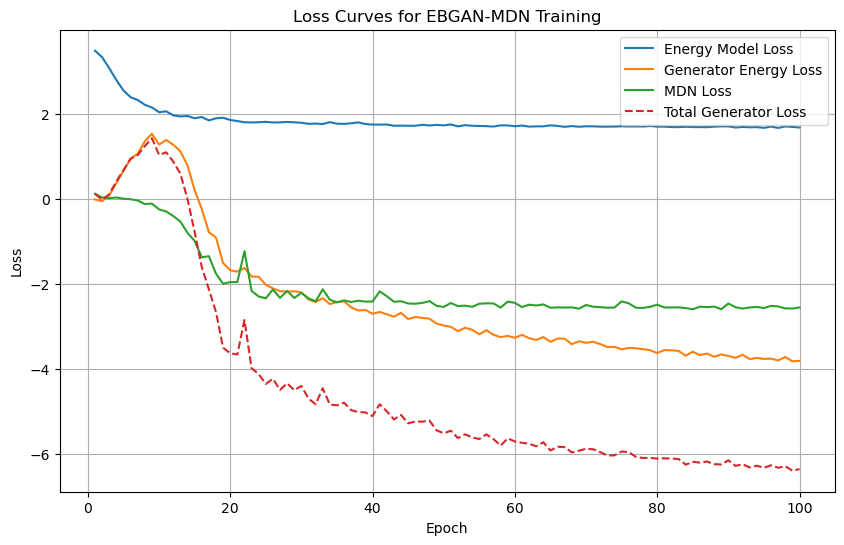

Run 2 - KL Divergence: 1.4677, Wasserstein Distance: 0.0075, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


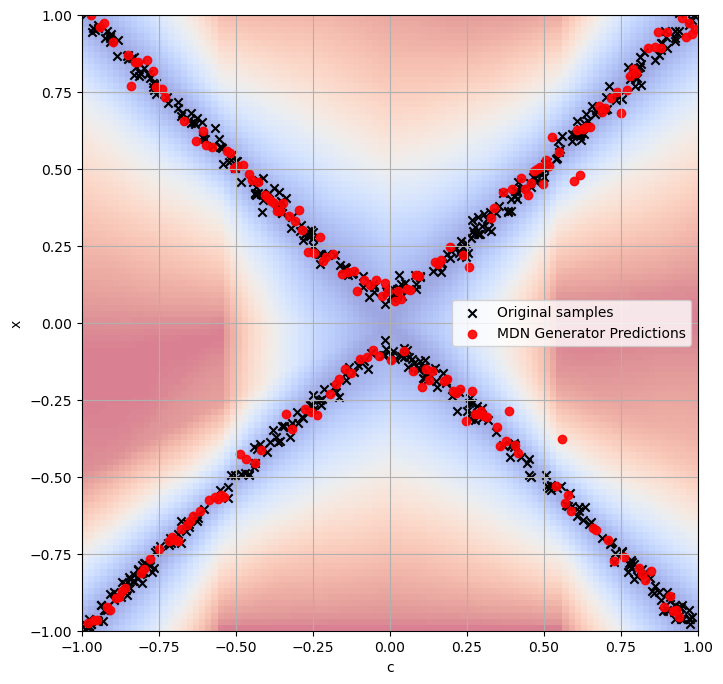


=== Training Run 3 ===
Epoch [1/100], Energy Loss: 3.4848, Generator Loss: 0.3879, Generator Energy Loss: 0.1791, Generator MDN Loss: 0.2088
Epoch [2/100], Energy Loss: 3.2936, Generator Loss: 0.8144, Generator Energy Loss: 0.7155, Generator MDN Loss: 0.0988
Epoch [3/100], Energy Loss: 2.9567, Generator Loss: 1.7759, Generator Energy Loss: 1.7165, Generator MDN Loss: 0.0593
Epoch [4/100], Energy Loss: 2.6707, Generator Loss: 2.6742, Generator Energy Loss: 2.6350, Generator MDN Loss: 0.0392
Epoch [5/100], Energy Loss: 2.4694, Generator Loss: 3.7803, Generator Energy Loss: 3.7302, Generator MDN Loss: 0.0501
Epoch [6/100], Energy Loss: 2.3283, Generator Loss: 4.7017, Generator Energy Loss: 4.7242, Generator MDN Loss: -0.0224
Epoch [7/100], Energy Loss: 2.2108, Generator Loss: 5.2863, Generator Energy Loss: 5.3696, Generator MDN Loss: -0.0832
Epoch [8/100], Energy Loss: 2.1241, Generator Loss: 6.0762, Generator Energy Loss: 6.1428, Generator MDN Loss: -0.0666
Epoch [9/100], Energy Loss: 2

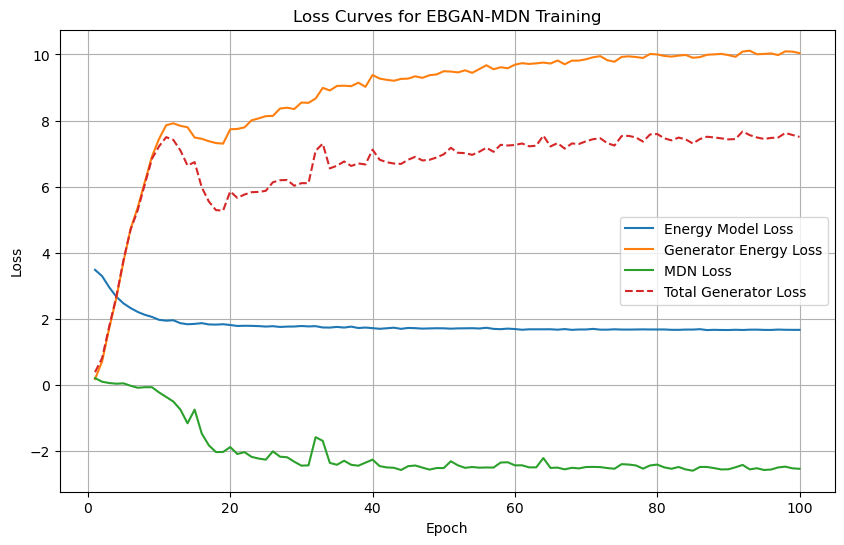

Run 3 - KL Divergence: 1.3428, Wasserstein Distance: 0.0071, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


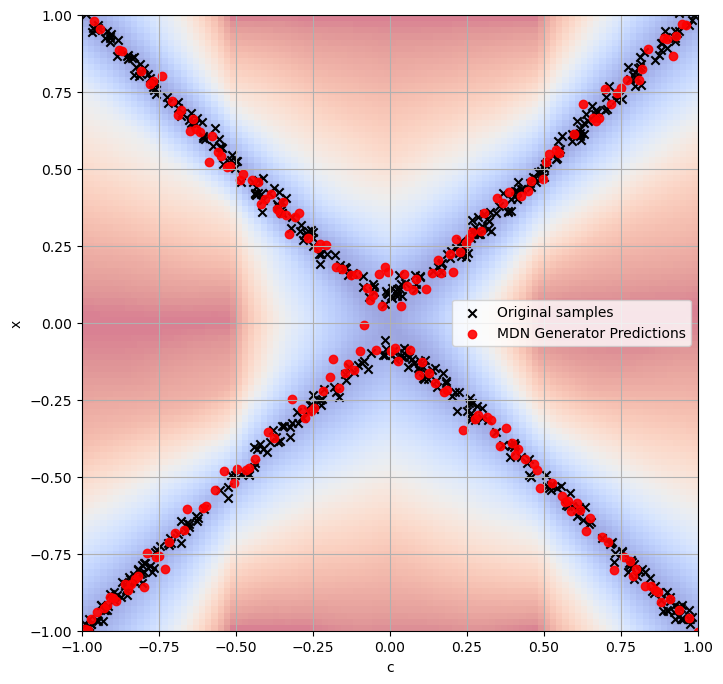


=== Training Run 4 ===
Epoch [1/100], Energy Loss: 3.4878, Generator Loss: 0.4029, Generator Energy Loss: 0.2344, Generator MDN Loss: 0.1685
Epoch [2/100], Energy Loss: 3.2731, Generator Loss: 0.8163, Generator Energy Loss: 0.7404, Generator MDN Loss: 0.0758
Epoch [3/100], Energy Loss: 2.9687, Generator Loss: 1.1745, Generator Energy Loss: 1.1398, Generator MDN Loss: 0.0348
Epoch [4/100], Energy Loss: 2.6765, Generator Loss: 1.7735, Generator Energy Loss: 1.7114, Generator MDN Loss: 0.0622
Epoch [5/100], Energy Loss: 2.4691, Generator Loss: 2.1793, Generator Energy Loss: 2.1396, Generator MDN Loss: 0.0396
Epoch [6/100], Energy Loss: 2.3380, Generator Loss: 2.7696, Generator Energy Loss: 2.6808, Generator MDN Loss: 0.0888
Epoch [7/100], Energy Loss: 2.2368, Generator Loss: 3.2388, Generator Energy Loss: 3.2178, Generator MDN Loss: 0.0210
Epoch [8/100], Energy Loss: 2.1697, Generator Loss: 3.6023, Generator Energy Loss: 3.6432, Generator MDN Loss: -0.0409
Epoch [9/100], Energy Loss: 2.0

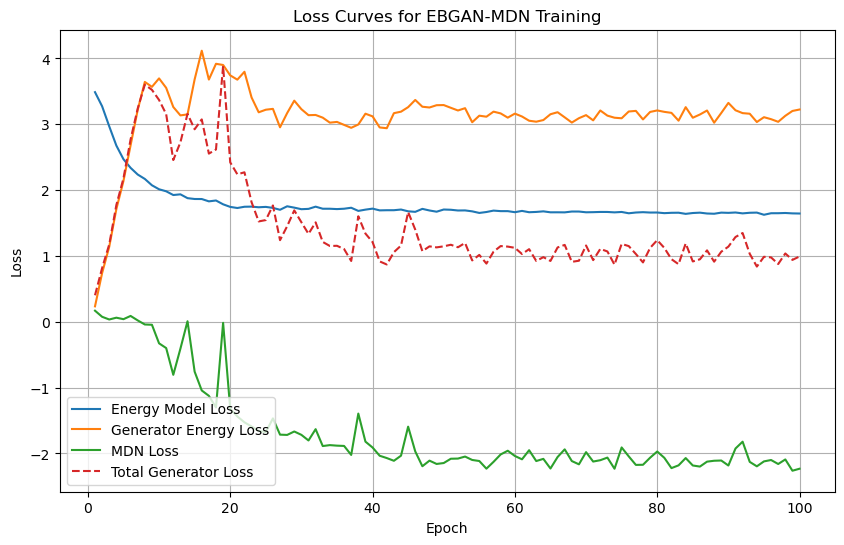

Run 4 - KL Divergence: 1.8628, Wasserstein Distance: 0.0059, Mode Coverage (%): 100.0, Avgerage Modes coveraged: 2.0


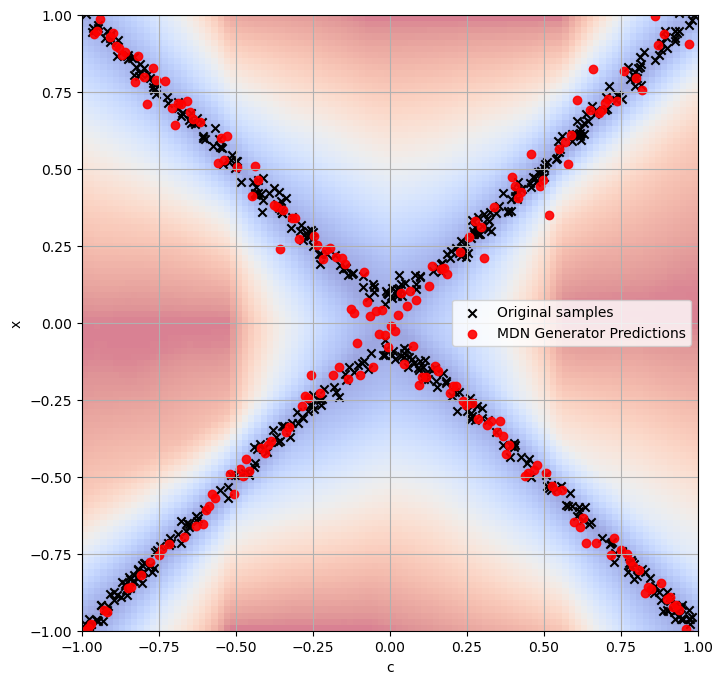


=== Training Run 5 ===
Epoch [1/100], Energy Loss: 3.4744, Generator Loss: 0.2438, Generator Energy Loss: 0.0582, Generator MDN Loss: 0.1855
Epoch [2/100], Energy Loss: 3.2470, Generator Loss: 0.2566, Generator Energy Loss: 0.1884, Generator MDN Loss: 0.0682
Epoch [3/100], Energy Loss: 2.9575, Generator Loss: 0.5463, Generator Energy Loss: 0.5132, Generator MDN Loss: 0.0331
Epoch [4/100], Energy Loss: 2.6784, Generator Loss: 0.7306, Generator Energy Loss: 0.6993, Generator MDN Loss: 0.0313
Epoch [5/100], Energy Loss: 2.4825, Generator Loss: 1.5606, Generator Energy Loss: 1.5080, Generator MDN Loss: 0.0526
Epoch [6/100], Energy Loss: 2.3514, Generator Loss: 1.9694, Generator Energy Loss: 1.9196, Generator MDN Loss: 0.0499
Epoch [7/100], Energy Loss: 2.2053, Generator Loss: 2.4985, Generator Energy Loss: 2.4814, Generator MDN Loss: 0.0171
Epoch [8/100], Energy Loss: 2.0958, Generator Loss: 2.8101, Generator Energy Loss: 2.8901, Generator MDN Loss: -0.0800
Epoch [9/100], Energy Loss: 2.0

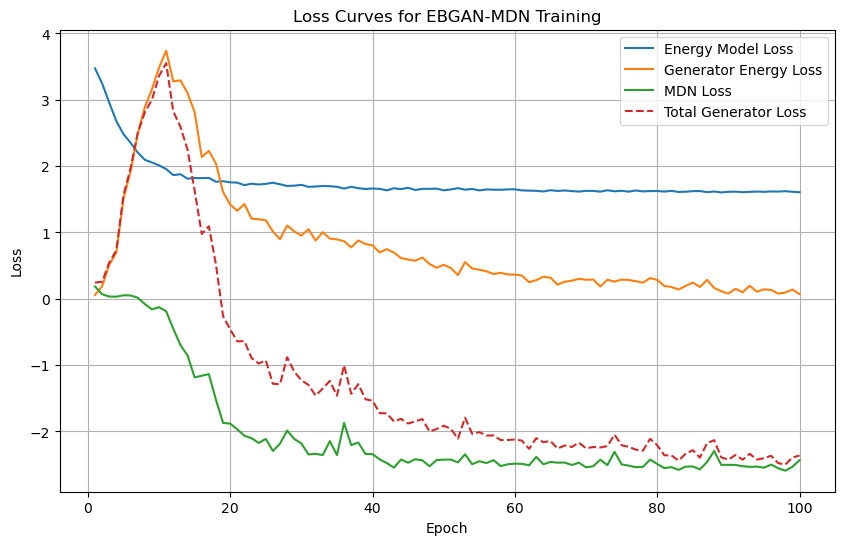

Run 5 - KL Divergence: 1.1213, Wasserstein Distance: 0.0067, Mode Coverage (%): 99.0, Avgerage Modes coveraged: 1.99


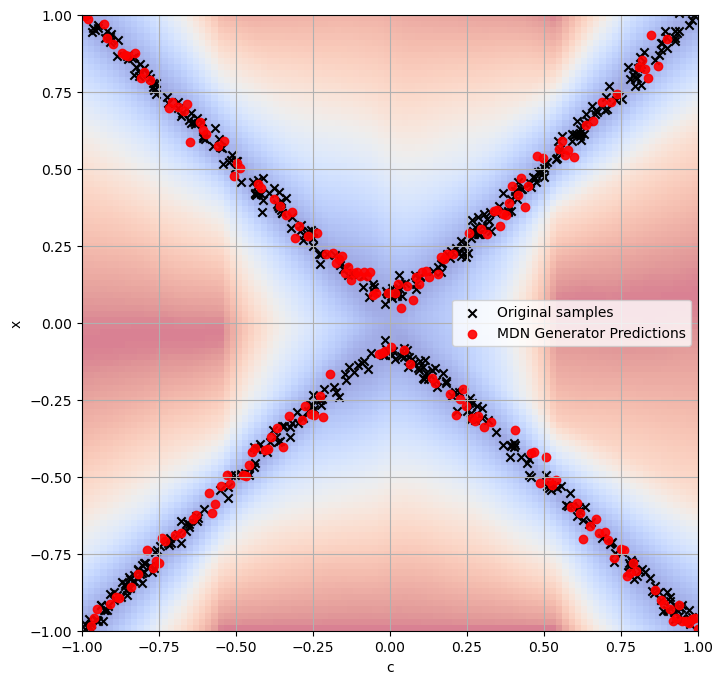

KL Divergence: 1.4938 ± 0.2573
Wasserstein Distance: 0.0071 ± 0.0008
Mode Coverage (%): 99.4000 ± 0.4899
Avgerage Modes coveraged: 1.9940 ± 0.0049


In [20]:
metrics_results_laplace = train_and_evaluate_noise(
    num_trials=NUM_TRIALS,
    dataloader=dataloader,
    test_x_vals=test_x_vals,
    test_y_vals_transposed=test_y_vals_transposed,
    num_epochs=num_epochs,
    y_min=y_min,
    y_max=y_max,
    neg_count=neg_count,
    repeat_energy_updates=repeat_energy_updates,
    device=device,
    alpha=alpha,
    dynamic_scaling_true=dynamic_scaling_true,
    min_scale=min_scale,
    y_multi=y_multi,
    noise_type=NoiseType.LAPLACE,
)